## Import Libraries

In [1]:
#Import Libraries
import numpy as np
from random import sample
import pandas as pd
import matplotlib.pyplot as plt
from collections import deque
import math

## Import the Reward and Transition Matrix from the xls file

In [2]:
#Import the reward table and the transition matrix
r_table = pd.read_excel('environment_matrices.xlsx', sheet_name ='rewards', index_col=0)
state_value_function = pd.read_excel('environment_matrices.xlsx', sheet_name ='State value function')
transition_matrix = pd.read_excel('environment_matrices.xlsx', sheet_name ='transition',index_col=0)

## Initialize important parameters and Q matrix

In [3]:
#Initialize parameters
total_episodes = 10000 #Total episodes
number_of_steps = 100 #Maximum steps per episode
epsilon = 1 #Highest exploration probability
epsilon_min = 0.1 # Lowest exploration probability 
decay_rate = 0.996 #Exponential decay rate for exploration probability

#Q Learning parameters
alpha = 0.15 #Learning rate
gamma = 0.999 #Discount rate

#Initialization of the Q matrix
q_table = pd.DataFrame(np.matrix(np.zeros([16,4])).astype("float32"), columns = transition_matrix.columns, index = transition_matrix.index)
q_table.head()

,UP,DOWN,RIGHT,LEFT
A,0.0,0.0,0.0,0.0
B,0.0,0.0,0.0,0.0
C,0.0,0.0,0.0,0.0
D,0.0,0.0,0.0,0.0
E,0.0,0.0,0.0,0.0


In [4]:
#%% Define the optimal state value table
optimal_state_value_function = np.array(state_value_function)
optimal_state_value_function

# plot_values(optimal_state_value_function)

array([[-6, -5, -4, -5],
       [-5,  0, -3,  0],
       [-4, -3, -2,  0],
       [ 0, -2, -1,  0]])

## Random Policy

In [5]:
def random_policy(state):
    exploration_threshold = np.random.uniform(0,1)
    actions_list = ["UP", "DOWN", "RIGHT", "LEFT"]

    # Explore: We take a random action from the action list
    action = sample(actions_list, 1)[0]
    return action


## 'execute_action' Function

In [6]:
# Execution of the action selected from policy.
def execute_action(state, action):
    next_state = transition_matrix.loc[state,action] #return the next state
    reward = r_table.loc[state, next_state]
    end_episode_states = ['F', 'H', 'L', 'M', 'P']
    done = False #done is a flag to determine if my algorithm is going to terminate or not
    if (next_state in end_episode_states):
        done = True
    print('Current state', state)
    print('Next state', next_state)
    print ('Done', done)
    
    
    return next_state, reward, done

## 'update_Q' Function

In [7]:
#Update Q

def update_Q(current_state, next_state, action, reward, alpha, gamma):
    q_old = q_table.loc[current_state, action] #OLD Q value
    q_new = q_old + alpha * (reward + gamma * max(q_table.loc[next_state,:] - q_old))
    q_table.loc[current_state, action] = q_new
    
    print('Old Q value:       ', q_old)
    print('Updated Q value (Q new): ', q_new)

## Train the agent

In [8]:
#Training the agent
sum_reward = 0
episodes_rewards_list_per_10 = []


#Main
episodes_rewards_list = []
window = 100
# initialize average rewards
average_reward = deque(maxlen=total_episodes)
# initialize best average reward as negative infinity
best_average_reward = -math.inf
# initialize monitor for most recent rewards
check_rewards = deque(maxlen=window)

#EPISODES
for episode in range(1, total_episodes + 1):
    current_state = 'A'
    episode_reward = 0
    # Decide the value of epsilon before the start of the episode
    for step in range (number_of_steps):
        #Choose action depending on the value of epsilon
        action = random_policy(current_state)
        
        #Execute Action and calculate the next state, the reward and check if the episode is finished
        next_state, reward, done = execute_action(current_state, action)
        
        # Update the Q Matrix based on the new values
        update_Q(current_state, next_state, action, reward, alpha, gamma)
        current_state = next_state
        
        episode_reward += reward 
        
        if done:
            check_rewards.append(episode_reward)
            break

    if episode >= 100:
        average_reward = np.mean(check_rewards)
        if average_reward > best_average_reward:
            best_average_reward = average_reward
    print("\rEpisode {}/{} || Best average reward {}".format(episode, total_episodes, best_average_reward), end="")

    if best_average_reward > 83:
        print('\nThe environment is solved in {} episodes.'.format(episode-1), end = "")
        break
    
    episodes_rewards_list.append(episode_reward)
    print("\rEpsilon for this episode is: {}".format(epsilon))
    print("\rThe reward for this episode is: {}".format(episode_reward))
    
    episode_reward = 0


Current state A
Next state B
Done False
Old Q value:        0.0
Updated Q value (Q new):  -0.15
Current state B
Next state C
Done False
Old Q value:        0.0
Updated Q value (Q new):  -0.15
Current state C
Next state B
Done False
Old Q value:        0.0
Updated Q value (Q new):  -0.15
Current state B
Next state A
Done False
Old Q value:        0.0
Updated Q value (Q new):  -0.15
Current state A
Next state E
Done False
Old Q value:        0.0
Updated Q value (Q new):  -0.15
Current state E
Next state F
Done True
Old Q value:        0.0
Updated Q value (Q new):  -15.0
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        -0.15
Updated Q value (Q new):  -0.27752250506728887
Current state E
Next state E
Done False
Old Q value:        0.0
Updated Q value (Q new):  -0.15
Current state E
Next state A
Done False
Old Q value:        0.0
Updated Q value (Q new):  -0.15
Current state A
Next state A
Done False
Old Q valu

Old Q value:        -0.62307405
Updated Q value (Q new):  -0.7021839085116982
Current state E
Next state E
Done False
Old Q value:        -0.15
Updated Q value (Q new):  -0.3000000059604645
Current state E
Next state F
Done True
Old Q value:        -38.593575
Updated Q value (Q new):  -47.810327381515506
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        -1.2556903
Updated Q value (Q new):  -1.3227473970979453
Current state A
Next state E
Done False
Old Q value:        -0.7021839
Updated Q value (Q new):  -0.7694391498684883
Current state E
Next state I
Done False
Old Q value:        -0.15
Updated Q value (Q new):  -0.27752250506728887
Current state I
Next state E
Done False
Old Q value:        -0.1724775
Updated Q value (Q new):  -0.33821849275156857
Current state E
Next state E
Done False
Old Q value:        -0.3
Updated Q value (Q new):  -0.44663175740838046
Current state E
Next state A
Done False
Old Q v

Old Q value:        -0.45000002
Updated Q value (Q new):  -0.5937682423889636
Current state D
Next state D
Done False
Old Q value:        -0.59376824
Updated Q value (Q new):  -0.7159927955910563
Current state D
Next state C
Done False
Old Q value:        -0.51254845
Updated Q value (Q new):  -0.6691285159736872
Current state C
Next state D
Done False
Old Q value:        -0.6367695
Updated Q value (Q new):  -0.7525502951279283
Current state D
Next state D
Done False
Old Q value:        -0.40841326
Updated Q value (Q new):  -0.5584132611751557
Current state D
Next state H
Done True
Old Q value:        -15.0
Updated Q value (Q new):  -27.75225
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        -1.3974411
Updated Q value (Q new):  -1.4347704942286015
Current state E
Next state F
Done True
Old Q value:        -76.878365
Updated Q value (Q new):  -80.35814163322449
Epsilon for this episode is: 1
The reward for th

Old Q value:        -1.4078221
Updated Q value (Q new):  -1.4487139888554812
Current state C
Next state C
Done False
Old Q value:        -1.0872679
Updated Q value (Q new):  -1.1761947877436876
Current state C
Next state C
Done False
Old Q value:        -1.1761948
Updated Q value (Q new):  -1.2517960014313458
Current state C
Next state C
Done False
Old Q value:        -1.251796
Updated Q value (Q new):  -1.316068378725648
Current state C
Next state G
Done False
Old Q value:        -0.6797064
Updated Q value (Q new):  -0.7278523914307355
Current state G
Next state K
Done False
Old Q value:        -0.47810328
Updated Q value (Q new):  -0.24211165590286257
Current state K
Next state G
Done False
Old Q value:        -0.2775225
Updated Q value (Q new):  -0.3859357570558786
Current state G
Next state H
Done True
Old Q value:        -15.0
Updated Q value (Q new):  -27.75225
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state B
Done False
Old Q valu

Old Q value:        27.75225
Updated Q value (Q new):  38.59357590827942
Epsilon for this episode is: 1
The reward for this episode is: 82.0
Current state A
Next state E
Done False
Old Q value:        -2.012688
Updated Q value (Q new):  -2.032914115345478
Current state E
Next state E
Done False
Old Q value:        -1.5754118
Updated Q value (Q new):  -1.661163817715645
Current state E
Next state I
Done False
Old Q value:        -1.1466632
Updated Q value (Q new):  -1.1673926514804362
Current state I
Next state M
Done True
Old Q value:        -62.3074
Updated Q value (Q new):  -67.97063589725494
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        -2.0329142
Updated Q value (Q new):  -2.0532157573878766
Current state E
Next state F
Done True
Old Q value:        -95.52026
Updated Q value (Q new):  -96.20655216064453
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state 

Old Q value:        -2.6299286
Updated Q value (Q new):  -2.629582304775715
Current state B
Next state A
Done False
Old Q value:        -2.8990753
Updated Q value (Q new):  -2.941701378715038
Current state A
Next state A
Done False
Old Q value:        -3.1067145
Updated Q value (Q new):  -3.1182258593678474
Current state A
Next state A
Done False
Old Q value:        -3.1570907
Updated Q value (Q new):  -3.161053166103363
Current state A
Next state A
Done False
Old Q value:        -3.1182258
Updated Q value (Q new):  -3.1280122130274775
Current state A
Next state A
Done False
Old Q value:        -3.1610532
Updated Q value (Q new):  -3.1644218997478486
Current state A
Next state A
Done False
Old Q value:        -3.1644218
Updated Q value (Q new):  -3.1672857287287712
Current state A
Next state A
Done False
Old Q value:        -3.1280122
Updated Q value (Q new):  -3.1363320932865144
Current state A
Next state A
Done False
Old Q value:        -3.1672857
Updated Q value (Q new):  -3.1697204

Updated Q value (Q new):  -3.194268559348583
Current state A
Next state A
Done False
Old Q value:        -3.1911948
Updated Q value (Q new):  -3.191742414498329
Current state A
Next state A
Done False
Old Q value:        -3.1917424
Updated Q value (Q new):  -3.1922079970002173
Current state A
Next state A
Done False
Old Q value:        -3.192208
Updated Q value (Q new):  -3.192603853607178
Current state A
Next state A
Done False
Old Q value:        -3.1942685
Updated Q value (Q new):  -3.194355514025688
Current state A
Next state A
Done False
Old Q value:        -3.1926038
Updated Q value (Q new):  -3.1929403215885164
Current state A
Next state A
Done False
Old Q value:        -3.1929402
Updated Q value (Q new):  -3.1932263193726538
Current state A
Next state B
Done False
Old Q value:        -2.5586739
Updated Q value (Q new):  -2.5470982850670816
Current state B
Next state F
Done True
Old Q value:        -99.44728
Updated Q value (Q new):  -99.54510584335327
Epsilon for this episode i

Old Q value:        -1.3573701
Updated Q value (Q new):  -1.3233729630947113
Current state C
Next state B
Done False
Old Q value:        -1.9861253
Updated Q value (Q new):  -2.0368119043707846
Current state B
Next state B
Done False
Old Q value:        -2.4316046
Updated Q value (Q new):  -2.4155361089885234
Current state B
Next state B
Done False
Old Q value:        -2.4155362
Updated Q value (Q new):  -2.4018755089461803
Current state B
Next state C
Done False
Old Q value:        -1.323373
Updated Q value (Q new):  -1.2944702621519566
Current state C
Next state C
Done False
Old Q value:        -1.3166144
Updated Q value (Q new):  -1.2887244632959365
Current state C
Next state D
Done False
Old Q value:        -1.4438777
Updated Q value (Q new):  -1.4836683486044406
Current state D
Next state C
Done False
Old Q value:        -0.9101319
Updated Q value (Q new):  -0.9431533419251442
Current state C
Next state C
Done False
Old Q value:        -1.2887244
Updated Q value (Q new):  -1.26501

Old Q value:        -0.15
Updated Q value (Q new):  0.547510385632515
Current state N
Next state N
Done False
Old Q value:        0.5475104
Updated Q value (Q new):  1.1404988672733305
Current state N
Next state M
Done True
Old Q value:        -15.0
Updated Q value (Q new):  -27.75225
Epsilon for this episode is: 1
The reward for this episode is: -120.0
Current state A
Next state A
Done False
Old Q value:        -3.03648
Updated Q value (Q new):  -3.017274477386475
Current state A
Next state E
Done False
Old Q value:        -1.9073143
Updated Q value (Q new):  -1.8969060002923013
Current state E
Next state I
Done False
Old Q value:        -0.8368552
Updated Q value (Q new):  -0.7525251770198346
Current state I
Next state E
Done False
Old Q value:        -1.6651894
Updated Q value (Q new):  -1.6784266498535871
Current state E
Next state A
Done False
Old Q value:        -2.9816394
Updated Q value (Q new):  -2.9690920901834965
Current state A
Next state A
Done False
Old Q value:        -3

Current state G
Next state C
Done False
Old Q value:        -0.36314002
Updated Q value (Q new):  -0.4534692592203617
Current state C
Next state C
Done False
Old Q value:        -1.2650138
Updated Q value (Q new):  -1.2201972634255887
Current state C
Next state D
Done False
Old Q value:        -1.5174963
Updated Q value (Q new):  -1.5462552442729474
Current state D
Next state C
Done False
Old Q value:        -0.9431533
Updated Q value (Q new):  -0.9465675748884678
Current state C
Next state B
Done False
Old Q value:        -2.1043186
Updated Q value (Q new):  -2.1066287639677523
Current state B
Next state C
Done False
Old Q value:        -1.118734
Updated Q value (Q new):  -1.0958374813735485
Current state C
Next state C
Done False
Old Q value:        -1.2201973
Updated Q value (Q new):  -1.182096521061659
Current state C
Next state D
Done False
Old Q value:        -1.5462552
Updated Q value (Q new):  -1.5707046090602874
Current state D
Next state D
Done False
Old Q value:        -0.70

Old Q value:        -2.3842654
Updated Q value (Q new):  -2.3570719593048097
Current state A
Next state A
Done False
Old Q value:        -2.3570719
Updated Q value (Q new):  -2.333953365921974
Current state A
Next state B
Done False
Old Q value:        -2.1166768
Updated Q value (Q new):  -2.1137040332734585
Current state B
Next state A
Done False
Old Q value:        -2.6536555
Updated Q value (Q new):  -2.5860939580917357
Current state A
Next state E
Done False
Old Q value:        -1.2017932
Updated Q value (Q new):  -1.138874849843979
Current state E
Next state E
Done False
Old Q value:        -1.5045177
Updated Q value (Q new):  -1.3962360670506955
Current state E
Next state E
Done False
Old Q value:        -1.3962361
Updated Q value (Q new):  -1.3041804542720317
Current state E
Next state A
Done False
Old Q value:        -2.7587872
Updated Q value (Q new):  -2.6660433019816874
Current state A
Next state A
Done False
Old Q value:        -2.3799045
Updated Q value (Q new):  -2.343936

Current state A
Next state A
Done False
Old Q value:        -1.9774259
Updated Q value (Q new):  -1.9057266723871231
Current state A
Next state A
Done False
Old Q value:        -1.8813485
Updated Q value (Q new):  -1.8240464349269867
Current state A
Next state A
Done False
Old Q value:        -1.8240465
Updated Q value (Q new):  -1.7753311412096024
Current state A
Next state E
Done False
Old Q value:        -0.4979514
Updated Q value (Q new):  -0.3889513283729553
Current state E
Next state F
Done True
Old Q value:        -100.0845
Updated Q value (Q new):  -100.08684037322998
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        -1.9057267
Updated Q value (Q new):  -1.8284378820776939
Current state A
Next state B
Done False
Old Q value:        -2.059087
Updated Q value (Q new):  -2.053923161250353
Current state B
Next state F
Done True
Old Q value:        -100.09509
Updated Q value (Q new):  -100.0958431213379


Old Q value:        -100.09873
Updated Q value (Q new):  -100.09893700523376
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        -0.5606997
Updated Q value (Q new):  -0.4695274799287319
Current state A
Next state A
Done False
Old Q value:        -0.7753918
Updated Q value (Q new):  -0.6520479821622371
Current state A
Next state B
Done False
Old Q value:        -2.0166793
Updated Q value (Q new):  -2.0154735535740853
Current state B
Next state F
Done True
Old Q value:        -100.09894
Updated Q value (Q new):  -100.09911213073731
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        -0.46952748
Updated Q value (Q new):  -0.3920174185216427
Current state A
Next state A
Done False
Old Q value:        -0.652048
Updated Q value (Q new):  -0.5471872290492058
Current state A
Next state E
Done False
Old Q value:        1.0487245
Updated Q va

Next state E
Done False
Old Q value:        1.956955
Updated Q value (Q new):  1.982838738322258
Current state E
Next state F
Done True
Old Q value:        -100.098206
Updated Q value (Q new):  -100.09848946228027
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        1.9828387
Updated Q value (Q new):  2.0048438456475735
Current state E
Next state E
Done False
Old Q value:        0.42848167
Updated Q value (Q new):  0.6834071860790253
Current state E
Next state A
Done False
Old Q value:        -0.19298628
Updated Q value (Q new):  -0.013641424226760901
Current state A
Next state B
Done False
Old Q value:        -1.6612453
Updated Q value (Q new):  -1.5821015741109847
Current state B
Next state C
Done False
Old Q value:        -0.9626077
Updated Q value (Q new):  -0.9572177422165871
Current state C
Next state B
Done False
Old Q value:        -1.8949891
Updated Q value (Q new):  -1.7808188544690609
Current state 

Old Q value:        -0.40638697
Updated Q value (Q new):  -0.34251194711327554
Current state B
Next state A
Done False
Old Q value:        1.0208738
Updated Q value (Q new):  1.0937544310212135
Current state A
Next state A
Done False
Old Q value:        1.3038479
Updated Q value (Q new):  1.3343248825013638
Current state A
Next state A
Done False
Old Q value:        1.2549525
Updated Q value (Q new):  1.2927564930140971
Current state A
Next state A
Done False
Old Q value:        1.3343248
Updated Q value (Q new):  1.360234842634201
Current state A
Next state B
Done False
Old Q value:        -0.34251195
Updated Q value (Q new):  -0.27728742854595184
Current state B
Next state C
Done False
Old Q value:        -0.9361653
Updated Q value (Q new):  -0.925474979543686
Current state C
Next state B
Done False
Old Q value:        -1.7808188
Updated Q value (Q new):  -1.5000640213727952
Current state B
Next state B
Done False
Old Q value:        -1.029973
Updated Q value (Q new):  -0.86173249094

Old Q value:        1.2648103
Updated Q value (Q new):  1.5720498153805733
Current state E
Next state I
Done False
Old Q value:        4.316125
Updated Q value (Q new):  4.3945212786912915
Current state I
Next state M
Done True
Old Q value:        -98.06621
Updated Q value (Q new):  -98.37098663406373
Epsilon for this episode is: 1
The reward for this episode is: -118.0
Current state A
Next state A
Done False
Old Q value:        1.6189073
Updated Q value (Q new):  1.6611684003889562
Current state A
Next state B
Done False
Old Q value:        0.22988877
Updated Q value (Q new):  0.2619115774095059
Current state B
Next state B
Done False
Old Q value:        0.00795943
Updated Q value (Q new):  0.07323834787756203
Current state B
Next state B
Done False
Old Q value:        0.07323835
Updated Q value (Q new):  0.128735226893425
Current state B
Next state C
Done False
Old Q value:        -0.88981247
Updated Q value (Q new):  -0.8824496836781501
Current state C
Next state B
Done False
Old Q 

Next state A
Done False
Old Q value:        1.9461386
Updated Q value (Q new):  2.0178967947363855
Current state A
Next state B
Done False
Old Q value:        0.6742033
Updated Q value (Q new):  0.7255557646930217
Current state B
Next state C
Done False
Old Q value:        -0.4586217
Updated Q value (Q new):  -0.3240999794483185
Current state C
Next state G
Done False
Old Q value:        1.4400885
Updated Q value (Q new):  1.7457166419386863
Current state G
Next state H
Done True
Old Q value:        -55.645947
Updated Q value (Q new):  -62.30740141925812
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state A
Done False
Old Q value:        2.2836497
Updated Q value (Q new):  2.3048318246245385
Current state A
Next state A
Done False
Old Q value:        2.241448
Updated Q value (Q new):  2.268954000544548
Current state A
Next state E
Done False
Old Q value:        3.4260063
Updated Q value (Q new):  3.4875286633729936
Current state E
Next state

Current state E
Next state A
Done False
Old Q value:        2.3612463
Updated Q value (Q new):  2.4476814690947535
Current state A
Next state B
Done False
Old Q value:        1.1969954
Updated Q value (Q new):  1.2283295495569706
Current state B
Next state A
Done False
Old Q value:        2.4071
Updated Q value (Q new):  2.486663919723034
Current state A
Next state B
Done False
Old Q value:        1.2283295
Updated Q value (Q new):  1.2668909310162066
Current state B
Next state F
Done True
Old Q value:        -100.10006
Updated Q value (Q new):  -100.10006559181214
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        1.2668909
Updated Q value (Q new):  1.299673857742548
Current state B
Next state A
Done False
Old Q value:        2.4866638
Updated Q value (Q new):  2.554305132007599
Current state A
Next state B
Done False
Old Q value:        1.2996739
Updated Q value (Q new):  1.3376803944885731
Current state B

Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        1.6931559
Updated Q value (Q new):  1.70644122864604
Current state B
Next state A
Done False
Old Q value:        2.7828145
Updated Q value (Q new):  2.8336878377914427
Current state A
Next state A
Done False
Old Q value:        2.934774
Updated Q value (Q new):  2.9628761380672457
Current state A
Next state A
Done False
Old Q value:        2.962876
Updated Q value (Q new):  2.986767188966274
Current state A
Next state E
Done False
Old Q value:        4.1233106
Updated Q value (Q new):  4.137696462965011
Current state E
Next state I
Done False
Old Q value:        5.2203135
Updated Q value (Q new):  5.266132724928856
Current state I
Next state J
Done False
Old Q value:        6.5270815
Updated Q value (Q new):  6.795373916196823
Current state J
Next state N
Done False
Old Q value:        2.8802192
Updated Q value (Q new):  3.1236512481331826
Current state N
Ne

Current state G
Next state H
Done True
Old Q value:        -62.3074
Updated Q value (Q new):  -67.97063589725494
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        3.1508183
Updated Q value (Q new):  3.1762389650583267
Current state A
Next state B
Done False
Old Q value:        1.9661592
Updated Q value (Q new):  1.9777550374448298
Current state B
Next state C
Done False
Old Q value:        1.256782
Updated Q value (Q new):  1.4681964518427848
Current state C
Next state B
Done False
Old Q value:        0.99586505
Updated Q value (Q new):  1.1528594334840774
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        3.176239
Updated Q value (Q new):  3.1978503440380095
Current state A
Next state A
Done False
Old Q value:    

Current state A
Next state A
Done False
Old Q value:        3.448512
Updated Q value (Q new):  3.4627559237003327
Current state A
Next state A
Done False
Old Q value:        3.3865542
Updated Q value (Q new):  3.4100824692964555
Current state A
Next state E
Done False
Old Q value:        4.544567
Updated Q value (Q new):  4.559874976754188
Current state E
Next state A
Done False
Old Q value:        3.2576249
Updated Q value (Q new):  3.302767049086094
Current state A
Next state A
Done False
Old Q value:        3.4100826
Updated Q value (Q new):  3.432378974711895
Current state A
Next state E
Done False
Old Q value:        4.559875
Updated Q value (Q new):  4.572888990736008
Current state E
Next state I
Done False
Old Q value:        5.6477227
Updated Q value (Q new):  5.7329347280979155
Current state I
Next state E
Done False
Old Q value:        3.263269
Updated Q value (Q new):  3.4833483983278275
Current state E
Next state F
Done True
Old Q value:        -100.10005
Updated Q value (Q

Old Q value:        4.7033563
Updated Q value (Q new):  4.792547691869736
Current state E
Next state I
Done False
Old Q value:        6.299562
Updated Q value (Q new):  6.410305730509758
Current state I
Next state E
Done False
Old Q value:        4.040928
Updated Q value (Q new):  4.245979122281074
Current state E
Next state I
Done False
Old Q value:        6.4103055
Updated Q value (Q new):  6.504454336285591
Current state I
Next state M
Done True
Old Q value:        -99.44728
Updated Q value (Q new):  -99.54510584335327
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        4.882481
Updated Q value (Q new):  4.97553375787735
Current state E
Next state F
Done True
Old Q value:        -100.10007
Updated Q value (Q new):  -100.10007207794189
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        4.975534
Updated Q value (Q new):  5.0546426

Old Q value:        -76.878365
Updated Q value (Q new):  -80.35814163322449
Epsilon for this episode is: 1
The reward for this episode is: -116.0
Current state A
Next state A
Done False
Old Q value:        4.1563926
Updated Q value (Q new):  4.211977875137329
Current state A
Next state B
Done False
Old Q value:        3.3813276
Updated Q value (Q new):  3.440633613657951
Current state B
Next state B
Done False
Old Q value:        2.5693455
Updated Q value (Q new):  2.750326984715462
Current state B
Next state C
Done False
Old Q value:        4.7780976
Updated Q value (Q new):  4.951935092830658
Current state C
Next state G
Done False
Old Q value:        6.939175
Updated Q value (Q new):  7.1708398532152176
Current state G
Next state K
Done False
Old Q value:        9.486154
Updated Q value (Q new):  11.441536985063554
Current state K
Next state G
Done False
Old Q value:        1.8607396
Updated Q value (Q new):  3.146422048473358
Current state G
Next state F
Done True
Old Q value:     

Old Q value:        3.1971586
Updated Q value (Q new):  3.4008314260601997
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        6.7278085
Updated Q value (Q new):  6.80380512535572
Current state E
Next state E
Done False
Old Q value:        5.4848957
Updated Q value (Q new):  5.74714283452034
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        4.1877522
Updated Q value (Q new):  4.2429846361398695
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next st

Current state A
Next state A
Done False
Old Q value:        5.9387064
Updated Q value (Q new):  5.982430112481118
Current state A
Next state E
Done False
Old Q value:        7.2314906
Updated Q value (Q new):  7.2678339807748795
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        5.824829
Updated Q value (Q new):  5.891063413548469
Current state A
Next state B
Done False
Old Q value:        4.752321
Updated Q value (Q new):  4.801858411002159
Current state B
Next state A
Done False
Old Q value:        5.21521
Updated Q value (Q new):  5.372795701146126
Current state A
Next state A
Done False
Old Q value:        5.891063
Updated Q value (Q new):  5.947372343683242
Current state A
Next state B
Done False
Old Q value:        4.8018584
Updated Q value (Q new):  4.843972851538658
Current state B
Nex

Done False
Old Q value:        6.3759236
Updated Q value (Q new):  6.407096730303764
Current state A
Next state B
Done False
Old Q value:        5.1589375
Updated Q value (Q new):  5.180815951275825
Current state B
Next state A
Done False
Old Q value:        6.0953593
Updated Q value (Q new):  6.168574983716011
Current state A
Next state E
Done False
Old Q value:        7.5849533
Updated Q value (Q new):  7.612935052680969
Current state E
Next state A
Done False
Old Q value:        5.814646
Updated Q value (Q new):  5.934119418668747
Current state A
Next state E
Done False
Old Q value:        7.612935
Updated Q value (Q new):  7.636723744344711
Current state E
Next state A
Done False
Old Q value:        5.934119
Updated Q value (Q new):  6.039254477977753
Current state A
Next state A
Done False
Old Q value:        6.4577293
Updated Q value (Q new):  6.484401617288589
Current state A
Next state E
Done False
Old Q value:        7.6367235
Updated Q value (Q new):  7.656947496938705
Curren

Current state A
Next state B
Done False
Old Q value:        5.4311314
Updated Q value (Q new):  5.456731401157379
Current state B
Next state A
Done False
Old Q value:        6.519419
Updated Q value (Q new):  6.5948743643522265
Current state A
Next state B
Done False
Old Q value:        5.4567313
Updated Q value (Q new):  5.47849520418644
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        6.8611584
Updated Q value (Q new):  6.885403926277161
Current state A
Next state B
Done False
Old Q value:        5.478495
Updated Q value (Q new):  5.496997700095177
Current state B
Next state A
Done False
Old Q value:        6.5948744
Updated Q value (Q new):  6.659022593069077
Current state A
Next state B
Done False
Old Q value:        5.496998
Updated Q value (Q new):  5.52112727572918
Current state B
Nex

Old Q value:        9.661135
Updated Q value (Q new):  10.238811456537247
Current state G
Next state C
Done False
Old Q value:        2.5905266
Updated Q value (Q new):  3.5866220748901365
Current state C
Next state D
Done False
Old Q value:        3.943857
Updated Q value (Q new):  4.198944065749645
Current state D
Next state C
Done False
Old Q value:        6.647141
Updated Q value (Q new):  7.035352806162834
Current state C
Next state D
Done False
Old Q value:        4.198944
Updated Q value (Q new):  4.473979922771454
Current state D
Next state D
Done False
Old Q value:        2.657517
Updated Q value (Q new):  3.163535643553734
Current state D
Next state C
Done False
Old Q value:        7.0353527
Updated Q value (Q new):  7.3653910059928895
Current state C
Next state D
Done False
Old Q value:        4.47398
Updated Q value (Q new):  4.757257862472534
Current state D
Next state H
Done True
Old Q value:        -99.545105
Updated Q value (Q new):  -99.62827099914551
Epsilon for this 

Old Q value:        -83.316475
Updated Q value (Q new):  -85.83150114860534
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        8.850545
Updated Q value (Q new):  8.87545357837677
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        7.2471733
Updated Q value (Q new):  7.4919787903308865
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        7.5640607
Updated Q value (Q new):  7.610572968173027
Current state A
Next state A
Done False
Old Q value:        7.610573
Updated Q value (Q new):  7.650115252876282
Current state A
Next state

Old Q value:        8.308527
Updated Q value (Q new):  8.431320399332046
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        8.08749
Updated Q value (Q new):  8.152368124485015
Current state A
Next state E
Done False
Old Q value:        9.052756
Updated Q value (Q new):  9.064026952934265
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        8.152369
Updated Q value (Q new):  8.207524550437928
Current state A
Next state A
Done False
Old Q value:        8.022484
Updated Q value (Q new):  8.097103055858613
Current state A
Next state A
Done False
Old Q value:        8.097103
Updated Q value (Q new):  8.16054

Old Q value:        8.765006
Updated Q value (Q new):  8.833299897384643
Current state A
Next state E
Done False
Old Q value:        9.516616
Updated Q value (Q new):  9.596789363861085
Current state E
Next state A
Done False
Old Q value:        8.40218
Updated Q value (Q new):  8.524843078184128
Current state A
Next state B
Done False
Old Q value:        10.221755
Updated Q value (Q new):  10.365684398841857
Current state B
Next state C
Done False
Old Q value:        12.183246
Updated Q value (Q new):  12.538017348003388
Current state C
Next state C
Done False
Old Q value:        8.138348
Updated Q value (Q new):  9.099247285127639
Current state C
Next state C
Done False
Old Q value:        9.099247
Updated Q value (Q new):  9.916155870103836
Current state C
Next state D
Done False
Old Q value:        5.5382347
Updated Q value (Q new):  5.82338157529831
Current state D
Next state D
Done False
Old Q value:        3.0962481
Updated Q value (Q new):  3.747326700615883
Current state D
Nex

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        10.458012
Updated Q value (Q new):  10.49406639304161
Current state E
Next state A
Done False
Old Q value:        9.14263
Updated Q value (Q new):  9.335028847694398
Current state A
Next state E
Done False
Old Q value:        10.494066
Updated Q value (Q new):  10.524718220758437
Current state E
Next state E
Done False
Old Q value:        10.120849
Updated Q value (Q new):  10.207427292823791
Current state E
Next state A
Done False
Old Q value:        9.335029
Updated Q value (Q new):  9.498596878767014
Current state A
Next state A
Done False
Old Q value:        9.673092
Updated Q value (Q new):  9.7860013422966
Current state A
Next state E
Done False
Old Q value:        10.524718
Updated Q value (Q new):  10.55077705783844
Current state E
Next state F
Done True
Old Q value:       

Current state B
Next state C
Done False
Old Q value:        13.09604
Updated Q value (Q new):  13.52743463807106
Current state C
Next state G
Done False
Old Q value:        16.975885
Updated Q value (Q new):  17.666844661331176
Current state G
Next state H
Done True
Old Q value:        -89.7874
Updated Q value (Q new):  -91.33275750808716
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        11.880801
Updated Q value (Q new):  11.977549178123475
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        10.442962
Updated Q value (Q new):  10.551270935058593
Current state A
Next state A
Done False
Old Q value:        10.5512705
Updated Q value (Q new):  10.64334965467453
Current state A
Next state A
Done False
Old Q value:     

Old Q value:        11.878311
Updated Q value (Q new):  12.231780381965637
Current state A
Next state B
Done False
Old Q value:        13.098785
Updated Q value (Q new):  13.194338951778413
Current state B
Next state B
Done False
Old Q value:        11.578537
Updated Q value (Q new):  11.901899763393402
Current state B
Next state B
Done False
Old Q value:        11.901899
Updated Q value (Q new):  12.17680626564026
Current state B
Next state A
Done False
Old Q value:        11.308658
Updated Q value (Q new):  11.747489449548722
Current state A
Next state A
Done False
Old Q value:        12.904019
Updated Q value (Q new):  13.103786206960677
Current state A
Next state A
Done False
Old Q value:        12.23178
Updated Q value (Q new):  12.532281963014603
Current state A
Next state B
Done False
Old Q value:        13.194339
Updated Q value (Q new):  13.275573673200608
Current state B
Next state C
Done False
Old Q value:        14.737448
Updated Q value (Q new):  15.026417966461182
Current

Current state A
Next state E
Done False
Old Q value:        16.165363
Updated Q value (Q new):  16.343921601104736
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        14.497671
Updated Q value (Q new):  14.62433176984787
Current state A
Next state E
Done False
Old Q value:        16.343922
Updated Q value (Q new):  16.495722982025146
Current state E
Next state I
Done False
Old Q value:        18.357944
Updated Q value (Q new):  18.7670169670105
Current state I
Next state I
Done False
Old Q value:        16.833122
Updated Q value (Q new):  17.470689343833925
Current state I
Next state I
Done False
Old Q value:        17.47069
Updated Q value (Q new):  18.012717371082307
Current state I
Next state E
Done False
Old Q value:        13.686494
Updated Q value (Q new):  14.29781031870842
Current state

Done False
Old Q value:        29.99428
Updated Q value (Q new):  32.8875612200737
Current state K
Next state J
Done False
Old Q value:        5.014758
Updated Q value (Q new):  8.733805607414245
Current state J
Next state I
Done False
Old Q value:        10.344445
Updated Q value (Q new):  12.213940559339523
Current state I
Next state I
Done False
Old Q value:        19.05178
Updated Q value (Q new):  19.616481810951232
Current state I
Next state M
Done True
Old Q value:        -100.08176
Updated Q value (Q new):  -100.08450536651611
Epsilon for this episode is: 1
The reward for this episode is: -118.0
Current state A
Next state A
Done False
Old Q value:        15.622354
Updated Q value (Q new):  15.904833324575424
Current state A
Next state A
Done False
Old Q value:        16.444525
Updated Q value (Q new):  16.603802179813385
Current state A
Next state B
Done False
Old Q value:        15.090321
Updated Q value (Q new):  15.142711892032624
Current state B
Next state C
Done False
Old 

Old Q value:        13.731002
Updated Q value (Q new):  14.504440388917923
Current state B
Next state A
Done False
Old Q value:        17.648478
Updated Q value (Q new):  17.8913642083168
Current state A
Next state A
Done False
Old Q value:        18.155539
Updated Q value (Q new):  18.32244212141037
Current state A
Next state A
Done False
Old Q value:        18.107914
Updated Q value (Q new):  18.281954077911376
Current state A
Next state B
Done False
Old Q value:        17.62951
Updated Q value (Q new):  17.81875783700943
Current state B
Next state A
Done False
Old Q value:        17.891365
Updated Q value (Q new):  18.09785501384735
Current state A
Next state A
Done False
Old Q value:        18.281954
Updated Q value (Q new):  18.42991404848099
Current state A
Next state A
Done False
Old Q value:        18.322443
Updated Q value (Q new):  18.464335939121245
Current state A
Next state A
Done False
Old Q value:        18.429914
Updated Q value (Q new):  18.555702805995942
Current stat

Updated Q value (Q new):  19.759114384269715
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        21.707888
Updated Q value (Q new):  22.015153829288483
Current state B
Next state A
Done False
Old Q value:        18.947712
Updated Q value (Q new):  19.257368119335176
Current state A
Next state A
Done False
Old Q value:        19.964396
Updated Q value (Q new):  20.121701663589477
Current state A
Next state B
Done False
Old Q value:        22.015154
Updated Q value (Q new):  22.276376219272613
Current state B
Next state B
Done False
Old Q value:        18.195915
Updated Q value (Q new):  19.02945047016144
Current state B
Next state A
Done False
Old Q value:        19.257368
Updated Q value (Q new):  19.559766531944273
Current state A
Next state A
Done False
Old Q value:        19.901077
Updated Q

Old Q value:        24.465958
Updated Q value (Q new):  24.659674478530885
Current state B
Next state B
Done False
Old Q value:        20.823517
Updated Q value (Q new):  21.563053435897828
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        22.949955
Updated Q value (Q new):  23.05615633440018
Current state A
Next state E
Done False
Old Q value:        23.055035
Updated Q value (Q new):  23.132514887714386
Current state E
Next state I
Done False
Old Q value:        24.573088
Updated Q value (Q new):  25.120979094791412
Current state I
Next state J
Done False
Old Q value:        29.230354
Updated Q value (Q new):  30.22167781600952
Current state J
Next state N
Done False
Old Q value:        14.994788
Updated Q value (Q new):  17.559993982696533
Current state N
Next state N
Done False
Old Q valu

Next state A
Done False
Old Q value:        24.138811
Updated Q value (Q new):  24.30769023542404
Current state A
Next state A
Done False
Old Q value:        24.30769
Updated Q value (Q new):  24.451262339210512
Current state A
Next state A
Done False
Old Q value:        24.160337
Updated Q value (Q new):  24.325990850543977
Current state A
Next state E
Done False
Old Q value:        24.793234
Updated Q value (Q new):  25.068873060417175
Current state E
Next state I
Done False
Old Q value:        27.633669
Updated Q value (Q new):  27.9977716299057
Current state I
Next state I
Done False
Old Q value:        25.508333
Updated Q value (Q new):  26.190917490196227
Current state I
Next state J
Done False
Old Q value:        31.064451
Updated Q value (Q new):  32.13290136671066
Current state J
Next state K
Done False
Old Q value:        39.195583
Updated Q value (Q new):  41.19240821609497
Current state K
Next state G
Done False
Old Q value:        18.943527
Updated Q value (Q new):  22.436

Old Q value:        17.625364
Updated Q value (Q new):  18.67132043247223
Current state D
Next state D
Done False
Old Q value:        11.431845
Updated Q value (Q new):  13.405899751091003
Current state D
Next state C
Done False
Old Q value:        25.606386
Updated Q value (Q new):  26.860169270801546
Current state C
Next state B
Done False
Old Q value:        24.772312
Updated Q value (Q new):  25.6243231426239
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        26.633413
Updated Q value (Q new):  26.86006903886795
Current state A
Next state B
Done False
Old Q value:        29.146965
Updated Q value (Q new):  29.343434273719787
Current state B
Next state B
Done False
Old Q value:        28.249609
Updated Q value (Q new):  28.58054704198837
Current state B
Next state B
Done False
Old Q value: 

Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state B
Done False
Old Q value:        32.33922
Updated Q value (Q new):  32.62829469108581
Current state B
Next state A
Done False
Old Q value:        27.27386
Updated Q value (Q new):  27.92622301120758
Current state A
Next state E
Done False
Old Q value:        29.54703
Updated Q value (Q new):  29.988806491565704
Current state E
Next state E
Done False
Old Q value:        27.840788
Updated Q value (Q new):  28.538245188808443
Current state E
Next state E
Done False
Old Q value:        28.538244
Updated Q value (Q new):  29.13118771314621
Current state E
Next state A
Done False
Old Q value:        24.690739
Updated Q value (Q new):  25.730181627464294
Current state A
Next state A
Done False
Old Q value:        29.486807
Updated Q value (Q new):  29.807559000492095
Current state A
Next state A
D

Old Q value:        33.665527
Updated Q value (Q new):  34.2965841129303
Current state I
Next state J
Done False
Old Q value:        38.877785
Updated Q value (Q new):  39.729140616607665
Current state J
Next state K
Done False
Old Q value:        45.560173
Updated Q value (Q new):  47.105252838897705
Current state K
Next state G
Done False
Old Q value:        28.567474
Updated Q value (Q new):  31.29278297653198
Current state G
Next state H
Done True
Old Q value:        -97.70771
Updated Q value (Q new):  -98.0662098827362
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        32.952477
Updated Q value (Q new):  33.03532523727417
Current state A
Next state A
Done False
Old Q value:        32.22735
Updated Q value (Q new):  32.41885752029419
Current state A
Next state E
Done False
Old Q value:        33.36845
Updated Q value (Q new):  33.55596764850616
Current state E
Next state I
Done False
Old Q value:        

The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        34.514717
Updated Q value (Q new):  34.63917210102081
Current state A
Next state E
Done False
Old Q value:        35.381718
Updated Q value (Q new):  35.50499683303833
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        35.504997
Updated Q value (Q new):  35.60980296077728
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        35.609802
Updated Q value (Q new):  35.6989029253006
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for thi

The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        35.606045
Updated Q value (Q new):  35.84805253849029
Current state A
Next state A
Done False
Old Q value:        35.4673
Updated Q value (Q new):  35.73009902572632
Current state A
Next state A
Done False
Old Q value:        35.7301
Updated Q value (Q new):  35.95351700839996
Current state A
Next state A
Done False
Old Q value:        35.848053
Updated Q value (Q new):  36.05379581756592
Current state A
Next state E
Done False
Old Q value:        37.06039
Updated Q value (Q new):  37.284362096595764
Current state E
Next state A
Done False
Old Q value:        33.55187
Updated Q value (Q new):  34.101694531059266
Current state A
Next state E
Done False
Old Q value:        37.284363
Updated Q value (Q new):  37.47477216491699
Current state E
Next state E
Done False
Old Q value:        36.073006
Updated Q value (Q new):  36.44493691215515
Current state E
Next state F
Done True
Old Q value:  

Old Q value:        38.607727
Updated Q value (Q new):  38.68544538593292
Current state A
Next state A
Done False
Old Q value:        37.750866
Updated Q value (Q new):  37.956984909439086
Current state A
Next state A
Done False
Old Q value:        38.685444
Updated Q value (Q new):  38.75151634674072
Current state A
Next state A
Done False
Old Q value:        37.956985
Updated Q value (Q new):  38.13221743412018
Current state A
Next state A
Done False
Old Q value:        38.75152
Updated Q value (Q new):  38.80768947353363
Current state A
Next state A
Done False
Old Q value:        38.132217
Updated Q value (Q new):  38.2811908624649
Current state A
Next state A
Done False
Old Q value:        38.80769
Updated Q value (Q new):  38.85544360389709
Current state A
Next state E
Done False
Old Q value:        39.03401
Updated Q value (Q new):  39.1939772151947
Current state E
Next state I
Done False
Old Q value:        41.102516
Updated Q value (Q new):  41.58474387893677
Current state I
Ne

Old Q value:        38.173508
Updated Q value (Q new):  38.64834247341156
Current state E
Next state A
Done False
Old Q value:        36.71311
Updated Q value (Q new):  37.20609084396362
Current state A
Next state A
Done False
Old Q value:        39.813004
Updated Q value (Q new):  39.84146374092102
Current state A
Next state A
Done False
Old Q value:        39.70156
Updated Q value (Q new):  39.74672084350586
Current state A
Next state A
Done False
Old Q value:        39.841465
Updated Q value (Q new):  39.86566024799347
Current state A
Next state E
Done False
Old Q value:        40.52723
Updated Q value (Q new):  40.64935890750885
Current state E
Next state A
Done False
Old Q value:        37.20609
Updated Q value (Q new):  37.62519536151886
Current state A
Next state A
Done False
Old Q value:        39.74672
Updated Q value (Q new):  39.785112245559695
Current state A
Next state A
Done False
Old Q value:        39.78511
Updated Q value (Q new):  39.817750450515746
Current state A
Ne

Old Q value:        39.091015
Updated Q value (Q new):  39.41794433841705
Current state A
Next state E
Done False
Old Q value:        42.06347
Updated Q value (Q new):  42.201499629592895
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        40.717728
Updated Q value (Q new):  40.80089422454834
Current state A
Next state A
Done False
Old Q value:        40.800896
Updated Q value (Q new):  40.87159952507019
Current state A
Next state A
Done False
Old Q value:        40.676838
Updated Q value (Q new):  40.766131812095644
Current state A
Next state A
Done False
Old Q value:        40.766132
Updated Q value (Q new):  40.84204547481537
Current state A
Next state A
Done False
Old Q value:        40.8716
Updated Q value (Q new):  40.931709732627866
Current state A
Next state B
Done False
Old Q value:   

Old Q value:        40.48933
Updated Q value (Q new):  40.75225809135437
Current state A
Next state E
Done False
Old Q value:        43.0327
Updated Q value (Q new):  43.094066375732424
Current state E
Next state A
Done False
Old Q value:        40.94436
Updated Q value (Q new):  41.139100599479676
Current state A
Next state E
Done False
Old Q value:        43.094067
Updated Q value (Q new):  43.14623756046295
Current state E
Next state I
Done False
Old Q value:        44.443222
Updated Q value (Q new):  44.73193046607971
Current state I
Next state I
Done False
Old Q value:        39.45338
Updated Q value (Q new):  40.48981674785614
Current state I
Next state I
Done False
Old Q value:        40.48982
Updated Q value (Q new):  41.37094450359344
Current state I
Next state M
Done True
Old Q value:        -100.09966
Updated Q value (Q new):  -100.09972831306457
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        

Next state E
Done False
Old Q value:        44.301907
Updated Q value (Q new):  44.42056923370361
Current state E
Next state I
Done False
Old Q value:        46.094784
Updated Q value (Q new):  46.22379126224518
Current state I
Next state E
Done False
Old Q value:        36.820103
Updated Q value (Q new):  38.07924568881989
Current state E
Next state A
Done False
Old Q value:        41.77601
Updated Q value (Q new):  42.02229618682861
Current state A
Next state A
Done False
Old Q value:        42.456776
Updated Q value (Q new):  42.60105030231476
Current state A
Next state A
Done False
Old Q value:        42.60105
Updated Q value (Q new):  42.72370625915527
Current state A
Next state A
Done False
Old Q value:        42.40792
Updated Q value (Q new):  42.55951637039185
Current state A
Next state A
Done False
Old Q value:        42.723705
Updated Q value (Q new):  42.827980524253846
Current state A
Next state A
Done False
Old Q value:        42.82798
Updated Q value (Q new):  42.91662970

Old Q value:        45.31657
Updated Q value (Q new):  45.354901430892944
Current state E
Next state A
Done False
Old Q value:        42.809944
Updated Q value (Q new):  43.04130584049225
Current state A
Next state B
Done False
Old Q value:        44.484554
Updated Q value (Q new):  44.52871323184967
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        44.04928
Updated Q value (Q new):  44.09492573108673
Current state A
Next state A
Done False
Old Q value:        43.87248
Updated Q value (Q new):  43.944619403076175
Current state A
Next state A
Done False
Old Q value:        44.094925
Updated Q value (Q new):  44.13373224544525
Current state A
Next state E
Done False
Old Q value:        45.3549
Updated Q value (Q new):  45.38748774681091
Current state E
Next state I
Done False
Old Q value:      

Old Q value:        -98.85038
Updated Q value (Q new):  -99.03765050926208
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state A
Done False
Old Q value:        44.522125
Updated Q value (Q new):  44.535928219032286
Current state A
Next state A
Done False
Old Q value:        44.535927
Updated Q value (Q new):  44.54766162776947
Current state A
Next state A
Done False
Old Q value:        44.43879
Updated Q value (Q new):  44.465080223655704
Current state A
Next state A
Done False
Old Q value:        44.46508
Updated Q value (Q new):  44.48743142681122
Current state A
Next state B
Done False
Old Q value:        45.05213
Updated Q value (Q new):  45.12576796112061
Current state B
Next state A
Done False
Old Q value:        43.66516
Updated Q value (Q new):  43.80738017978668
Current state A
Next state B
Done False
Old Q value:        45.125767
Updated Q value (Q new):  45.18836884250641
Current state B
Next state C
Done False
Old Q value:       

Old Q value:        45.633205
Updated Q value (Q new):  45.70737848491669
Current state B
Next state B
Done False
Old Q value:        45.20691
Updated Q value (Q new):  45.34496274147034
Current state B
Next state A
Done False
Old Q value:        44.237194
Updated Q value (Q new):  44.331091879463195
Current state A
Next state A
Done False
Old Q value:        44.71967
Updated Q value (Q new):  44.74126823940277
Current state A
Next state A
Done False
Old Q value:        44.659702
Updated Q value (Q new):  44.690287259483334
Current state A
Next state E
Done False
Old Q value:        45.864807
Updated Q value (Q new):  45.897440817832944
Current state E
Next state E
Done False
Old Q value:        45.5451
Updated Q value (Q new):  45.625642793273926
Current state E
Next state A
Done False
Old Q value:        44.141613
Updated Q value (Q new):  44.25472396087646
Current state A
Next state B
Done False
Old Q value:        45.70738
Updated Q value (Q new):  45.770436638450626
Current state 

Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        44.912376
Updated Q value (Q new):  44.938845037460325
Current state A
Next state E
Done False
Old Q value:        46.060497
Updated Q value (Q new):  46.10130302944183
Current state E
Next state I
Done False
Old Q value:        47.33381
Updated Q value (Q new):  47.404576755905154
Current state I
Next state E
Done False
Old Q value:        41.12806
Updated Q value (Q new):  41.91859530391693
Current state E
Next state I
Done False
Old Q value:        47.404575
Updated Q value (Q new):  47.464738852500915
Current state I
Next state I
Done False
Old Q value:        46.52315
Updated Q value (Q new):  46.71539628124237
Current state I
Next state E
Done False
Old Q value:        41.918594
Updated Q value (Q new):  42.599684397315976
Current state 

Old Q value:        45.24811
Updated Q value (Q new):  45.32734031276703
Current state A
Next state B
Done False
Old Q value:        46.777832
Updated Q value (Q new):  46.85824904289245
Current state B
Next state B
Done False
Old Q value:        46.336105
Updated Q value (Q new):  46.482715102005
Current state B
Next state C
Done False
Old Q value:        48.315483
Updated Q value (Q new):  48.438261494445804
Current state C
Next state B
Done False
Old Q value:        44.656242
Updated Q value (Q new):  45.07297815284729
Current state B
Next state B
Done False
Old Q value:        46.482716
Updated Q value (Q new):  46.62575437450409
Current state B
Next state B
Done False
Old Q value:        46.625755
Updated Q value (Q new):  46.74735957832336
Current state B
Next state A
Done False
Old Q value:        45.182945
Updated Q value (Q new):  45.28398961772919
Current state A
Next state E
Done False
Old Q value:        46.347404
Updated Q value (Q new):  46.37250176753998
Current state E


Next state E
Done False
Old Q value:        46.50003
Updated Q value (Q new):  46.54038581676483
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        47.35582
Updated Q value (Q new):  47.383665398216245
Current state B
Next state B
Done False
Old Q value:        47.01335
Updated Q value (Q new):  47.09251600551605
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        45.84163
Updated Q value (Q new):  45.92270341720581
Current state A
Next state E
Done False
Old Q value:        46.540386
Updated Q value (Q new):  46.574694200134275
Current state E
Next state I
Done False
Old Q value:        47.770336
Upda

Old Q value:        43.20998
Updated Q value (Q new):  43.771769797515866
Current state E
Next state E
Done False
Old Q value:        46.21486
Updated Q value (Q new):  46.32636767749786
Current state E
Next state A
Done False
Old Q value:        45.252438
Updated Q value (Q new):  45.45176900177002
Current state A
Next state B
Done False
Old Q value:        47.583645
Updated Q value (Q new):  47.59064827461243
Current state B
Next state A
Done False
Old Q value:        46.195652
Updated Q value (Q new):  46.25469225502014
Current state A
Next state A
Done False
Old Q value:        46.253716
Updated Q value (Q new):  46.30405494556427
Current state A
Next state A
Done False
Old Q value:        46.285202
Updated Q value (Q new):  46.33082320308685
Current state A
Next state E
Done False
Old Q value:        46.68151
Updated Q value (Q new):  46.72309180431366
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for t

Current state A
Next state A
Done False
Old Q value:        46.69732
Updated Q value (Q new):  46.71432886333466
Current state A
Next state E
Done False
Old Q value:        46.969307
Updated Q value (Q new):  47.00291355304718
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state A
Done False
Old Q value:        46.71433
Updated Q value (Q new):  46.72878968963623
Current state A
Next state A
Done False
Old Q value:        46.651466
Updated Q value (Q new):  46.67534722347259
Current state A
Next state A
Done False
Old Q value:        46.72879
Updated Q value (Q new):  46.741084148597714
Current state A
Next state E
Done False
Old Q value:        47.002914
Updated Q value (Q new):  47.03148495464325
Current state E
Next state E
Done False
Old Q value:        46.81258
Updated Q value (Q new):  46.86967223243713
Current state E
Ne

Next state E
Done False
Old Q value:        47.185177
Updated Q value (Q new):  47.22558874015808
Current state E
Next state E
Done False
Old Q value:        47.033707
Updated Q value (Q new):  47.096816362953184
Current state E
Next state A
Done False
Old Q value:        46.10026
Updated Q value (Q new):  46.28958610191345
Current state A
Next state B
Done False
Old Q value:        48.36469
Updated Q value (Q new):  48.390923709297184
Current state B
Next state B
Done False
Old Q value:        47.86908
Updated Q value (Q new):  47.96958147697449
Current state B
Next state C
Done False
Old Q value:        49.540764
Updated Q value (Q new):  49.5994696969986
Current state C
Next state C
Done False
Old Q value:        49.27993
Updated Q value (Q new):  49.37772189273834
Current state C
Next state D
Done False
Old Q value:        41.95964
Updated Q value (Q new):  42.448877563858034
Current state D
Next state D
Done False
Old Q value:        36.48376
Updated Q value (Q new):  37.793558463

Done False
Old Q value:        49.377724
Updated Q value (Q new):  49.48045151748657
Current state C
Next state B
Done False
Old Q value:        47.641335
Updated Q value (Q new):  47.80859851036072
Current state B
Next state C
Done False
Old Q value:        49.758545
Updated Q value (Q new):  49.80420668449402
Current state C
Next state G
Done False
Old Q value:        51.064262
Updated Q value (Q new):  51.17540635738373
Current state G
Next state F
Done True
Old Q value:        -99.545105
Updated Q value (Q new):  -99.62827099914551
Epsilon for this episode is: 1
The reward for this episode is: -115.0
Current state A
Next state A
Done False
Old Q value:        47.48544
Updated Q value (Q new):  47.49838882827759
Current state A
Next state E
Done False
Old Q value:        47.517708
Updated Q value (Q new):  47.546686496162415
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward f

Old Q value:        47.71719
Updated Q value (Q new):  47.738995617103576
Current state A
Next state A
Done False
Old Q value:        47.764248
Updated Q value (Q new):  47.779002065467836
Current state A
Next state A
Done False
Old Q value:        47.738995
Updated Q value (Q new):  47.757532975959776
Current state A
Next state E
Done False
Old Q value:        47.70049
Updated Q value (Q new):  47.71124750499725
Current state E
Next state A
Done False
Old Q value:        46.789288
Updated Q value (Q new):  46.95013954334259
Current state A
Next state A
Done False
Old Q value:        47.779003
Updated Q value (Q new):  47.79154624042511
Current state A
Next state B
Done False
Old Q value:        48.86371
Updated Q value (Q new):  48.89490109977722
Current state B
Next state B
Done False
Old Q value:        48.679363
Updated Q value (Q new):  48.73817998943329
Current state B
Next state C
Done False
Old Q value:        50.07287
Updated Q value (Q new):  50.11428059463501
Current state C

Next state C
Done False
Old Q value:        50.211994
Updated Q value (Q new):  50.286728585243225
Current state C
Next state B
Done False
Old Q value:        48.25141
Updated Q value (Q new):  48.40708728294373
Current state B
Next state A
Done False
Old Q value:        47.333294
Updated Q value (Q new):  47.437950426101686
Current state A
Next state A
Done False
Old Q value:        47.90499
Updated Q value (Q new):  47.923978830528256
Current state A
Next state B
Done False
Old Q value:        49.032703
Updated Q value (Q new):  49.07130264415741
Current state B
Next state A
Done False
Old Q value:        47.43795
Updated Q value (Q new):  47.53270825920105
Current state A
Next state E
Done False
Old Q value:        47.913734
Updated Q value (Q new):  47.943935257530214
Current state E
Next state A
Done False
Old Q value:        47.211792
Updated Q value (Q new):  47.34043991470337
Current state A
Next state A
Done False
Old Q value:        47.92398
Updated Q value (Q new):  47.94590

Old Q value:        49.30799
Updated Q value (Q new):  49.382884355735776
Current state I
Next state J
Done False
Old Q value:        50.80878
Updated Q value (Q new):  50.99574195556641
Current state J
Next state I
Done False
Old Q value:        38.02399
Updated Q value (Q new):  39.81780769329071
Current state I
Next state I
Done False
Old Q value:        49.041576
Updated Q value (Q new):  49.18440822238922
Current state I
Next state E
Done False
Old Q value:        46.58705
Updated Q value (Q new):  46.85600705471039
Current state E
Next state E
Done False
Old Q value:        47.768936
Updated Q value (Q new):  47.860786388206485
Current state E
Next state E
Done False
Old Q value:        47.860786
Updated Q value (Q new):  47.93887290439606
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:     

Old Q value:        49.618786
Updated Q value (Q new):  49.675122855567935
Current state I
Next state I
Done False
Old Q value:        49.6888
Updated Q value (Q new):  49.73464606838226
Current state I
Next state J
Done False
Old Q value:        50.995743
Updated Q value (Q new):  51.154687808418274
Current state J
Next state I
Done False
Old Q value:        39.817806
Updated Q value (Q new):  41.36663767147064
Current state I
Next state I
Done False
Old Q value:        49.734646
Updated Q value (Q new):  49.797438857078554
Current state I
Next state J
Done False
Old Q value:        51.154686
Updated Q value (Q new):  51.289813349723815
Current state J
Next state I
Done False
Old Q value:        41.36664
Updated Q value (Q new):  42.70362607898712
Current state I
Next state I
Done False
Old Q value:        49.79744
Updated Q value (Q new):  49.87107188205719
Current state I
Next state J
Done False
Old Q value:        51.289814
Updated Q value (Q new):  51.4046924369812
Current state J

Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        48.611332
Updated Q value (Q new):  48.62074077644348
Current state E
Next state A
Done False
Old Q value:        48.515797
Updated Q value (Q new):  48.58376237640381
Current state A
Next state A
Done False
Old Q value:        48.71654
Updated Q value (Q new):  48.754425422668454
Current state A
Next state B
Done False
Old Q value:        49.970356
Updated Q value (Q new):  50.00574951763153
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        50.00575
Updated Q value (Q new):  50.03583867359161
Current state B
Next state F
Done True
Old Q value:      

Old Q value:        -99.03765
Updated Q value (Q new):  -99.19685905036926
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state B
Done False
Old Q value:        50.13023
Updated Q value (Q new):  50.165448560523984
Current state B
Next state C
Done False
Old Q value:        51.366257
Updated Q value (Q new):  51.5121027683258
Current state C
Next state B
Done False
Old Q value:        49.43584
Updated Q value (Q new):  49.59696868133545
Current state B
Next state C
Done False
Old Q value:        51.512104
Updated Q value (Q new):  51.636094867897036
Current state C
Next state D
Done False
Old Q value:        45.399334
Updated Q value (Q new):  45.608999905967714
Current state D
Next state D
Done False
Old Q value:        36.777523
Updated Q value (Q new):  38.2791673582077
Current state D
Next state D
Done False
Old Q value:        40.95285
Updated Q value (Q new):  41.82882186317444
Current state D
Next state D
Done False
Old Q value:       

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        49.78435
Updated Q value (Q new):  49.81150708465576
Current state E
Next state E
Done False
Old Q value:        49.629356
Updated Q value (Q new):  49.6797381155014
Current state E
Next state I
Done False
Old Q value:        50.96657
Updated Q value (Q new):  51.088101763916015
Current state I
Next state E
Done False
Old Q value:        48.40431
Updated Q value (Q new):  48.65647456741333
Current state E
Next state E
Done False
Old Q value:        49.679737
Updated Q value (Q new):  49.74078033790588
Current state E
Next state A
Done False
Old Q value:        49.375248
Updated Q value (Q new):  49.4723463432312
Current state A
Next state E
Done False
Old Q value:        49.81151
Updated Q value (Q new):  49.852805528068544
Current state E
Next state I
Done False
Old Q value:      

Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        50.421764
Updated Q value (Q new):  50.54397514400482
Current state A
Next state B
Done False
Old Q value:        52.23832
Updated Q value (Q new):  52.37325013103485
Current state B
Next state C
Done False
Old Q value:        54.13976
Updated Q value (Q new):  54.36443493900299
Current state C
Next state D
Done False
Old Q value:        47.47964
Updated Q value (Q new):  47.65984383640289
Current state D
Next state H
Done True
Old Q value:        -100.09748
Updated Q value (Q new):  -100.097873279953
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        50.342903
Updated Q value (Q new):  50.49715047283173
Current state A
Next state B
Done False
Old Q value:        52.37325
Updated Q value (Q new):  52.52162801151275
Current state B
Next state B
Done False
Old Q value:        50.768

Updated Q value (Q new):  50.652023512458804
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        53.35976
Updated Q value (Q new):  53.42213657798767
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        50.652023
Updated Q value (Q new):  50.698473930740356
Current state E
Next state E
Done False
Old Q value:        50.11834
Updated Q value (Q new):  50.24476266784668
Current state E
Next state I
Done False
Old Q value:        51.963005
Updated Q value (Q new):  52.10493658180237
Current state I
Next state J
Done False
Old Q value:        53.911163
Updated Q value (Q new):  54.09678185100555
Current stat

Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        51.023964
Updated Q value (Q new):  51.05819704456329
Current state E
Next state I
Done False
Old Q value:        52.253414
Updated Q value (Q new):  52.37964292831421
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        52.734066
Updated Q value (Q new):  52.78238929252625
Current state A
Next state A
Done False
Old Q value:        52.709625
Updated Q value (Q new):  52.761610975837705
Current state A
Next state A
Done False
Old Q value:        52.78239
Updated Q value (Q new):  52.823472438430784
Current state A
Next state A
Done False
Old Q value:        52.82347
Updated Q value (Q new):  52.858397004127504
Current state A
Next state E
Done False
Old Q value:      

Old Q value:        51.808514
Updated Q value (Q new):  51.84780170288086
Current state E
Next state A
Done False
Old Q value:        52.369247
Updated Q value (Q new):  52.5255583650589
Current state A
Next state E
Done False
Old Q value:        51.8478
Updated Q value (Q new):  51.8812020280838
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        54.413364
Updated Q value (Q new):  54.49834019031525
Current state B
Next state C
Done False
Old Q value:        55.981438
Updated Q value (Q new):  56.16360697422028
Current state C
Next state D
Done False
Old Q value:        47.81304
Updated Q value (Q new):  47.94328446388245
Current state D
Next state D
Done False
Old Q value:        45.795197
Updated Q value (Q new):  46.22781340637207
Current state D
Next state D
Done False
Old Q value:        

Old Q value:        -100.09849
Updated Q value (Q new):  -100.09872944908142
Epsilon for this episode is: 1
The reward for this episode is: -118.0
Current state A
Next state E
Done False
Old Q value:        52.176197
Updated Q value (Q new):  52.212515483283994
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        54.92397
Updated Q value (Q new):  55.01609216842651
Current state B
Next state A
Done False
Old Q value:        53.09715
Updated Q value (Q new):  53.23470227870941
Current state A
Next state A
Done False
Old Q value:        53.484375
Updated Q value (Q new):  53.563902551651
Current state A
Next state B
Done False
Old Q value:        55.01609
Updated Q value (Q new):  55.09440894222259
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -10

Current state D
Next state D
Done False
Old Q value:        47.1741
Updated Q value (Q new):  47.40008731174469
Current state D
Next state D
Done False
Old Q value:        47.400085
Updated Q value (Q new):  47.592209718322756
Current state D
Next state C
Done False
Old Q value:        49.683197
Updated Q value (Q new):  50.933748383903506
Current state C
Next state G
Done False
Old Q value:        59.029552
Updated Q value (Q new):  59.228112737846374
Current state G
Next state H
Done True
Old Q value:        -100.0515
Updated Q value (Q new):  -100.058781375885
Epsilon for this episode is: 1rage reward -97.62
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        53.673717
Updated Q value (Q new):  53.8305966299057
Current state A
Next state E
Done False
Old Q value:        52.390865
Updated Q value (Q new):  52.42209279918671
Current state E
Next state I
Done False
Old Q value:        53.600258
Updated Q value (Q new):  53.85145406169892
C

Current state A
Next state A
Done False
Old Q value:        54.9888
Updated Q value (Q new):  55.07419140548706
Current state A
Next state B
Done False
Old Q value:        56.559647
Updated Q value (Q new):  56.59852023448944
Current state B
Next state A
Done False
Old Q value:        54.663033
Updated Q value (Q new):  54.80306508483887
Current state A
Next state A
Done False
Old Q value:        55.196323
Updated Q value (Q new):  55.25644231204986
Current state A
Next state A
Done False
Old Q value:        55.074192
Updated Q value (Q new):  55.1526123468399
Current state A
Next state E
Done False
Old Q value:        52.893925
Updated Q value (Q new):  52.91941185398102
Current state E
Next state I
Done False
Old Q value:        54.06501
Updated Q value (Q new):  54.24656314220429
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Nex

Done False
Old Q value:        56.8847
Updated Q value (Q new):  56.90217305831909
Current state B
Next state B
Done False
Old Q value:        56.664425
Updated Q value (Q new):  56.714905519866946
Current state B
Next state C
Done False
Old Q value:        58.0023
Updated Q value (Q new):  58.082788728141786
Current state C
Next state B
Done False
Old Q value:        54.983723
Updated Q value (Q new):  55.29811797981262
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        56.902172
Updated Q value (Q new):  56.92908773880005
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        56.92909
Updated Q value (Q

Updated Q value (Q new):  57.082714335823056
Current state B
Next state B
Done False
Old Q value:        56.780136
Updated Q value (Q new):  56.83559279193878
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        57.082714
Updated Q value (Q new):  57.09282945518493
Current state B
Next state A
Done False
Old Q value:        55.73234
Updated Q value (Q new):  55.786211026763915
Current state A
Next state A
Done False
Old Q value:        55.928406
Updated Q value (Q new):  55.95289483242035
Current state A
Next state E
Done False
Old Q value:        53.957535
Updated Q value (Q new):  54.00946221523285
Current state E
Next state A
Done False
Old Q value:        55.305065
Updated Q value (Q new):  55.42296181564331
Current state A
Next state B
Done False
Old Q value:        57.09283
Updated Q value

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state A
Done False
Old Q value:        56.13629
Updated Q value (Q new):  56.14884317550659
Current state A
Next state A
Done False
Old Q value:        56.159184
Updated Q value (Q new):  56.1683048078537
Current state A
Next state A
Done False
Old Q value:        56.14884
Updated Q value (Q new):  56.15951285896301
Current state A
Next state A
Done False
Old Q value:        56.15951
Updated Q value (Q new):  56.16858371143341
Current state A
Next state A
Done False
Old Q value:        56.168304
Updated Q value (Q new):  56.17605897598266
Current state A
Next state A
Done False
Old Q value:        56.168583
Updated Q value (Q new):  56.17629571971894
Current state A
Next state B
Done False
Old Q value:        57.221054
Updated Q value (Q new):  57.2328683429718
Current state B
Next state A
Done False
Old Q value:       

Next state A
Done False
Old Q value:        56.291206
Updated Q value (Q new):  56.302303227043154
Current state A
Next state A
Done False
Old Q value:        56.293945
Updated Q value (Q new):  56.304631747627255
Current state A
Next state A
Done False
Old Q value:        56.302303
Updated Q value (Q new):  56.31173730278015
Current state A
Next state A
Done False
Old Q value:        56.30463
Updated Q value (Q new):  56.313715572357175
Current state A
Next state A
Done False
Old Q value:        56.311737
Updated Q value (Q new):  56.31975740222931
Current state A
Next state E
Done False
Old Q value:        54.968792
Updated Q value (Q new):  54.99553040580749
Current state E
Next state E
Done False
Old Q value:        54.529552
Updated Q value (Q new):  54.62211094322205
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -119.0
Current state A
Next state A


Old Q value:        56.89887
Updated Q value (Q new):  56.981210830307006
Current state B
Next state B
Done False
Old Q value:        56.981213
Updated Q value (Q new):  57.051215628814695
Current state B
Next state C
Done False
Old Q value:        58.449368
Updated Q value (Q new):  58.46286295986175
Current state C
Next state D
Done False
Old Q value:        52.68736
Updated Q value (Q new):  52.96187650241852
Current state D
Next state H
Done True
Old Q value:        -100.09966
Updated Q value (Q new):  -100.09972831306457
Epsilon for this episode is: 1
The reward for this episode is: -117.0
Current state A
Next state B
Done False
Old Q value:        57.40976
Updated Q value (Q new):  57.4175672159195
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        57.41757
Updated Q value (Q new):  57.4

Old Q value:        56.371624
Updated Q value (Q new):  56.38944325695038
Current state A
Next state E
Done False
Old Q value:        55.76445
Updated Q value (Q new):  55.819601505088805
Current state E
Next state A
Done False
Old Q value:        56.28971
Updated Q value (Q new):  56.31980492477417
Current state A
Next state A
Done False
Old Q value:        56.435535
Updated Q value (Q new):  56.44377756595612
Current state A
Next state B
Done False
Old Q value:        57.49154
Updated Q value (Q new):  57.50220199966431
Current state B
Next state C
Done False
Old Q value:        58.563698
Updated Q value (Q new):  58.593886060523985
Current state C
Next state D
Done False
Old Q value:        53.195255
Updated Q value (Q new):  53.393664646720886
Current state D
Next state H
Done True
Old Q value:        -100.099785
Updated Q value (Q new):  -100.09983209114074
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state B
Done False
Old Q value:   

Current state A
Next state E
Done False
Old Q value:        57.433075
Updated Q value (Q new):  57.52547280597687
Current state E
Next state E
Done False
Old Q value:        56.00801
Updated Q value (Q new):  56.31395457248688
Current state E
Next state I
Done False
Old Q value:        59.05068
Updated Q value (Q new):  59.448427837371824
Current state I
Next state E
Done False
Old Q value:        54.111378
Updated Q value (Q new):  54.76113486709595
Current state E
Next state A
Done False
Old Q value:        56.496616
Updated Q value (Q new):  56.51254352436066
Current state A
Next state B
Done False
Old Q value:        57.603905
Updated Q value (Q new):  57.606099560165404
Current state B
Next state B
Done False
Old Q value:        57.41355
Updated Q value (Q new):  57.44427062263489
Current state B
Next state B
Done False
Old Q value:        57.44427
Updated Q value (Q new):  57.47038702411652
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q 

Current state C
Next state G
Done False
Old Q value:        59.766155
Updated Q value (Q new):  59.85433559398651
Current state G
Next state K
Done False
Old Q value:        61.355614
Updated Q value (Q new):  64.12967227287292
Current state K
Next state G
Done False
Old Q value:        51.440826
Updated Q value (Q new):  53.19224950561524
Current state G
Next state H
Done True
Old Q value:        -100.074715
Updated Q value (Q new):  -100.07851866874695
Epsilon for this episode is: 1
The reward for this episode is: -116.0
Current state A
Next state A
Done False
Old Q value:        57.011147
Updated Q value (Q new):  57.140784535217286
Current state A
Next state A
Done False
Old Q value:        57.140785
Updated Q value (Q new):  57.25099685211182
Current state A
Next state A
Done False
Old Q value:        57.250996
Updated Q value (Q new):  57.34469223957062
Current state A
Next state A
Done False
Old Q value:        56.87246
Updated Q value (Q new):  57.02287966842651
Current state A

Current state D
Next state D
Done False
Old Q value:        51.054424
Updated Q value (Q new):  51.70844467124939
Current state D
Next state D
Done False
Old Q value:        53.436554
Updated Q value (Q new):  53.7336122095108
Current state D
Next state H
Done True
Old Q value:        -100.09987
Updated Q value (Q new):  -100.09990343856812
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        60.567287
Updated Q value (Q new):  60.677902080726625
Current state E
Next state I
Done False
Old Q value:        62.306458
Updated Q value (Q new):  62.65060056190491
Current state I
Next state J
Done False
Old Q value:        65.60404
Updated Q value (Q new):  66.48055090904236
Current state J
Next state N
Done False
Old Q value:        55.597626
Updated Q value (Q new):  56.28766181621552
Current state N
Next state N
Done False
Old Q value:        45.71168
Updated Q value (Q new):  47.88312621307373
Current state N
Ne

Done False
Old Q value:        58.49662
Updated Q value (Q new):  58.5805344367981
Current state B
Next state C
Done False
Old Q value:        60.05761
Updated Q value (Q new):  60.26327694168091
Current state C
Next state C
Done False
Old Q value:        59.23698
Updated Q value (Q new):  59.565619095420836
Current state C
Next state C
Done False
Old Q value:        59.56562
Updated Q value (Q new):  59.845012377929685
Current state C
Next state D
Done False
Old Q value:        54.98944
Updated Q value (Q new):  55.20734294948578
Current state D
Next state C
Done False
Old Q value:        57.444576
Updated Q value (Q new):  58.041806686210634
Current state C
Next state C
Done False
Old Q value:        59.845013
Updated Q value (Q new):  60.08253769283294
Current state C
Next state G
Done False
Old Q value:        62.4311
Updated Q value (Q new):  62.88903112297058
Current state G
Next state K
Done False
Old Q value:        66.48804
Updated Q value (Q new):  68.49300202713013
Current s

Updated Q value (Q new):  61.266042739105224
Current state A
Next state A
Done False
Old Q value:        61.1009
Updated Q value (Q new):  61.199290734672545
Current state A
Next state E
Done False
Old Q value:        62.758503
Updated Q value (Q new):  62.881324233818056
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        59.914513
Updated Q value (Q new):  60.005137857055665
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        60.00514
Updated Q value (Q new):  60.08218334941864
Current state B
Next state C
Done False
Old Q value:        61.520287
Updated Q value (Q new):  61.87960301246643
Current sta

Old Q value:        62.949303
Updated Q value (Q new):  63.19053016433716
Current state C
Next state C
Done False
Old Q value:        63.10687
Updated Q value (Q new):  63.32448495922089
Current state C
Next state C
Done False
Old Q value:        63.324486
Updated Q value (Q new):  63.50949208145141
Current state C
Next state D
Done False
Old Q value:        55.71566
Updated Q value (Q new):  55.9142329492569
Current state D
Next state D
Done False
Old Q value:        54.988216
Updated Q value (Q new):  55.29579669189453
Current state D
Next state C
Done False
Old Q value:        58.041805
Updated Q value (Q new):  59.01842124462128
Current state C
Next state C
Done False
Old Q value:        63.50949
Updated Q value (Q new):  63.666774242019656
Current state C
Next state B
Done False
Old Q value:        59.523323
Updated Q value (Q new):  59.92285384979248
Current state B
Next state C
Done False
Old Q value:        63.19053
Updated Q value (Q new):  63.3956086151123
Current state C
Nex

Old Q value:        63.525974
Updated Q value (Q new):  63.62117541370392
Current state A
Next state A
Done False
Old Q value:        63.586323
Updated Q value (Q new):  63.672480700111386
Current state A
Next state A
Done False
Old Q value:        63.67248
Updated Q value (Q new):  63.74572856349945
Current state A
Next state E
Done False
Old Q value:        65.162285
Updated Q value (Q new):  65.23614066619874
Current state E
Next state E
Done False
Old Q value:        63.396122
Updated Q value (Q new):  63.7346373003006
Current state E
Next state E
Done False
Old Q value:        63.73464
Updated Q value (Q new):  64.02242687778472
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        63.745728
Updated Q value (Q new):  63.81906545524597
Current state A
Next state A
Done False
Old Q value:     

Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        64.06933
Updated Q value (Q new):  64.15970658569336
Current state B
Next state B
Done False
Old Q value:        62.77189
Updated Q value (Q new):  63.05668833084106
Current state B
Next state C
Done False
Old Q value:        65.673454
Updated Q value (Q new):  65.84565373535156
Current state C
Next state B
Done False
Old Q value:        61.876926
Updated Q value (Q new):  62.32164075145722
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        64.86631
Updated Q value (Q new):  64.95045074462891
Current state A
Next state A
Done False
Old Q value:        64.95045
Updated Q value (Q new):  65.02197978363037
Current state A
Next state B
Done False
Old Q value:        64.

Current state G
Next state F
Done True
Old Q value:        -100.00705
Updated Q value (Q new):  -100.02099318389892
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        65.48319
Updated Q value (Q new):  65.65257489013672
Current state A
Next state A
Done False
Old Q value:        65.835556
Updated Q value (Q new):  65.9521367931366
Current state A
Next state A
Done False
Old Q value:        65.95213
Updated Q value (Q new):  66.05124485588074
Current state A
Next state A
Done False
Old Q value:        66.05125
Updated Q value (Q new):  66.13550616760254
Current state A
Next state B
Done False
Old Q value:        64.763916
Updated Q value (Q new):  64.83245679283142
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        6

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        66.734055
Updated Q value (Q new):  66.78728016777039
Current state A
Next state B
Done False
Old Q value:        65.40353
Updated Q value (Q new):  65.45588302726746
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        65.45589
Updated Q value (Q new):  65.50039733581544
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        68.09025
Updated Q value (Q new):  68.12457097053527
Current state E
Next stat

Old Q value:        64.43607
Updated Q value (Q new):  64.6655617515564
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state A
Done False
Old Q value:        67.28737
Updated Q value (Q new):  67.33227483901977
Current state A
Next state A
Done False
Old Q value:        67.38311
Updated Q value (Q new):  67.41366928138733
Current state A
Next state A
Done False
Old Q value:        67.332275
Updated Q value (Q new):  67.3704521987915
Current state A
Next state A
Done False
Old Q value:        67.37045
Updated Q value (Q new):  67.40290879211426
Current state A
Next state B
Done False
Old Q value:        65.82253
Updated Q value (Q new):  65.84426016845703
Current state B
Next state C
Done False
Old Q value:        66.96853
Updated Q value (Q new):  67.00369991264343
Current state C
Next state D
Done False
Old Q value:        58.

Done True
Old Q value:        -100.10006
Updated Q value (Q new):  -100.10006559181214
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state B
Done False
Old Q value:        66.18248
Updated Q value (Q new):  66.213955991745
Current state B
Next state C
Done False
Old Q value:        67.114624
Updated Q value (Q new):  67.12790281143188
Current state C
Next state D
Done False
Old Q value:        60.105892
Updated Q value (Q new):  60.45555719261169
Current state D
Next state C
Done False
Old Q value:        63.440327
Updated Q value (Q new):  64.00419893398285
Current state C
Next state D
Done False
Old Q value:        60.45556
Updated Q value (Q new):  60.837322089767454
Current state D
Next state H
Done True
Old Q value:        -100.10007
Updated Q value (Q new):  -100.10007207794189
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        67.62974
Updated Q value (Q ne

Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        67.95481
Updated Q value (Q new):  68.01721825790405
Current state A
Next state A
Done False
Old Q value:        68.01722
Updated Q value (Q new):  68.07027479934692
Current state A
Next state B
Done False
Old Q value:        66.66349
Updated Q value (Q new):  66.68844067344665
Current state B
Next state B
Done False
Old Q value:        66.070526
Updated Q value (Q new):  66.184332182312
Current state B
Next state C
Done False
Old Q value:        67.16978
Updated Q value (Q new):  67.19707327384948
Current state C
Next state G
Done False
Old Q value:        68.352936
Updated Q value (Q new):  68.73651575164794
Current state G
Next state H
Done True
Old Q value:        -100.090515
Updated Q value (Q new):  -100.09195144348145
Epsilon for this e

Old Q value:        69.892166
Updated Q value (Q new):  69.94015558738708
Current state E
Next state A
Done False
Old Q value:        68.11611
Updated Q value (Q new):  68.23944463996887
Current state A
Next state E
Done False
Old Q value:        69.940155
Updated Q value (Q new):  69.98095334358216
Current state E
Next state E
Done False
Old Q value:        69.49081
Updated Q value (Q new):  69.59893975906373
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        68.53635
Updated Q value (Q new):  68.60282133331299
Current state A
Next state A
Done False
Old Q value:        68.60282
Updated Q value (Q new):  68.65933498191833
Current state A
Next state E
Done False
Old Q value:        69.98096
Updated Q value (Q new):  70.0156411655426
Current state E
Next state F
Done True
Old Q value:        -1

Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        67.446106
Updated Q value (Q new):  67.48079123458862
Current state B
Next state A
Done False
Old Q value:        68.67857
Updated Q value (Q new):  68.77406913909913
Current state A
Next state E
Done False
Old Q value:        70.31685
Updated Q value (Q new):  70.34810881118774
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        67.48079
Updated Q value (Q new):  67.5245874256134
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Cur

Old Q value:        69.66988
Updated Q value (Q new):  69.70618672523499
Current state A
Next state E
Done False
Old Q value:        70.91315
Updated Q value (Q new):  70.99538634834289
Current state E
Next state E
Done False
Old Q value:        70.06414
Updated Q value (Q new):  70.27360334243774
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        70.995384
Updated Q value (Q new):  71.06530034103393
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        71.0653
Updated Q value (Q new):  71.12473923416138
Current state E
Next state E
Done False
Old Q value:        70.273605
Updated Q value (Q new):  70.45

Old Q value:        68.38012
Updated Q value (Q new):  68.81492440567017
Current state C
Next state G
Done False
Old Q value:        72.28272
Updated Q value (Q new):  72.48192469444275
Current state G
Next state H
Done True
Old Q value:        -100.09584
Updated Q value (Q new):  -100.09647876205445
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state A
Done False
Old Q value:        70.14935
Updated Q value (Q new):  70.19957298660279
Current state A
Next state B
Done False
Old Q value:        68.573006
Updated Q value (Q new):  68.656267130661
Current state B
Next state A
Done False
Old Q value:        69.70452
Updated Q value (Q new):  69.82139919090271
Current state A
Next state A
Done False
Old Q value:        70.19957
Updated Q value (Q new):  70.24226469268798
Current state A
Next state A
Done False
Old Q value:        70.24226
Updated Q value (Q new):  70.2785610748291
Current state A
Next state A
Done False
Old Q value:        70.25

Old Q value:        69.26676
Updated Q value (Q new):  69.32413400344849
Current state B
Next state C
Done False
Old Q value:        70.65063
Updated Q value (Q new):  70.80042431373596
Current state C
Next state G
Done False
Old Q value:        72.651276
Updated Q value (Q new):  72.99048548965455
Current state G
Next state C
Done False
Old Q value:        62.62198
Updated Q value (Q new):  64.02569959144593
Current state C
Next state G
Done False
Old Q value:        72.990486
Updated Q value (Q new):  73.2788653049469
Current state G
Next state K
Done False
Old Q value:        75.91594
Updated Q value (Q new):  77.02357745246887
Current state K
Next state G
Done False
Old Q value:        57.113506
Updated Q value (Q new):  59.94703008365631
Current state G
Next state C
Done False
Old Q value:        64.025696
Updated Q value (Q new):  65.262282755661
Current state C
Next state B
Done False
Old Q value:        67.93875
Updated Q value (Q new):  68.21757268714904
Current state B
Next s

Old Q value:        71.68334
Updated Q value (Q new):  71.8340411933899
Current state C
Next state D
Done False
Old Q value:        64.70408
Updated Q value (Q new):  65.05416097717286
Current state D
Next state D
Done False
Old Q value:        57.543022
Updated Q value (Q new):  58.966188777923584
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        71.144135
Updated Q value (Q new):  71.18200493469239
Current state A
Next state A
Done False
Old Q value:        71.28576
Updated Q value (Q new):  71.30240696144104
Current state A
Next state B
Done False
Old Q value:        70.49369
Updated Q value (Q new):  70.54454153213501
Current state B
Next state C
Done False
Old Q value:        71.83404
Updated Q value (Q new):  71.96215522842407
Current state C
Next state G
Done False
Old Q value:        

Updated Q value (Q new):  72.67237602615356
Current state E
Next state A
Done False
Old Q value:        71.11108
Updated Q value (Q new):  71.2223706615448
Current state A
Next state B
Done False
Old Q value:        70.84747
Updated Q value (Q new):  70.86450870056153
Current state B
Next state C
Done False
Old Q value:        71.96216
Updated Q value (Q new):  72.12345433769227
Current state C
Next state B
Done False
Old Q value:        69.24273
Updated Q value (Q new):  69.5244053855896
Current state B
Next state B
Done False
Old Q value:        70.350044
Updated Q value (Q new):  70.4657892868042
Current state B
Next state C
Done False
Old Q value:        72.12345
Updated Q value (Q new):  72.2605776069641
Current state C
Next state C
Done False
Old Q value:        69.395454
Updated Q value (Q new):  69.9413711051941
Current state C
Next state B
Done False
Old Q value:        69.52441
Updated Q value (Q new):  69.78442119407654
Current state B
Next state B
Done False
Old Q value:   

Done False
Old Q value:        63.692307
Updated Q value (Q new):  64.41395901794434
Current state D
Next state C
Done False
Old Q value:        69.50914
Updated Q value (Q new):  70.08254994430541
Current state C
Next state G
Done False
Old Q value:        74.3367
Updated Q value (Q new):  74.58932856674194
Current state G
Next state F
Done True
Old Q value:        -100.07852
Updated Q value (Q new):  -100.08175524749755
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        71.71269
Updated Q value (Q new):  71.78281074333191
Current state A
Next state B
Done False
Old Q value:        71.375885
Updated Q value (Q new):  71.42648110313415
Current state B
Next state C
Done False
Old Q value:        72.71453
Updated Q value (Q new):  72.84546882667541
Current state C
Next state G
Done False
Old Q value:        74.589325
Updated Q value (Q new):  74.80409729537963
Current state G
Next state K
Done False
Old Q valu

Current state A
Next state A
Done False
Old Q value:        72.18158
Updated Q value (Q new):  72.23904899101257
Current state A
Next state B
Done False
Old Q value:        71.875626
Updated Q value (Q new):  71.91074075546264
Current state B
Next state A
Done False
Old Q value:        71.74939
Updated Q value (Q new):  71.87162271232604
Current state A
Next state A
Done False
Old Q value:        72.16628
Updated Q value (Q new):  72.22604430084229
Current state A
Next state A
Done False
Old Q value:        72.23905
Updated Q value (Q new):  72.28790900650024
Current state A
Next state E
Done False
Old Q value:        73.56609
Updated Q value (Q new):  73.61035585136413
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        71.91074
Updated Q value (Q new):  71.94059641075134
Current state B
Next 

Updated Q value (Q new):  68.50892209320068
Current state D
Next state D
Done False
Old Q value:        68.50892
Updated Q value (Q new):  68.89434738197326
Current state D
Next state D
Done False
Old Q value:        68.89435
Updated Q value (Q new):  69.2220201713562
Current state D
Next state D
Done False
Old Q value:        69.22202
Updated Q value (Q new):  69.50059295845031
Current state D
Next state D
Done False
Old Q value:        69.500595
Updated Q value (Q new):  69.73742101440429
Current state D
Next state D
Done False
Old Q value:        69.73742
Updated Q value (Q new):  69.9387569683075
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -129.0
Current state A
Next state A
Done False
Old Q value:        72.52813
Updated Q value (Q new):  72.5706027748108
Current state A
Next state E
Done False
Old Q value:        73.81257
Updated Q value (Q new):

Current state A
Next state A
Done False
Old Q value:        72.910675
Updated Q value (Q new):  72.93461135101319
Current state A
Next state E
Done False
Old Q value:        74.07141
Updated Q value (Q new):  74.10966339645385
Current state E
Next state A
Done False
Old Q value:        72.44261
Updated Q value (Q new):  72.54241961975097
Current state A
Next state A
Done False
Old Q value:        72.93461
Updated Q value (Q new):  72.96069066963196
Current state A
Next state A
Done False
Old Q value:        72.95549
Updated Q value (Q new):  72.9784432067871
Current state A
Next state A
Done False
Old Q value:        72.97845
Updated Q value (Q new):  72.99795997123718
Current state A
Next state E
Done False
Old Q value:        74.109665
Updated Q value (Q new):  74.14218485107422
Current state E
Next state A
Done False
Old Q value:        72.54242
Updated Q value (Q new):  72.63214376373291
Current state A
Next state A
Done False
Old Q value:        72.96069
Updated Q value (Q new):  

Next state A
Done False
Old Q value:        73.26738
Updated Q value (Q new):  73.28405976142884
Current state A
Next state B
Done False
Old Q value:        73.32457
Updated Q value (Q new):  73.3448155456543
Current state B
Next state B
Done False
Old Q value:        72.88096
Updated Q value (Q new):  72.96767953071594
Current state B
Next state B
Done False
Old Q value:        72.96768
Updated Q value (Q new):  73.0414073677063
Current state B
Next state C
Done False
Old Q value:        74.46068
Updated Q value (Q new):  74.56118227424622
Current state C
Next state D
Done False
Old Q value:        69.624176
Updated Q value (Q new):  69.8424833442688
Current state D
Next state D
Done False
Old Q value:        70.48432
Updated Q value (Q new):  70.57373609962464
Current state D
Next state D
Done False
Old Q value:        70.57374
Updated Q value (Q new):  70.64975354042053
Current state D
Next state D
Done False
Old Q value:        69.27181
Updated Q value (Q new):  69.54292144126892
C

Next state E
Done False
Old Q value:        74.348724
Updated Q value (Q new):  74.49329682273864
Current state E
Next state A
Done False
Old Q value:        73.09755
Updated Q value (Q new):  73.21332191314697
Current state A
Next state A
Done False
Old Q value:        73.52329
Updated Q value (Q new):  73.57526741218567
Current state A
Next state E
Done False
Old Q value:        74.87114
Updated Q value (Q new):  74.9374280719757
Current state E
Next state E
Done False
Old Q value:        74.49329
Updated Q value (Q new):  74.61620249557495
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state E
Done False
Old Q value:        74.93743
Updated Q value (Q new):  74.99378605346679
Current state E
Next state I
Done False
Old Q value:        76.31451
Updated Q value (Q new):  76.40553189620972
Current state I
Next state M
Done True

Old Q value:        73.86634
Updated Q value (Q new):  73.89186150436402
Current state B
Next state B
Done False
Old Q value:        73.64412
Updated Q value (Q new):  73.70294000282287
Current state B
Next state A
Done False
Old Q value:        73.81393
Updated Q value (Q new):  73.89824795761109
Current state A
Next state A
Done False
Old Q value:        74.07328
Updated Q value (Q new):  74.11873745269776
Current state A
Next state A
Done False
Old Q value:        74.11874
Updated Q value (Q new):  74.15738181381225
Current state A
Next state A
Done False
Old Q value:        74.15738
Updated Q value (Q new):  74.19023406105042
Current state A
Next state A
Done False
Old Q value:        74.19023
Updated Q value (Q new):  74.21816333580017
Current state A
Next state A
Done False
Old Q value:        74.21816
Updated Q value (Q new):  74.24190905685425
Current state A
Next state B
Done False
Old Q value:        73.89186
Updated Q value (Q new):  73.9135576084137
Current state B
Next sta

Old Q value:        75.62515
Updated Q value (Q new):  75.65735926742553
Current state E
Next state A
Done False
Old Q value:        74.01832
Updated Q value (Q new):  74.11392803344727
Current state A
Next state A
Done False
Old Q value:        74.41901
Updated Q value (Q new):  74.45457308235169
Current state A
Next state E
Done False
Old Q value:        75.65736
Updated Q value (Q new):  75.68473722114562
Current state E
Next state E
Done False
Old Q value:        75.413124
Updated Q value (Q new):  75.47710323524475
Current state E
Next state A
Done False
Old Q value:        74.11393
Updated Q value (Q new):  74.19931538887023
Current state A
Next state A
Done False
Old Q value:        74.454575
Updated Q value (Q new):  74.48891459655762
Current state A
Next state A
Done False
Old Q value:        74.488914
Updated Q value (Q new):  74.51810866661071
Current state A
Next state A
Done False
Old Q value:        74.314415
Updated Q value (Q new):  74.36975790672302
Current state A
Nex

Old Q value:        74.460014
Updated Q value (Q new):  74.51116720657349
Current state B
Next state A
Done False
Old Q value:        74.44802
Updated Q value (Q new):  74.5139493522644
Current state A
Next state B
Done False
Old Q value:        74.51117
Updated Q value (Q new):  74.55465670661927
Current state B
Next state A
Done False
Old Q value:        74.51395
Updated Q value (Q new):  74.56999599952698
Current state A
Next state E
Done False
Old Q value:        75.888985
Updated Q value (Q new):  75.93700156822204
Current state E
Next state I
Done False
Old Q value:        77.21042
Updated Q value (Q new):  77.32587449150085
Current state I
Next state J
Done False
Old Q value:        78.981895
Updated Q value (Q new):  79.33511372489929
Current state J
Next state I
Done False
Old Q value:        73.909195
Updated Q value (Q new):  74.57226884536743
Current state I
Next state E
Done False
Old Q value:        74.57244
Updated Q value (Q new):  74.83504307022095
Current state E
Next

Old Q value:        74.573784
Updated Q value (Q new):  74.70847738113403
Current state A
Next state A
Done False
Old Q value:        74.81614
Updated Q value (Q new):  74.91451577911377
Current state A
Next state A
Done False
Old Q value:        74.97055
Updated Q value (Q new):  75.04578855934143
Current state A
Next state A
Done False
Old Q value:        75.04579
Updated Q value (Q new):  75.10975477104186
Current state A
Next state E
Done False
Old Q value:        76.47364
Updated Q value (Q new):  76.53268068885804
Current state E
Next state E
Done False
Old Q value:        76.228874
Updated Q value (Q new):  76.3245926738739
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        74.980286
Updated Q value (Q new):  75.00369604492188
Current state B
Next state A
Done False
Old Q value:        

Old Q value:        72.70443
Updated Q value (Q new):  73.60064951019287
Current state C
Next state G
Done False
Old Q value:        79.68621
Updated Q value (Q new):  79.90838561592102
Current state G
Next state H
Done True
Old Q value:        -100.09873
Updated Q value (Q new):  -100.09893700523376
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        75.94143
Updated Q value (Q new):  75.99932726364136
Current state B
Next state A
Done False
Old Q value:        75.30589
Updated Q value (Q new):  75.41297889328003
Current state A
Next state A
Done False
Old Q value:        75.8005
Updated Q value (Q new):  75.83346819953918
Current state A
Next state A
Done False
Old Q value:        75.833466
Updated Q value (Q new):  75.86149476623535
Current state A
Next state A
Done False
Old Q value:        75.861496
Updated Q value (Q new):  75.88532480697631
Current state A
Next state E
Done False
Old Q value:        77

Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        77.57159
Updated Q value (Q new):  77.61769310150146
Current state E
Next state A
Done False
Old Q value:        75.891815
Updated Q value (Q new):  76.00043768234254
Current state A
Next state A
Done False
Old Q value:        76.18274
Updated Q value (Q new):  76.24776678237914
Current state A
Next state E
Done False
Old Q value:        77.61769
Updated Q value (Q new):  77.65688878364563
Current state E
Next state E
Done False
Old Q value:        77.17575
Updated Q value (Q new):  77.28117323112488
Current state E
Next state A
Done False
Old Q value:        76.000435
Updated Q value (Q new):  76.09865480613709
Current state A
Next state A
Done False
Old Q value:        76.247765
Updated Q value (Q new):  76.30892216072083
Current state A
Nex

Done False
Old Q value:        77.92821
Updated Q value (Q new):  77.97340385131837
Current state E
Next state A
Done False
Old Q value:        76.30566
Updated Q value (Q new):  76.40556839561462
Current state A
Next state B
Done False
Old Q value:        77.67997
Updated Q value (Q new):  77.7523976650238
Current state B
Next state B
Done False
Old Q value:        76.8278
Updated Q value (Q new):  77.02792291526795
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        76.470695
Updated Q value (Q new):  76.545876354599
Current state A
Next state A
Done False
Old Q value:        76.62873
Updated Q value (Q new):  76.68023004646301
Current state A
Next state B
Done False
Old Q value:        77.752396
Updated Q value (Q new):  77.81397049484254
Current state B
Next state C
Done False
Old Q value: 

Current state B
Next state C
Done False
Old Q value:        79.43179
Updated Q value (Q new):  79.47563146820069
Current state C
Next state G
Done False
Old Q value:        80.72534
Updated Q value (Q new):  81.00689452285766
Current state G
Next state K
Done False
Old Q value:        83.60524
Updated Q value (Q new):  84.16596527519226
Current state K
Next state J
Done False
Old Q value:        65.4105
Updated Q value (Q new):  68.00541197738647
Current state J
Next state F
Done True
Old Q value:        -100.08882
Updated Q value (Q new):  -100.09051152267456
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state E
Done False
Old Q value:        78.368286
Updated Q value (Q new):  78.40531853294372
Current state E
Next state A
Done False
Old Q value:        76.83526
Updated Q value (Q new):  76.92053208427429
Current state A
Next state A
Done False
Old Q value:        76.955864
Updated Q value (Q new):  77.02306482353211
Current state A
Next s

Old Q value:        78.12741
Updated Q value (Q new):  78.45736144218445
Current state C
Next state G
Done False
Old Q value:        81.330284
Updated Q value (Q new):  81.73737303276062
Current state G
Next state F
Done True
Old Q value:        -100.09195
Updated Q value (Q new):  -100.09317083587646
Epsilon for this episode is: 1
The reward for this episode is: -115.0
Current state A
Next state E
Done False
Old Q value:        78.764984
Updated Q value (Q new):  78.81621359291077
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        78.816216
Updated Q value (Q new):  78.85976795425415
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next stat

Old Q value:        81.73737
Updated Q value (Q new):  82.0834599445343
Current state G
Next state C
Done False
Old Q value:        75.95949
Updated Q value (Q new):  76.72716482429504
Current state C
Next state G
Done False
Old Q value:        82.08346
Updated Q value (Q new):  82.37768376274109
Current state G
Next state K
Done False
Old Q value:        85.04793
Updated Q value (Q new):  85.39246646842956
Current state K
Next state O
Done False
Old Q value:        88.34815
Updated Q value (Q new):  89.46316319656373
Current state O
Next state P
Done True
Old Q value:        96.79
Updated Q value (Q new):  97.28601927833557
Epsilon for this episode is: 1
The reward for this episode is: 92.0
Current state A
Next state A
Done False
Old Q value:        78.03596
Updated Q value (Q new):  78.0548324054718
Current state A
Next state A
Done False
Old Q value:        78.05483
Updated Q value (Q new):  78.07087909049987
Current state A
Next state A
Done False
Old Q value:        78.03259
Updat

Old Q value:        77.89537
Updated Q value (Q new):  77.9758183631897
Current state A
Next state B
Done False
Old Q value:        79.19137
Updated Q value (Q new):  79.24683564758301
Current state B
Next state A
Done False
Old Q value:        77.862495
Updated Q value (Q new):  77.94786963005066
Current state A
Next state B
Done False
Old Q value:        79.24683
Updated Q value (Q new):  79.2939898109436
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        79.43323
Updated Q value (Q new):  79.46011575088501
Current state E
Next state A
Done False
Old Q value:        77.975815
Updated Q value (Q new):  78.04823698043823
Current state A
Next state B
Done False
Old Q value:        79.29399
Updated Q value (Q new):  79.33408057899476
Current state B
Next state A
Done False
Old Q value:        77

Current state K
Next state G
Done False
Old Q value:        77.302795
Updated Q value (Q new):  78.49256338615417
Current state G
Next state K
Done False
Old Q value:        86.24352
Updated Q value (Q new):  86.85940143013
Current state K
Next state G
Done False
Old Q value:        78.49256
Updated Q value (Q new):  79.59633179702759
Current state G
Next state F
Done True
Old Q value:        -100.09421
Updated Q value (Q new):  -100.09509073028565
Epsilon for this episode is: 1
The reward for this episode is: -122.0
Current state A
Next state A
Done False
Old Q value:        78.53098
Updated Q value (Q new):  78.57599650268554
Current state A
Next state A
Done False
Old Q value:        78.576
Updated Q value (Q new):  78.61426466827393
Current state A
Next state E
Done False
Old Q value:        79.603004
Updated Q value (Q new):  79.61687774124145
Current state E
Next state I
Done False
Old Q value:        80.69659
Updated Q value (Q new):  80.7670869419098
Current state I
Next state 

Old Q value:        77.762314
Updated Q value (Q new):  78.56817350883483
Current state C
Next state D
Done False
Old Q value:        74.83034
Updated Q value (Q new):  75.24045266036987
Current state D
Next state C
Done False
Old Q value:        78.56818
Updated Q value (Q new):  79.25327745094299
Current state C
Next state C
Done False
Old Q value:        81.17151
Updated Q value (Q new):  81.46650059242249
Current state C
Next state D
Done False
Old Q value:        75.240456
Updated Q value (Q new):  75.69177745552064
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state B
Done False
Old Q value:        80.398254
Updated Q value (Q new):  80.48625582466126
Current state B
Next state B
Done False
Old Q value:        79.798874
Updated Q value (Q new):  79.97669249839782
Current state B
Next state F
Done True
Old Q value:       

Current state A
Next state A
Done False
Old Q value:        79.66639
Updated Q value (Q new):  79.8759519519806
Current state A
Next state B
Done False
Old Q value:        82.06587
Updated Q value (Q new):  82.15120524253845
Current state B
Next state A
Done False
Old Q value:        79.43139
Updated Q value (Q new):  79.68895359954834
Current state A
Next state A
Done False
Old Q value:        79.87595
Updated Q value (Q new):  80.06690038070678
Current state A
Next state E
Done False
Old Q value:        80.04857
Updated Q value (Q new):  80.06089403076172
Current state E
Next state A
Done False
Old Q value:        79.38757
Updated Q value (Q new):  79.6517037563324
Current state A
Next state B
Done False
Old Q value:        82.15121
Updated Q value (Q new):  82.22375260391236
Current state B
Next state A
Done False
Old Q value:        79.68896
Updated Q value (Q new):  79.91879664497375
Current state A
Next state A
Done False
Old Q value:        80.09248
Updated Q value (Q new):  80.

Old Q value:        80.15553
Updated Q value (Q new):  80.18474530601502
Current state E
Next state I
Done False
Old Q value:        81.35148
Updated Q value (Q new):  81.42951645431519
Current state I
Next state J
Done False
Old Q value:        82.87325
Updated Q value (Q new):  82.95767245025635
Current state J
Next state F
Done True
Old Q value:        -100.09509
Updated Q value (Q new):  -100.0958431213379
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        81.437386
Updated Q value (Q new):  81.47682567481995
Current state A
Next state B
Done False
Old Q value:        82.701584
Updated Q value (Q new):  82.76948212471008
Current state B
Next state A
Done False
Old Q value:        80.3288
Updated Q value (Q new):  80.54453364639282
Current state A
Next state A
Done False
Old Q value:        81.47682
Updated Q value (Q new):  81.52052753601075
Current state A
Next state A
Done False
Old Q value:        81.

Current state A
Next state A
Done False
Old Q value:        82.414116
Updated Q value (Q new):  82.4503937511444
Current state A
Next state A
Done False
Old Q value:        82.45039
Updated Q value (Q new):  82.48123529815673
Current state A
Next state A
Done False
Old Q value:        82.260086
Updated Q value (Q new):  82.31944527740478
Current state A
Next state E
Done False
Old Q value:        80.4193
Updated Q value (Q new):  80.4506717906952
Current state E
Next state A
Done False
Old Q value:        81.62968
Updated Q value (Q new):  81.78350286140441
Current state A
Next state A
Done False
Old Q value:        82.31944
Updated Q value (Q new):  82.36990736694337
Current state A
Next state E
Done False
Old Q value:        80.45067
Updated Q value (Q new):  80.50039326057434
Current state E
Next state I
Done False
Old Q value:        81.42952
Updated Q value (Q new):  81.51926799201965
Current state I
Next state J
Done False
Old Q value:        83.02944
Updated Q value (Q new):  83

Current state E
Next state A
Done False
Old Q value:        82.48245
Updated Q value (Q new):  82.56818215560914
Current state A
Next state A
Done False
Old Q value:        82.75973
Updated Q value (Q new):  82.80390756950378
Current state A
Next state B
Done False
Old Q value:        84.05556
Updated Q value (Q new):  84.11789581680299
Current state B
Next state C
Done False
Old Q value:        85.472565
Updated Q value (Q new):  85.57526165275574
Current state C
Next state G
Done False
Old Q value:        87.1589
Updated Q value (Q new):  87.31954873313904
Current state G
Next state C
Done False
Old Q value:        80.579544
Updated Q value (Q new):  81.43953389053345
Current state C
Next state D
Done False
Old Q value:        78.82216
Updated Q value (Q new):  79.20610804862976
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next 

Current state A
Next state A
Done False
Old Q value:        83.370636
Updated Q value (Q new):  83.42548959770203
Current state A
Next state A
Done False
Old Q value:        83.42549
Updated Q value (Q new):  83.47212487068177
Current state A
Next state A
Done False
Old Q value:        83.33698
Updated Q value (Q new):  83.3968792793274
Current state A
Next state A
Done False
Old Q value:        83.47212
Updated Q value (Q new):  83.51176809577942
Current state A
Next state B
Done False
Old Q value:        84.73769
Updated Q value (Q new):  84.79391016960145
Current state B
Next state C
Done False
Old Q value:        86.113846
Updated Q value (Q new):  86.18238660240173
Current state C
Next state B
Done False
Old Q value:        83.73264
Updated Q value (Q new):  83.94973744239807
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next 

Updated Q value (Q new):  84.15734912834168
Current state A
Next state E
Done False
Old Q value:        82.155876
Updated Q value (Q new):  82.19643781814575
Current state E
Next state I
Done False
Old Q value:        82.385445
Updated Q value (Q new):  82.45477541427613
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        84.15735
Updated Q value (Q new):  84.18005706863403
Current state A
Next state E
Done False
Old Q value:        82.196434
Updated Q value (Q new):  82.23091808395385
Current state E
Next state I
Done False
Old Q value:        82.45477
Updated Q value (Q new):  82.51371487541199
Current state I
Next state E
Done False
Old Q value:        79.71492
Updated Q value (Q new):  80.12125897636413
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (

Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        84.38911
Updated Q value (Q new):  84.40454973869323
Current state A
Next state E
Done False
Old Q value:        82.55377
Updated Q value (Q new):  82.57709777145385
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        85.493164
Updated Q value (Q new):  85.50074253234864
Current state B
Next state C
Done False
Old Q value:        86.54474
Updated Q value (Q new):  86.57607771110534
Current state C
Next state B
Done False
Old Q value:        84.78023
Updated Q value (Q new):  84.89933618240356
Current state B
Next state A
Done False
Old Q value:        

Current state A
Next state A
Done False
Old Q value:        84.54696
Updated Q value (Q new):  84.55919505386352
Current state A
Next state E
Done False
Old Q value:        82.9367
Updated Q value (Q new):  82.98408814926148
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        82.984085
Updated Q value (Q new):  83.02437350120545
Current state E
Next state A
Done False
Old Q value:        84.253944
Updated Q value (Q new):  84.31008875427246
Current state A
Next state A
Done False
Old Q value:        84.54749
Updated Q value (Q new):  84.55964908294678
Current state A
Next state A
Done False
Old Q value:        84.5592
Updated Q value (Q new):  84.56959880599976
Current state A
Next state E
Done False
Old Q value:        83.024376
Updated Q value (Q new):  83.06704003791809
Current state E
Next 

Done False
Old Q value:        85.740906
Updated Q value (Q new):  85.75229244651794
Current state B
Next state B
Done False
Old Q value:        85.6556
Updated Q value (Q new):  85.67977102966309
Current state B
Next state B
Done False
Old Q value:        85.67977
Updated Q value (Q new):  85.70031908874512
Current state B
Next state B
Done False
Old Q value:        85.70032
Updated Q value (Q new):  85.71778623619079
Current state B
Next state C
Done False
Old Q value:        86.817894
Updated Q value (Q new):  86.86195974693298
Current state C
Next state B
Done False
Old Q value:        84.89934
Updated Q value (Q new):  85.04343691444397
Current state B
Next state C
Done False
Old Q value:        86.86196
Updated Q value (Q new):  86.89942363243102
Current state C
Next state D
Done False
Old Q value:        82.1478
Updated Q value (Q new):  82.39685662879944
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon 

Old Q value:        84.88559
Updated Q value (Q new):  84.89411126289367
Current state A
Next state E
Done False
Old Q value:        83.49362
Updated Q value (Q new):  83.50976334915161
Current state E
Next state E
Done False
Old Q value:        83.196556
Updated Q value (Q new):  83.25721291465759
Current state E
Next state E
Done False
Old Q value:        83.25721
Updated Q value (Q new):  83.30877764625549
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state B
Done False
Old Q value:        85.94346
Updated Q value (Q new):  85.94650169563293
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        84.88556
Updated Q value (Q new):  84.89

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        84.954346
Updated Q value (Q new):  84.96405293197631
Current state A
Next state A
Done False
Old Q value:        84.97355
Updated Q value (Q new):  84.98037852058411
Current state A
Next state A
Done False
Old Q value:        84.98038
Updated Q value (Q new):  84.98618360671998
Current state A
Next state A
Done False
Old Q value:        84.96405
Updated Q value (Q new):  84.97230328903198
Current state A
Next state E
Done False
Old Q value:        83.763176
Updated Q value (Q new):  83.77986739768981
Current state E
Next state A
Done False
Old Q value:        84.875565
Updated Q value (Q new):  84.8970771560669
Current state A
Next state E
Done False
Old Q value:        83.77987
Updated Q value (Q new):  83.79728305625916
Current state E
Next state E
Done False
Old Q value:       

Current state E
Next state I
Done False
Old Q value:        83.308304
Updated Q value (Q new):  83.3168106338501
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        86.09065
Updated Q value (Q new):  86.10034711875916
Current state B
Next state B
Done False
Old Q value:        86.0293
Updated Q value (Q new):  86.04818566322326
Current state B
Next state A
Done False
Old Q value:        84.92482
Updated Q value (Q new):  84.95097303886413
Current state A
Next state E
Done False
Old Q value:        83.95786
Updated Q value (Q new):  83.96457587242126
Current state E
Next state E
Done False
Old Q value:        83.741066
Updated Q value (Q new):  83.78026600914002
Current state E
Next state A
Done False
Old Q value:        85.00366
Updated Q value (Q new):  85.01800070381165
Current state A
Next s

Old Q value:        85.08398
Updated Q value (Q new):  85.10104431304931
Current state A
Next state A
Done False
Old Q value:        85.1343
Updated Q value (Q new):  85.14382682495118
Current state A
Next state B
Done False
Old Q value:        86.198875
Updated Q value (Q new):  86.20361402740478
Current state B
Next state B
Done False
Old Q value:        86.13987
Updated Q value (Q new):  86.1534502998352
Current state B
Next state B
Done False
Old Q value:        86.15345
Updated Q value (Q new):  86.16499561080933
Current state B
Next state B
Done False
Old Q value:        86.16499
Updated Q value (Q new):  86.17480912513733
Current state B
Next state B
Done False
Old Q value:        86.17481
Updated Q value (Q new):  86.1831567741394
Current state B
Next state B
Done False
Old Q value:        86.18316
Updated Q value (Q new):  86.19025260009765
Current state B
Next state B
Done False
Old Q value:        86.190254
Updated Q value (Q new):  86.19628470077515
Current state B
Next sta

Old Q value:        -100.06497
Updated Q value (Q new):  -100.07023588104248
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        85.209045
Updated Q value (Q new):  85.21399665756226
Current state A
Next state A
Done False
Old Q value:        85.214
Updated Q value (Q new):  85.21820615577698
Current state A
Next state A
Done False
Old Q value:        85.227486
Updated Q value (Q new):  85.22967363319397
Current state A
Next state E
Done False
Old Q value:        84.12112
Updated Q value (Q new):  84.12670925712585
Current state E
Next state A
Done False
Old Q value:        85.15944
Updated Q value (Q new):  85.17182384185791
Current state A
Next state A
Done False
Old Q value:        85.21821
Updated Q value (Q new):  85.22178649940491
Current state A
Next state B
Done False
Old Q value:        86.24309
Updated Q value (Q new):  86.25105952148438
Current state B
Next state B
Done False
Old Q value:        86

Old Q value:        86.38848
Updated Q value (Q new):  87.9346676246643
Current state O
Next state K
Done False
Old Q value:        71.06263
Updated Q value (Q new):  73.95336529350281
Current state K
Next state J
Done False
Old Q value:        79.595634
Updated Q value (Q new):  80.66401058311462
Current state J
Next state I
Done False
Old Q value:        82.54722
Updated Q value (Q new):  82.84617039527893
Current state I
Next state J
Done False
Old Q value:        85.54323
Updated Q value (Q new):  85.72035735778809
Current state J
Next state F
Done True
Old Q value:        -100.098206
Updated Q value (Q new):  -100.09848946228027
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state B
Done False
Old Q value:        86.31015
Updated Q value (Q new):  86.3184888874054
Current state B
Next state B
Done False
Old Q value:        86.278656
Updated Q value (Q new):  86.29171414375305
Current state B
Next state B
Done False
Old Q value:        86

Next state B
Done False
Old Q value:        86.44663
Updated Q value (Q new):  86.45394561767579
Current state B
Next state B
Done False
Old Q value:        86.37904
Updated Q value (Q new):  86.39648499412537
Current state B
Next state B
Done False
Old Q value:        86.396484
Updated Q value (Q new):  86.41131228675842
Current state B
Next state B
Done False
Old Q value:        86.411316
Updated Q value (Q new):  86.4239213230133
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        84.2176
Updated Q value (Q new):  84.22183466835023
Current state E
Next state E
Done False
Old Q value:        84.14526
Updated Q value (Q new):  84.16033967208863
Current state E
Next state I
Done False
Old Q value:        83.94254
Updated Q value (Q new):  84.05894887313843
Current state I
Next state I
Done Fals

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        85.45146
Updated Q value (Q new):  85.45820682182313
Current state A
Next state A
Done False
Old Q value:        85.458206
Updated Q value (Q new):  85.46394056053161
Current state A
Next state E
Done False
Old Q value:        84.26377
Updated Q value (Q new):  84.2699090133667
Current state E
Next state A
Done False
Old Q value:        85.30573
Updated Q value (Q new):  85.33431525726319
Current state A
Next state E
Done False
Old Q value:        84.26991
Updated Q value (Q new):  84.27941301765442
Current state E
Next state E
Done False
Old Q value:        84.231346
Updated Q value (Q new):  84.24662563171387
Current state E
Next state E
Done False
Old Q value:        84.24663
Updated Q value (Q new):  84.25961734962463
Current state E
Next state E
Done False
Old Q value:        

Current state E
Next state E
Done False
Old Q value:        84.34366
Updated Q value (Q new):  84.35014738578796
Current state E
Next state A
Done False
Old Q value:        85.38796
Updated Q value (Q new):  85.40981447181701
Current state A
Next state A
Done False
Old Q value:        85.49931
Updated Q value (Q new):  85.50447953567505
Current state A
Next state B
Done False
Old Q value:        86.53479
Updated Q value (Q new):  86.53777487106323
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state A
Done False
Old Q value:        85.50448
Updated Q value (Q new):  85.50931766204835
Current state A
Next state A
Done False
Old Q value:        85.49533
Updated Q value (Q new):  85.5015407924652
Current state A
Next state B
Done False
Old Q value:        86.53777
Updated Q value (Q new):  86.54031094779968
Current state B
Next st

Old Q value:        85.53504
Updated Q value (Q new):  85.54201777839661
Current state A
Next state A
Done False
Old Q value:        85.5078
Updated Q value (Q new):  85.51885580902099
Current state A
Next state A
Done False
Old Q value:        85.51885
Updated Q value (Q new):  85.52825421104431
Current state A
Next state A
Done False
Old Q value:        85.52825
Updated Q value (Q new):  85.53624512290955
Current state A
Next state A
Done False
Old Q value:        85.53625
Updated Q value (Q new):  85.5430425868988
Current state A
Next state E
Done False
Old Q value:        84.43446
Updated Q value (Q new):  84.44062889556885
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        84.44063
Updated Q value (Q new):  84.44586968841553
Current state E
Next state F
Done True
Old Q value:        -100.

Old Q value:        85.59611
Updated Q value (Q new):  85.59962164649963
Current state A
Next state B
Done False
Old Q value:        86.62056
Updated Q value (Q new):  86.62561612014771
Current state B
Next state C
Done False
Old Q value:        87.655304
Updated Q value (Q new):  87.658477425766
Current state C
Next state C
Done False
Old Q value:        87.50186
Updated Q value (Q new):  87.52802838401794
Current state C
Next state G
Done False
Old Q value:        88.67748
Updated Q value (Q new):  88.70399925575256
Current state G
Next state H
Done True
Old Q value:        -100.10004
Updated Q value (Q new):  -100.10004613342285
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        85.59076
Updated Q value (Q new):  85.5958328540802
Current state A
Next state A
Done False
Old Q value:        85.599625
Updated Q value (Q new):  85.60336973686218
Current state A
Next state E
Done False
Old Q value:        84.4

Old Q value:        84.55255
Updated Q value (Q new):  84.55985306930542
Current state E
Next state I
Done False
Old Q value:        85.45354
Updated Q value (Q new):  85.47071087837219
Current state I
Next state J
Done False
Old Q value:        86.569145
Updated Q value (Q new):  86.66954419593812
Current state J
Next state F
Done True
Old Q value:        -100.09939
Updated Q value (Q new):  -100.09949481239319
Epsilon for this episode is: 1
The reward for this episode is: -120.0
Current state A
Next state A
Done False
Old Q value:        85.63427
Updated Q value (Q new):  85.63693328895569
Current state A
Next state A
Done False
Old Q value:        85.64296
Updated Q value (Q new):  85.64432099075317
Current state A
Next state B
Done False
Old Q value:        86.653046
Updated Q value (Q new):  86.65628200454712
Current state B
Next state A
Done False
Old Q value:        85.6025
Updated Q value (Q new):  85.61040978889466
Current state A
Next state E
Done False
Old Q value:        84

Next state B
Done False
Old Q value:        86.59712
Updated Q value (Q new):  86.61230908927918
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -114.0
Current state A
Next state B
Done False
Old Q value:        86.680565
Updated Q value (Q new):  86.68324789047242
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        85.67244
Updated Q value (Q new):  85.67390958137513
Current state A
Next state A
Done False
Old Q value:        85.67391
Updated Q value (Q new):  85.67516140441894
Current state A
Next state A
Done False
Old Q value:        85.66263
Updated Q value (Q new):  85.6655684185028
Current state A
Next state B
Done False
Old Q value:        86.68325
Updated 

Old Q value:        85.029305
Updated Q value (Q new):  85.24634737243652
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        84.77377
Updated Q value (Q new):  84.80609534263611
Current state E
Next state I
Done False
Old Q value:        85.99047
Updated Q value (Q new):  86.06348297195434
Current state I
Next state I
Done False
Old Q value:        85.246346
Updated Q value (Q new):  85.43086479187012
Current state I
Next state I
Done False
Old Q value:        85.43086
Updated Q value (Q new):  85.58773184013367
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        86.696556
Updated Q value (Q new):  86.

Old Q value:        86.711075
Updated Q value (Q new):  86.7139819190979
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        86.71398
Updated Q value (Q new):  86.71645313453675
Current state B
Next state C
Done False
Old Q value:        87.731476
Updated Q value (Q new):  87.73797620124817
Current state C
Next state G
Done False
Old Q value:        88.775856
Updated Q value (Q new):  88.78763141288758
Current state G
Next state H
Done True
Old Q value:        -100.10006
Updated Q value (Q new):  -100.10006559181214
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        85.698494
Updated Q value (Q new):  85.70103520278931
Current state A
Next state E
Done False
Old Q value:        85.312836
Updated Q value (Q new):  85.

Old Q value:        85.99252
Updated Q value (Q new):  86.1983266254425
Current state I
Next state E
Done False
Old Q value:        84.47132
Updated Q value (Q new):  84.70001727180481
Current state E
Next state A
Done False
Old Q value:        85.70843
Updated Q value (Q new):  85.71394916572571
Current state A
Next state E
Done False
Old Q value:        85.69837
Updated Q value (Q new):  85.7431944934845
Current state E
Next state I
Done False
Old Q value:        86.99849
Updated Q value (Q new):  87.0535487789154
Current state I
Next state J
Done False
Old Q value:        88.36692
Updated Q value (Q new):  88.58741485557556
Current state J
Next state F
Done True
Old Q value:        -100.099785
Updated Q value (Q new):  -100.09983209114074
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        85.72879
Updated Q value (Q new):  85.73126064605712
Current state A
Next state E
Done False
Old Q value:        85.74

Done False
Old Q value:        85.458694
Updated Q value (Q new):  85.60190414390564
Current state E
Next state E
Done False
Old Q value:        85.395546
Updated Q value (Q new):  85.54821844787598
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        86.76859
Updated Q value (Q new):  86.77148963508606
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        86.77149
Updated Q value (Q new):  86.77395436439514
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state 

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state B
Done False
Old Q value:        86.79545
Updated Q value (Q new):  86.79674796295166
Current state B
Next state C
Done False
Old Q value:        87.80512
Updated Q value (Q new):  87.81003932495118
Current state C
Next state G
Done False
Old Q value:        88.838936
Updated Q value (Q new):  88.84125873374938
Current state G
Next state C
Done False
Old Q value:        86.7698
Updated Q value (Q new):  86.93020609664917
Current state C
Next state G
Done False
Old Q value:        88.841255
Updated Q value (Q new):  88.84323051719666
Current state G
Next state C
Done False
Old Q value:        86.93021
Updated Q value (Q new):  87.06687308044434
Current state C
Next state G
Done False
Old Q value:        88.84323
Updated Q value (Q new):  88.84491042480468
Current state G
Next state C
Done False
Old Q value:        

Old Q value:        94.32981
Updated Q value (Q new):  94.73971015510558
Current state O
Next state P
Done True
Old Q value:        98.06621
Updated Q value (Q new):  98.37098663406373
Epsilon for this episode is: 1
The reward for this episode is: 92.0
Current state A
Next state B
Done False
Old Q value:        86.81245
Updated Q value (Q new):  86.81337469291687
Current state B
Next state B
Done False
Old Q value:        86.78141
Updated Q value (Q new):  86.78698911705017
Current state B
Next state B
Done False
Old Q value:        86.78699
Updated Q value (Q new):  86.79173047790528
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        85.81004
Updated Q value (Q new):  85.82202223091126
Current state A
Next state A
Done False
Old Q value:        85.82202
Updated Q value (Q new):  85.8322054546

Next state F
Done True
Old Q value:        -100.09996
Updated Q value (Q new):  -100.09998127212525
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state B
Done False
Old Q value:        86.85231
Updated Q value (Q new):  86.85625992813111
Current state B
Next state A
Done False
Old Q value:        85.88511
Updated Q value (Q new):  85.93304237747192
Current state A
Next state B
Done False
Old Q value:        86.85626
Updated Q value (Q new):  86.85961974334717
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        86.03756
Updated Q value (Q new):  86.06264822235107
Current state A
Next state B
Done False
Old Q value:        86.85962
Updated Q value (Q new):  86.86247364044189
Current state B
Next state C
Done False
Old Q value:        87.87967
Updated Q

Old Q value:        86.92618
Updated Q value (Q new):  86.92963154907227
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        86.33846
Updated Q value (Q new):  86.35219435043335
Current state A
Next state A
Done False
Old Q value:        86.33972
Updated Q value (Q new):  86.35326456184387
Current state A
Next state A
Done False
Old Q value:        86.353264
Updated Q value (Q new):  86.36477744216918
Current state A
Next state A
Done False
Old Q value:        86.36478
Updated Q value (Q new):  86.37456501197815
Current state A
Next state A
Done False
Old Q value:        86.352196
Updated Q value (Q new):  86.36386938400268
Current state A
Next state E
Done False
Old Q value:        87.4311
Updated Q value (Q new):  87.44593713912964
Current state E
Next state A
Done False
Old Q value:        8

Current state E
Next state A
Done False
Old Q value:        86.32908
Updated Q value (Q new):  86.36365191192627
Current state A
Next state E
Done False
Old Q value:        87.5608
Updated Q value (Q new):  87.57709679527282
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state B
Done False
Old Q value:        87.08385
Updated Q value (Q new):  87.11144636840821
Current state B
Next state B
Done False
Old Q value:        87.02321
Updated Q value (Q new):  87.05989460906983
Current state B
Next state C
Done False
Old Q value:        88.26903
Updated Q value (Q new):  88.28987605400086
Current state C
Next state B
Done False
Old Q value:        87.0678
Updated Q value (Q new):  87.10093058013916
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this epi

Updated Q value (Q new):  87.27951330070496
Current state B
Next state B
Done False
Old Q value:        87.27951
Updated Q value (Q new):  87.30414762153626
Current state B
Next state B
Done False
Old Q value:        87.304146
Updated Q value (Q new):  87.3250913345337
Current state B
Next state A
Done False
Old Q value:        86.54226
Updated Q value (Q new):  86.57266182403565
Current state A
Next state B
Done False
Old Q value:        87.28808
Updated Q value (Q new):  87.31143154525756
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        86.615265
Updated Q value (Q new):  86.63472759971619
Current state A
Next state E
Done False
Old Q value:        87.74615
Updated Q value (Q new):  87.76736020126343
Current state E
Next state I
Done False
Old Q value:        88.88871
Updated Q value (Q ne

Old Q value:        88.02199
Updated Q value (Q new):  88.0371485168457
Current state E
Next state E
Done False
Old Q value:        87.87706
Updated Q value (Q new):  87.91393799591064
Current state E
Next state E
Done False
Old Q value:        87.91394
Updated Q value (Q new):  87.94529194717407
Current state E
Next state A
Done False
Old Q value:        86.71252
Updated Q value (Q new):  86.76101270065308
Current state A
Next state A
Done False
Old Q value:        86.8958
Updated Q value (Q new):  86.91682899589539
Current state A
Next state A
Done False
Old Q value:        86.811424
Updated Q value (Q new):  86.84509888687134
Current state A
Next state A
Done False
Old Q value:        86.91683
Updated Q value (Q new):  86.93471125564575
Current state A
Next state E
Done False
Old Q value:        88.03715
Updated Q value (Q new):  88.0500364566803
Current state E
Next state I
Done False
Old Q value:        89.12416
Updated Q value (Q new):  89.16095879745484
Current state I
Next stat

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        87.125114
Updated Q value (Q new):  87.1422563205719
Current state A
Next state A
Done False
Old Q value:        87.14226
Updated Q value (Q new):  87.15683065414429
Current state A
Next state A
Done False
Old Q value:        87.15683
Updated Q value (Q new):  87.1692191619873
Current state A
Next state B
Done False
Old Q value:        87.609604
Updated Q value (Q new):  87.62457470169068
Current state B
Next state A
Done False
Old Q value:        86.882675
Updated Q value (Q new):  86.9361465751648
Current state A
Next state A
Done False
Old Q value:        87.07052
Updated Q value (Q new):  87.09584157600403
Current state A
Next state E
Done False
Old Q value:        88.24051
Updated Q value (Q new):  88.25614294662475
Current state E
Next state A
Done False
Old Q value:        8

Updated Q value (Q new):  87.24337444992065
Current state A
Next state A
Done False
Old Q value:        87.24338
Updated Q value (Q new):  87.26309877052307
Current state A
Next state A
Done False
Old Q value:        87.2631
Updated Q value (Q new):  87.27986541595459
Current state A
Next state A
Done False
Old Q value:        87.27246
Updated Q value (Q new):  87.28782389717102
Current state A
Next state A
Done False
Old Q value:        87.28783
Updated Q value (Q new):  87.30088696250915
Current state A
Next state A
Done False
Old Q value:        87.27987
Updated Q value (Q new):  87.2941219291687
Current state A
Next state B
Done False
Old Q value:        87.73135
Updated Q value (Q new):  87.74058081741333
Current state B
Next state B
Done False
Old Q value:        87.587875
Updated Q value (Q new):  87.61860266113281
Current state B
Next state B
Done False
Old Q value:        87.6186
Updated Q value (Q new):  87.64472230567932
Current state B
Next state A
Done False
Old Q value:  

Old Q value:        88.51965
Updated Q value (Q new):  88.5318928806305
Current state E
Next state A
Done False
Old Q value:        87.19886
Updated Q value (Q new):  87.24861481895447
Current state A
Next state E
Done False
Old Q value:        88.53189
Updated Q value (Q new):  88.54229663276672
Current state E
Next state E
Done False
Old Q value:        88.41555
Updated Q value (Q new):  88.44338964004517
Current state E
Next state I
Done False
Old Q value:        89.60233
Updated Q value (Q new):  89.62074397239685
Current state I
Next state E
Done False
Old Q value:        88.04287
Updated Q value (Q new):  88.12931387138367
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        88.5423
Updated Q value (Q new):  88.5539024116516
Current state E
Next state E
Done False
Old Q value:        88.44

Current state C
Next state B
Done False
Old Q value:        87.780205
Updated Q value (Q new):  87.86358398361206
Current state B
Next state A
Done False
Old Q value:        87.37055
Updated Q value (Q new):  87.41275087661744
Current state A
Next state B
Done False
Old Q value:        88.007706
Updated Q value (Q new):  88.05699388694764
Current state B
Next state A
Done False
Old Q value:        87.41275
Updated Q value (Q new):  87.4486256603241
Current state A
Next state A
Done False
Old Q value:        87.60916
Updated Q value (Q new):  87.61560458488465
Current state A
Next state E
Done False
Old Q value:        88.65316
Updated Q value (Q new):  88.65768376159669
Current state E
Next state I
Done False
Old Q value:        89.68435
Updated Q value (Q new):  89.69346522102356
Current state I
Next state E
Done False
Old Q value:        88.2768
Updated Q value (Q new):  88.33908918190002
Current state E
Next state A
Done False
Old Q value:        87.38182
Updated Q value (Q new):  8

Current state D
Next state D
Done False
Old Q value:        86.54566
Updated Q value (Q new):  86.64724191207885
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state A
Done False
Old Q value:        87.65234
Updated Q value (Q new):  87.66206469802856
Current state A
Next state B
Done False
Old Q value:        88.454124
Updated Q value (Q new):  88.47488362007141
Current state B
Next state C
Done False
Old Q value:        89.59366
Updated Q value (Q new):  89.64462152862549
Current state C
Next state B
Done False
Old Q value:        87.95153
Updated Q value (Q new):  88.05524034461975
Current state B
Next state B
Done False
Old Q value:        88.16748
Updated Q value (Q new):  88.23883024749756
Current state B
Next state B
Done False
Old Q value:        88.23883
Updated Q value (Q new):  88.29948853302002
Current state B
Next 

Old Q value:        87.710266
Updated Q value (Q new):  87.72601320991517
Current state A
Next state B
Done False
Old Q value:        88.81635
Updated Q value (Q new):  88.82372323989868
Current state B
Next state B
Done False
Old Q value:        88.50668
Updated Q value (Q new):  88.56045771903992
Current state B
Next state A
Done False
Old Q value:        87.71697
Updated Q value (Q new):  87.73281891174317
Current state A
Next state B
Done False
Old Q value:        88.82372
Updated Q value (Q new):  88.82998884124756
Current state B
Next state B
Done False
Old Q value:        88.560455
Updated Q value (Q new):  88.60617196159363
Current state B
Next state B
Done False
Old Q value:        88.60617
Updated Q value (Q new):  88.64503685112
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -115.0
Current state A
Next state B
Done False
Old Q value:        88.

Next state E
Done False
Old Q value:        88.74376
Updated Q value (Q new):  88.76517455863953
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        87.93266
Updated Q value (Q new):  87.94259998893737
Current state A
Next state E
Done False
Old Q value:        88.814674
Updated Q value (Q new):  88.82546313476563
Current state E
Next state A
Done False
Old Q value:        87.68511
Updated Q value (Q new):  87.73214453659058
Current state A
Next state B
Done False
Old Q value:        88.99998
Updated Q value (Q new):  89.01756029167176
Current state B
Next state A
Done False
Old Q value:        87.8107
Updated Q value (Q new):  87.84154794387817
Current state A
Next state A
Done False
Old Q value:        87.9426
Updated Q value (Q new):  87.95368015518189
Current state A
Next state A
Done False

Old Q value:        89.139114
Updated Q value (Q new):  89.1537730884552
Current state B
Next state A
Done False
Old Q value:        87.93414
Updated Q value (Q new):  87.96690422935485
Current state A
Next state A
Done False
Old Q value:        88.09586
Updated Q value (Q new):  88.10439072189331
Current state A
Next state B
Done False
Old Q value:        89.15377
Updated Q value (Q new):  89.16623294372559
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        88.04894
Updated Q value (Q new):  88.06636797523498
Current state A
Next state E
Done False
Old Q value:        88.98916
Updated Q value (Q new):  89.00429065055847
Current state E
Next state A
Done False
Old Q value:        87.82854
Updated Q value (Q new):  87.8789901725769
Current state A
Next state A
Done False
Old Q value:        88.

Current state A
Next state A
Done False
Old Q value:        88.24295
Updated Q value (Q new):  88.24782737464905
Current state A
Next state E
Done False
Old Q value:        89.08628
Updated Q value (Q new):  89.10795346069337
Current state E
Next state I
Done False
Old Q value:        90.23191
Updated Q value (Q new):  90.31860195426941
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state B
Done False
Old Q value:        89.2765
Updated Q value (Q new):  89.28615381240844
Current state B
Next state A
Done False
Old Q value:        88.02847
Updated Q value (Q new):  88.06693666801452
Current state A
Next state A
Done False
Old Q value:        88.247826
Updated Q value (Q new):  88.25341938476562
Current state A
Next state A
Done False
Old Q value:        88.25342
Updated Q value (Q new):  88.25817371788025
Current state A
Next s

Current state A
Next state B
Done False
Old Q value:        89.380325
Updated Q value (Q new):  89.3979576576233
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        88.31028
Updated Q value (Q new):  88.3332455165863
Current state A
Next state A
Done False
Old Q value:        88.333244
Updated Q value (Q new):  88.35276876716614
Current state A
Next state A
Done False
Old Q value:        88.35277
Updated Q value (Q new):  88.36936677322387
Current state A
Next state E
Done False
Old Q value:        89.46454
Updated Q value (Q new):  89.47772132797242
Current state E
Next state I
Done False
Old Q value:        90.55351
Updated Q value (Q new):  90.59201178207397
Current state I
Next state J
Done False
Old Q value:        91.81143
Updated Q value (Q new):  91.89407483291626
Current state J
Next s

Old Q value:        89.60181
Updated Q value (Q new):  89.62458824539185
Current state B
Next state C
Done False
Old Q value:        90.75484
Updated Q value (Q new):  90.80128193511963
Current state C
Next state D
Done False
Old Q value:        87.427414
Updated Q value (Q new):  87.50836599998475
Current state D
Next state D
Done False
Old Q value:        86.980934
Updated Q value (Q new):  87.12879120025634
Current state D
Next state D
Done False
Old Q value:        86.99787
Updated Q value (Q new):  87.1431904083252
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        89.62459
Updated Q value (Q new):  89.65091602478027
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episod

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        88.737885
Updated Q value (Q new):  88.75692079086303
Current state A
Next state A
Done False
Old Q value:        88.79073
Updated Q value (Q new):  88.8018502117157
Current state A
Next state A
Done False
Old Q value:        88.75692
Updated Q value (Q new):  88.77310368461609
Current state A
Next state A
Done False
Old Q value:        88.80185
Updated Q value (Q new):  88.8113005027771
Current state A
Next state E
Done False
Old Q value:        89.86592
Updated Q value (Q new):  89.87423918266296
Current state E
Next state I
Done False
Old Q value:        90.92243
Updated Q value (Q new):  90.9636624141693
Current state I
Next state E
Done False
Old Q value:        89.10393
Updated Q value (Q new):  89.2326086894989
Current state E
Next state A
Done False
Old Q value:        88.6

Old Q value:        91.15373
Updated Q value (Q new):  91.21750337638855
Current state I
Next state E
Done False
Old Q value:        89.54621
Updated Q value (Q new):  89.64665482330322
Current state E
Next state A
Done False
Old Q value:        88.731384
Updated Q value (Q new):  88.77224204139709
Current state A
Next state A
Done False
Old Q value:        88.84638
Updated Q value (Q new):  88.87000747528076
Current state A
Next state B
Done False
Old Q value:        89.90809
Updated Q value (Q new):  89.91874482269287
Current state B
Next state C
Done False
Old Q value:        90.9802
Updated Q value (Q new):  90.99287572212219
Current state C
Next state B
Done False
Old Q value:        89.51851
Updated Q value (Q new):  89.5894425415039
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        88.

Current state A
Next state E
Done False
Old Q value:        90.2083
Updated Q value (Q new):  90.22455815200806
Current state E
Next state E
Done False
Old Q value:        89.75585
Updated Q value (Q new):  89.83991119880676
Current state E
Next state I
Done False
Old Q value:        91.31781
Updated Q value (Q new):  91.35699408302307
Current state I
Next state E
Done False
Old Q value:        89.64665
Updated Q value (Q new):  89.75294703140258
Current state E
Next state I
Done False
Old Q value:        91.356995
Updated Q value (Q new):  91.39030684547424
Current state I
Next state E
Done False
Old Q value:        89.752945
Updated Q value (Q new):  89.84830328521728
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        89.13604
Updated Q value (Q new):  89.14915389175415
Current state A
Next 

Old Q value:        88.948235
Updated Q value (Q new):  89.01952145729065
Current state A
Next state A
Done False
Old Q value:        89.322914
Updated Q value (Q new):  89.3380552898407
Current state A
Next state E
Done False
Old Q value:        90.42496
Updated Q value (Q new):  90.44780175971985
Current state E
Next state E
Done False
Old Q value:        90.01513
Updated Q value (Q new):  90.09938632736205
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        89.33806
Updated Q value (Q new):  89.35435319213867
Current state A
Next state B
Done False
Old Q value:        90.107346
Updated Q value (Q new):  90.11408832435608
Current state B
Next state A
Done False
Old Q value:        89.01952
Updated Q value (Q new):  89.08355078849793
Current state A
Next state A
Done False
Old Q value:        

Current state E
Next state E
Done False
Old Q value:        90.2375
Updated Q value (Q new):  90.29226177215577
Current state E
Next state E
Done False
Old Q value:        90.29226
Updated Q value (Q new):  90.3388127254486
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        90.33115
Updated Q value (Q new):  90.34348983764649
Current state B
Next state B
Done False
Old Q value:        90.188965
Updated Q value (Q new):  90.22261432342529
Current state B
Next state C
Done False
Old Q value:        91.41452
Updated Q value (Q new):  91.45708949508666
Current state C
Next state C
Done False
Old Q value:        91.24321
Updated Q value (Q new):  91.31144993743897
Current state C
Next state C
Done False
Old Q value:        91.31145
Updated Q value (Q new):  91.36946188201904
Current state C
Next st

Old Q value:        90.63247
Updated Q value (Q new):  90.64671974029541
Current state E
Next state A
Done False
Old Q value:        89.37009
Updated Q value (Q new):  89.41139030723572
Current state A
Next state A
Done False
Old Q value:        89.5853
Updated Q value (Q new):  89.59435105552673
Current state A
Next state A
Done False
Old Q value:        89.59435
Updated Q value (Q new):  89.60205009155274
Current state A
Next state A
Done False
Old Q value:        89.60205
Updated Q value (Q new):  89.60859459648132
Current state A
Next state E
Done False
Old Q value:        90.64672
Updated Q value (Q new):  90.65883583068847
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -123.0
Current state A
Next state A
Done False
Old Q value:        89.6086
Updated Q value (Q new):  89.6159752002716
Current state A
Next state A
Done False
Old Q value:        89.57

Current state E
Next state I
Done False
Old Q value:        91.86373
Updated Q value (Q new):  91.8965954410553
Current state I
Next state I
Done False
Old Q value:        91.644424
Updated Q value (Q new):  91.71015164108276
Current state I
Next state J
Done False
Old Q value:        93.084045
Updated Q value (Q new):  93.13495704460144
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        90.6248
Updated Q value (Q new):  90.635846484375
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        89.66159
Updated Q value (Q new):  89.67966193008422
Current state A
Next state B
Done False
Old Q value:        90.

Current state A
Next state B
Done False
Old Q value:        90.755974
Updated Q value (Q new):  90.77753670043946
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        89.88905
Updated Q value (Q new):  89.91092948379517
Current state A
Next state B
Done False
Old Q value:        90.777534
Updated Q value (Q new):  90.79586650314332
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        91.03604
Updated Q value (Q new):  91.04639443321228
Current state E
Next state A
Done False
Old Q value:        89.72926
Updated Q value (Q new):  89.77663539237976
Current state A
Next state E
Done False
Old Q value:       

Current state A
Next state A
Done False
Old Q value:        90.04961
Updated Q value (Q new):  90.06349104156494
Current state A
Next state A
Done False
Old Q value:        90.10653
Updated Q value (Q new):  90.11188405570984
Current state A
Next state E
Done False
Old Q value:        91.143265
Updated Q value (Q new):  91.14691269607545
Current state E
Next state E
Done False
Old Q value:        90.91372
Updated Q value (Q new):  90.951764509964
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        90.92621
Updated Q value (Q new):  90.93993658714294
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        90

Old Q value:        90.91286
Updated Q value (Q new):  90.9425817073822
Current state B
Next state C
Done False
Old Q value:        92.11222
Updated Q value (Q new):  92.13452791404724
Current state C
Next state D
Done False
Old Q value:        89.953354
Updated Q value (Q new):  90.03226750030518
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        90.14494
Updated Q value (Q new):  90.15372785148621
Current state A
Next state A
Done False
Old Q value:        90.13382
Updated Q value (Q new):  90.14427107429505
Current state A
Next state A
Done False
Old Q value:        90.153725
Updated Q value (Q new):  90.16119338684082
Current state A
Next state B
Done False
Old Q value:        91.07355
Updated Q value (Q new):  91.08253547859192
Current state B
Next state A
Done False
Old Q value:        9

Current state E
Next state A
Done False
Old Q value:        90.17459
Updated Q value (Q new):  90.18938239173889
Current state A
Next state B
Done False
Old Q value:        91.1507
Updated Q value (Q new):  91.16950761680603
Current state B
Next state B
Done False
Old Q value:        91.18662
Updated Q value (Q new):  91.20004431571961
Current state B
Next state C
Done False
Old Q value:        92.27719
Updated Q value (Q new):  92.29960806541443
Current state C
Next state G
Done False
Old Q value:        93.42779
Updated Q value (Q new):  93.53353496665954
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -125.0
Current state A
Next state E
Done False
Old Q value:        91.2743
Updated Q value (Q new):  91.2829310382843
Current state E
Next state A
Done False
Old Q value:        90.189384
Updated Q value (Q new):  90.20325202980041
Current state A
Next sta

Old Q value:        91.294044
Updated Q value (Q new):  91.29995837097168
Current state B
Next state B
Done False
Old Q value:        91.263794
Updated Q value (Q new):  91.27424086647034
Current state B
Next state C
Done False
Old Q value:        92.33451
Updated Q value (Q new):  92.37765624008179
Current state C
Next state C
Done False
Old Q value:        92.187
Updated Q value (Q new):  92.25224692115783
Current state C
Next state D
Done False
Old Q value:        90.38724
Updated Q value (Q new):  90.46891558151245
Current state D
Next state D
Done False
Old Q value:        89.676765
Updated Q value (Q new):  89.86490771980286
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        91.327614
Updated Q value (Q new):  91.32825611305236
Current state E
Next state F
Done True
Old Q value:        -

Old Q value:        91.01735
Updated Q value (Q new):  91.10992601890564
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        91.495445
Updated Q value (Q new):  91.51637934036255
Current state B
Next state C
Done False
Old Q value:        92.63615
Updated Q value (Q new):  92.68586003837585
Current state C
Next state D
Done False
Old Q value:        90.46892
Updated Q value (Q new):  90.53835608673096
Current state D
Next state C
Done False
Old Q value:        91.933304
Updated Q value (Q new):  92.088338306427
Current state C
Next state G
Done False
Old Q value:        93.9689
Updated Q value (Q new):  94.06864992027283
Current state G
Next state C
Done False
Old Q value:        90.5066
Updated Q value (Q new):  90.89037259864807
Current state C
Next state G
Done False
Old Q value:        94.0

Current state B
Next state C
Done False
Old Q value:        92.900185
Updated Q value (Q new):  92.97806245193482
Current state C
Next state B
Done False
Old Q value:        91.288704
Updated Q value (Q new):  91.39185475006103
Current state B
Next state A
Done False
Old Q value:        90.41835
Updated Q value (Q new):  90.46901376571655
Current state A
Next state A
Done False
Old Q value:        90.596054
Updated Q value (Q new):  90.62008870010376
Current state A
Next state B
Done False
Old Q value:        91.7497
Updated Q value (Q new):  91.78377265472412
Current state B
Next state A
Done False
Old Q value:        90.46902
Updated Q value (Q new):  90.51603356018066
Current state A
Next state B
Done False
Old Q value:        91.783775
Updated Q value (Q new):  91.81273971023559
Current state B
Next state B
Done False
Old Q value:        91.47504
Updated Q value (Q new):  91.55026549720765
Current state B
Next state A
Done False
Old Q value:        90.51604
Updated Q value (Q new):

Old Q value:        94.559105
Updated Q value (Q new):  94.60059033584595
Current state G
Next state C
Done False
Old Q value:        92.699486
Updated Q value (Q new):  92.83436678085327
Current state C
Next state C
Done False
Old Q value:        92.948456
Updated Q value (Q new):  93.04602865333557
Current state C
Next state C
Done False
Old Q value:        93.04603
Updated Q value (Q new):  93.1289797668457
Current state C
Next state C
Done False
Old Q value:        93.12898
Updated Q value (Q new):  93.19950345573426
Current state C
Next state D
Done False
Old Q value:        91.35186
Updated Q value (Q new):  91.42447198944092
Current state D
Next state C
Done False
Old Q value:        92.837425
Updated Q value (Q new):  92.95163600692749
Current state C
Next state D
Done False
Old Q value:        91.42447
Updated Q value (Q new):  91.5033151599884
Current state D
Next state D
Done False
Old Q value:        91.129074
Updated Q value (Q new):  91.25218518791199
Current state D
Next

Current state A
Next state A
Done False
Old Q value:        91.19959
Updated Q value (Q new):  91.23188044166565
Current state A
Next state A
Done False
Old Q value:        91.23188
Updated Q value (Q new):  91.25932974281311
Current state A
Next state A
Done False
Old Q value:        91.25933
Updated Q value (Q new):  91.28266683769226
Current state A
Next state A
Done False
Old Q value:        91.28267
Updated Q value (Q new):  91.30250790863037
Current state A
Next state E
Done False
Old Q value:        92.28964
Updated Q value (Q new):  92.30745645332337
Current state E
Next state E
Done False
Old Q value:        91.97724
Updated Q value (Q new):  92.04186889801025
Current state E
Next state A
Done False
Old Q value:        90.81802
Updated Q value (Q new):  90.90748963394165
Current state A
Next state B
Done False
Old Q value:        92.41606
Updated Q value (Q new):  92.43172160987854
Current state B
Next state B
Done False
Old Q value:        92.12703
Updated Q value (Q new):  9

Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        92.47328
Updated Q value (Q new):  92.49191684379578
Current state E
Next state I
Done False
Old Q value:        93.59864
Updated Q value (Q new):  93.63058417053223
Current state I
Next state J
Done False
Old Q value:        94.81281
Updated Q value (Q new):  94.85127428627014
Current state J
Next state K
Done False
Old Q value:        96.07048
Updated Q value (Q new):  96.20670354156493
Current state K
Next state J
Done False
Old Q value:        92.39054
Updated Q value (Q new):  92.81239296875
Current state J
Next state K
Done False
Old Q value:        96.2067
Updated Q value (Q new):  96.322513388443
Current state K
Next state O
Done False
Old Q value:        97.980545
Updated Q value (Q new):  98.0503354095459
Current state O
Next state K

Updated Q value (Q new):  92.44900994567871
Current state B
Next state B
Done False
Old Q value:        92.49502
Updated Q value (Q new):  92.52238753166199
Current state B
Next state A
Done False
Old Q value:        91.39065
Updated Q value (Q new):  91.43883855247498
Current state A
Next state A
Done False
Old Q value:        91.60212
Updated Q value (Q new):  91.61862109718322
Current state A
Next state A
Done False
Old Q value:        91.61862
Updated Q value (Q new):  91.63265059585571
Current state A
Next state A
Done False
Old Q value:        91.63265
Updated Q value (Q new):  91.64457858848571
Current state A
Next state E
Done False
Old Q value:        92.71324
Updated Q value (Q new):  92.72412408218383
Current state E
Next state A
Done False
Old Q value:        91.352486
Updated Q value (Q new):  91.40802522697449
Current state A
Next state E
Done False
Old Q value:        92.72412
Updated Q value (Q new):  92.73337330322266
Current state E
Next state A
Done False
Old Q value

Current state E
Next state A
Done False
Old Q value:        91.71565
Updated Q value (Q new):  91.7363156009674
Current state A
Next state E
Done False
Old Q value:        92.854546
Updated Q value (Q new):  92.85929105300903
Current state E
Next state E
Done False
Old Q value:        92.71558
Updated Q value (Q new):  92.74115268554688
Current state E
Next state E
Done False
Old Q value:        92.74115
Updated Q value (Q new):  92.76288770637512
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        92.85929
Updated Q value (Q new):  92.86332542572022
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        9

Old Q value:        93.93963
Updated Q value (Q new):  93.94822000350952
Current state I
Next state E
Done False
Old Q value:        92.43894
Updated Q value (Q new):  92.51510716552734
Current state E
Next state A
Done False
Old Q value:        91.794525
Updated Q value (Q new):  91.81216434631348
Current state A
Next state A
Done False
Old Q value:        91.86623
Updated Q value (Q new):  91.87312099380493
Current state A
Next state A
Done False
Old Q value:        91.87312
Updated Q value (Q new):  91.87898445510864
Current state A
Next state B
Done False
Old Q value:        92.80672
Updated Q value (Q new):  92.81827737998962
Current state B
Next state C
Done False
Old Q value:        93.884865
Updated Q value (Q new):  93.91146148643493
Current state C
Next state G
Done False
Old Q value:        95.063354
Updated Q value (Q new):  95.11508813400269
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this

Old Q value:        91.93127
Updated Q value (Q new):  91.93466890830993
Current state A
Next state A
Done False
Old Q value:        91.93467
Updated Q value (Q new):  91.93756172218323
Current state A
Next state B
Done False
Old Q value:        92.95497
Updated Q value (Q new):  92.96463052520753
Current state B
Next state B
Done False
Old Q value:        92.7515
Updated Q value (Q new):  92.79165193061829
Current state B
Next state C
Done False
Old Q value:        94.02043
Updated Q value (Q new):  94.04666006660462
Current state C
Next state D
Done False
Old Q value:        92.2456
Updated Q value (Q new):  92.28087189826965
Current state D
Next state C
Done False
Old Q value:        93.481995
Updated Q value (Q new):  93.58890794487
Current state C
Next state D
Done False
Old Q value:        92.28087
Updated Q value (Q new):  92.3268778453827
Current state D
Next state C
Done False
Old Q value:        93.588905
Updated Q value (Q new):  93.67979808120728
Current state C
Next state 

Next state A
Done False
Old Q value:        92.00323
Updated Q value (Q new):  92.01006143836975
Current state A
Next state A
Done False
Old Q value:        91.998085
Updated Q value (Q new):  92.005689786911
Current state A
Next state A
Done False
Old Q value:        92.01006
Updated Q value (Q new):  92.01587301063537
Current state A
Next state A
Done False
Old Q value:        92.00569
Updated Q value (Q new):  92.01215645828248
Current state A
Next state E
Done False
Old Q value:        92.98132
Updated Q value (Q new):  92.98539646224975
Current state E
Next state I
Done False
Old Q value:        94.00951
Updated Q value (Q new):  94.03261137428284
Current state I
Next state E
Done False
Old Q value:        92.64634
Updated Q value (Q new):  92.70407176856995
Current state E
Next state I
Done False
Old Q value:        94.03261
Updated Q value (Q new):  94.05225137519837
Current state I
Next state I
Done False
Old Q value:        93.50817
Updated Q value (Q new):  93.6064013015747
C

Old Q value:        93.12968
Updated Q value (Q new):  93.13516082763672
Current state E
Next state A
Done False
Old Q value:        92.05285
Updated Q value (Q new):  92.06596640357971
Current state A
Next state A
Done False
Old Q value:        92.095856
Updated Q value (Q new):  92.10252871704101
Current state A
Next state E
Done False
Old Q value:        93.13516
Updated Q value (Q new):  93.13982435493469
Current state E
Next state A
Done False
Old Q value:        92.06596
Updated Q value (Q new):  92.07711606063843
Current state A
Next state E
Done False
Old Q value:        93.139824
Updated Q value (Q new):  93.14378738021851
Current state E
Next state E
Done False
Old Q value:        93.11174
Updated Q value (Q new):  93.11991193656921
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state B
Done False
Old Q value:        

Current state A
Next state E
Done False
Old Q value:        93.189125
Updated Q value (Q new):  93.19848473739624
Current state E
Next state E
Done False
Old Q value:        93.16397
Updated Q value (Q new):  93.17709996757507
Current state E
Next state A
Done False
Old Q value:        92.09505
Updated Q value (Q new):  92.11039738082886
Current state A
Next state A
Done False
Old Q value:        92.17083
Updated Q value (Q new):  92.17482410774231
Current state A
Next state E
Done False
Old Q value:        93.19849
Updated Q value (Q new):  93.20644321861268
Current state E
Next state A
Done False
Old Q value:        92.1104
Updated Q value (Q new):  92.12463989906311
Current state A
Next state E
Done False
Old Q value:        93.20644
Updated Q value (Q new):  93.21320825195312
Current state E
Next state I
Done False
Old Q value:        94.25259
Updated Q value (Q new):  94.26630416641235
Current state I
Next state E
Done False
Old Q value:        92.93187
Updated Q value (Q new):  9

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        92.236275
Updated Q value (Q new):  92.23882854042053
Current state A
Next state A
Done False
Old Q value:        92.235176
Updated Q value (Q new):  92.23789453773499
Current state A
Next state A
Done False
Old Q value:        92.23883
Updated Q value (Q new):  92.24100139389039
Current state A
Next state A
Done False
Old Q value:        92.241005
Updated Q value (Q new):  92.24284994087219
Current state A
Next state B
Done False
Old Q value:        93.23602
Updated Q value (Q new):  93.24097533988953
Current state B
Next state C
Done False
Old Q value:        94.27007
Updated Q value (Q new):  94.28326483688355
Current state C
Next state D
Done False
Old Q value:        92.60431
Updated Q value (Q new):  92.6471904247284
Current state D
Next state H
Done True
Old Q value:        

Updated Q value (Q new):  92.2714777759552
Current state A
Next state A
Done False
Old Q value:        92.27325
Updated Q value (Q new):  92.27514892539978
Current state A
Next state B
Done False
Old Q value:        93.27411
Updated Q value (Q new):  93.27897781906128
Current state B
Next state C
Done False
Old Q value:        94.3076
Updated Q value (Q new):  94.32181247749328
Current state C
Next state G
Done False
Old Q value:        95.403435
Updated Q value (Q new):  95.42075155258179
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state B
Done False
Old Q value:        93.27898
Updated Q value (Q new):  93.28524587211609
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Ne

Old Q value:        92.29801
Updated Q value (Q new):  92.30215702552795
Current state A
Next state E
Done False
Old Q value:        93.3161
Updated Q value (Q new):  93.31888926467896
Current state E
Next state I
Done False
Old Q value:        94.33571
Updated Q value (Q new):  94.34991116409302
Current state I
Next state I
Done False
Old Q value:        93.9445
Updated Q value (Q new):  94.0173283744812
Current state I
Next state I
Done False
Old Q value:        94.01733
Updated Q value (Q new):  94.07923848304749
Current state I
Next state I
Done False
Old Q value:        94.07924
Updated Q value (Q new):  94.1318734260559
Current state I
Next state E
Done False
Old Q value:        93.13735
Updated Q value (Q new):  93.16905448951721
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state E
Done False
Old Q value:        93.318

Old Q value:        93.35435
Updated Q value (Q new):  93.36129118690491
Current state E
Next state E
Done False
Old Q value:        93.307655
Updated Q value (Q new):  93.32159607276917
Current state E
Next state I
Done False
Old Q value:        94.40169
Updated Q value (Q new):  94.41298741874695
Current state I
Next state I
Done False
Old Q value:        94.17662
Updated Q value (Q new):  94.22164659080505
Current state I
Next state J
Done False
Old Q value:        95.478096
Updated Q value (Q new):  95.53056591262818
Current state J
Next state I
Done False
Old Q value:        93.042046
Updated Q value (Q new):  93.2649499797821
Current state I
Next state E
Done False
Old Q value:        93.24721
Updated Q value (Q new):  93.27189964179993
Current state E
Next state E
Done False
Old Q value:        93.321594
Updated Q value (Q new):  93.33513940696716
Current state E
Next state E
Done False
Old Q value:        93.33514
Updated Q value (Q new):  93.34665228729249
Current state E
Next

Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        93.4792
Updated Q value (Q new):  93.48357045288085
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        92.41855
Updated Q value (Q new):  92.42814262962341
Current state A
Next state A
Done False
Old Q value:        92.42815
Updated Q value (Q new):  92.43630218086243
Current state A
Next state A
Done False
Old Q value:        92.4363
Updated Q value (Q new):  92.44323585357667
Current state A
Next state A
Done False
Old Q value:        92.41367
Updated Q value (Q new):  92.4239979927063
Current state A
Next state B
Done False
Old Q value:        93.3

Old Q value:        92.50054
Updated Q value (Q new):  92.50525170555115
Current state A
Next state B
Done False
Old Q value:        93.42536
Updated Q value (Q new):  93.42637662010193
Current state B
Next state B
Done False
Old Q value:        93.37065
Updated Q value (Q new):  93.37986458358765
Current state B
Next state C
Done False
Old Q value:        94.433136
Updated Q value (Q new):  94.43931510009766
Current state C
Next state D
Done False
Old Q value:        92.906555
Updated Q value (Q new):  92.93490562324524
Current state D
Next state C
Done False
Old Q value:        94.09675
Updated Q value (Q new):  94.15333515281677
Current state C
Next state C
Done False
Old Q value:        94.33486
Updated Q value (Q new):  94.35576726264954
Current state C
Next state C
Done False
Old Q value:        94.35577
Updated Q value (Q new):  94.37353925819397
Current state C
Next state G
Done False
Old Q value:        95.47537
Updated Q value (Q new):  95.48190927009583
Current state G
Next 

Current state E
Next state E
Done False
Old Q value:        93.537346
Updated Q value (Q new):  93.5443778755188
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        92.53709
Updated Q value (Q new):  92.54299007377624
Current state A
Next state E
Done False
Old Q value:        93.577484
Updated Q value (Q new):  93.57850140419006
Current state E
Next state I
Done False
Old Q value:        94.58527
Updated Q value (Q new):  94.59576067810059
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        92.54299
Updated Q value (Q new):  92.54816239242554
Current state A
Next state A
Done False
Old Q value:        

Old Q value:        93.58651
Updated Q value (Q new):  93.59118313865662
Current state E
Next state I
Done False
Old Q value:        94.6187
Updated Q value (Q new):  94.6241764125824
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        93.471405
Updated Q value (Q new):  93.47593898506165
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        93.47594
Updated Q value (Q new):  93.47979174613953
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        92.59555
Updated Q value (Q new):  92.59776709518432
Current state A
Next state B
Done False
Old Q value:        93.57885
Updated Q value (Q new):  93.58639625091553
Current state B
Next state A
Done False
Old Q value:        92.56159
Updated Q value (Q new):  92.56889733161927
Current state A
Next state E
Done False
Old Q value:        93.61134
Updated Q value (Q new):  93.61311635513306
Current state E
Next state I
Done False
Old Q value:        94.624176
Updated Q value (Q new):  94.62883345375062
Current state I
Next state I
Done False
Old Q value:        94.47548
Updated Q value (Q new):  94.50241878471374
Current state I
Next state I
Done False
Old Q value:        94.50242
Updated Q value (Q new):  94.52532130889892
Current state I
Next state M
Done True
Old Q value:        -

Old Q value:        93.53861
Updated Q value (Q new):  93.55602748565674
Current state B
Next state B
Done False
Old Q value:        93.5921
Updated Q value (Q new):  93.60150174140931
Current state B
Next state B
Done False
Old Q value:        93.6015
Updated Q value (Q new):  93.60949265327453
Current state B
Next state C
Done False
Old Q value:        94.65583
Updated Q value (Q new):  94.66195004730224
Current state C
Next state D
Done False
Old Q value:        93.16657
Updated Q value (Q new):  93.19479725914002
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        92.61831
Updated Q value (Q new):  92.62081368179321
Current state A
Next state A
Done False
Old Q value:        92.62489
Updated Q value (Q new):  92.62641121177673
Current state A
Next state E
Done False
Old Q value:        93.6

Old Q value:        92.65422
Updated Q value (Q new):  92.65580377044678
Current state A
Next state A
Done False
Old Q value:        92.65581
Updated Q value (Q new):  92.65715288543701
Current state A
Next state A
Done False
Old Q value:        92.65715
Updated Q value (Q new):  92.6582944442749
Current state A
Next state A
Done False
Old Q value:        92.649185
Updated Q value (Q new):  92.65152292480468
Current state A
Next state B
Done False
Old Q value:        93.66579
Updated Q value (Q new):  93.66706811065674
Current state B
Next state B
Done False
Old Q value:        93.64676
Updated Q value (Q new):  93.65089170303345
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -117.0
Current state A
Next state A
Done False
Old Q value:        92.65152
Updated Q value (Q new):  92.65369974899292
Current state A
Next state B
Done False
Old Q value:        93

Old Q value:        93.88002
Updated Q value (Q new):  94.00817646026611
Current state C
Next state D
Done False
Old Q value:        93.26418
Updated Q value (Q new):  93.28543267440796
Current state D
Next state D
Done False
Old Q value:        93.09156
Updated Q value (Q new):  93.13867750244141
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -122.0
Current state A
Next state A
Done False
Old Q value:        92.67259
Updated Q value (Q new):  92.6753894996643
Current state A
Next state B
Done False
Old Q value:        93.676025
Updated Q value (Q new):  93.67752397842408
Current state B
Next state C
Done False
Old Q value:        94.68703
Updated Q value (Q new):  94.69425332183837
Current state C
Next state G
Done False
Old Q value:        95.73625
Updated Q value (Q new):  95.751324401474
Current state G
Next state H
Done True
Old Q value:        -100.

Current state A
Next state B
Done False
Old Q value:        93.71831
Updated Q value (Q new):  93.72084988365174
Current state B
Next state C
Done False
Old Q value:        94.736275
Updated Q value (Q new):  94.74029992218017
Current state C
Next state C
Done False
Old Q value:        94.57633
Updated Q value (Q new):  94.60432469787598
Current state C
Next state G
Done False
Old Q value:        95.76414
Updated Q value (Q new):  95.77503120574951
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state B
Done False
Old Q value:        93.72085
Updated Q value (Q new):  93.7236134086609
Current state B
Next state C
Done False
Old Q value:        94.7403
Updated Q value (Q new):  94.74535718078613
Current state C
Next state D
Done False
Old Q value:        93.33191
Updated Q value (Q new):  93.34301004829406
Current state D
Next st

Old Q value:        92.74081
Updated Q value (Q new):  92.74554174995423
Current state A
Next state A
Done False
Old Q value:        92.7409
Updated Q value (Q new):  92.74561958351136
Current state A
Next state B
Done False
Old Q value:        93.77341
Updated Q value (Q new):  93.77535601654053
Current state B
Next state A
Done False
Old Q value:        92.71718
Updated Q value (Q new):  92.72574573860169
Current state A
Next state A
Done False
Old Q value:        92.745544
Updated Q value (Q new):  92.74986116905212
Current state A
Next state B
Done False
Old Q value:        93.77535
Updated Q value (Q new):  93.77700997962951
Current state B
Next state A
Done False
Old Q value:        92.725746
Updated Q value (Q new):  92.7332777507782
Current state A
Next state A
Done False
Old Q value:        92.74986
Updated Q value (Q new):  92.7537804069519
Current state A
Next state A
Done False
Old Q value:        92.74562
Updated Q value (Q new):  92.75017411880494
Current state A
Next sta

Old Q value:        94.70942
Updated Q value (Q new):  94.73099013786316
Current state C
Next state D
Done False
Old Q value:        93.3762
Updated Q value (Q new):  93.38956692085266
Current state D
Next state D
Done False
Old Q value:        93.26248
Updated Q value (Q new):  93.2928911567688
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        92.78463
Updated Q value (Q new):  92.78659371833801
Current state A
Next state E
Done False
Old Q value:        93.75248
Updated Q value (Q new):  93.75577078018189
Current state E
Next state I
Done False
Old Q value:        94.775444
Updated Q value (Q new):  94.78306022834778
Current state I
Next state I
Done False
Old Q value:        94.64869
Updated Q value (Q new):  94.6752996685028
Current state I
Next state M
Done True
Old Q value:        -100.

Old Q value:        92.798706
Updated Q value (Q new):  92.80012461395263
Current state A
Next state A
Done False
Old Q value:        92.800125
Updated Q value (Q new):  92.80133103408814
Current state A
Next state A
Done False
Old Q value:        92.80133
Updated Q value (Q new):  92.80235584259033
Current state A
Next state A
Done False
Old Q value:        92.80235
Updated Q value (Q new):  92.80322498397827
Current state A
Next state B
Done False
Old Q value:        93.80917
Updated Q value (Q new):  93.81199035606384
Current state B
Next state A
Done False
Old Q value:        92.778946
Updated Q value (Q new):  92.78374740257263
Current state A
Next state E
Done False
Old Q value:        93.809105
Updated Q value (Q new):  93.81293348083496
Current state E
Next state E
Done False
Old Q value:        93.77858
Updated Q value (Q new):  93.78698247566223
Current state E
Next state E
Done False
Old Q value:        93.78698
Updated Q value (Q new):  93.79412370452881
Current state E
Nex

Current state A
Next state E
Done False
Old Q value:        93.83175
Updated Q value (Q new):  93.83504361915588
Current state E
Next state I
Done False
Old Q value:        94.85474
Updated Q value (Q new):  94.86035181236267
Current state I
Next state I
Done False
Old Q value:        94.7078
Updated Q value (Q new):  94.73543543930053
Current state I
Next state J
Done False
Old Q value:        95.89321
Updated Q value (Q new):  95.91464620361329
Current state J
Next state I
Done False
Old Q value:        93.5088
Updated Q value (Q new):  93.71931380462647
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        92.8189
Updated Q value (Q new):  92.82117021026612
Current state A
Next state E
Done False
Old Q value:        93.835045
Updated Q value (Q new):  93.83868707008362
Current state E
Next sta

Next state B
Done False
Old Q value:        93.85817
Updated Q value (Q new):  93.86207585906982
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        92.85061
Updated Q value (Q new):  92.85217715263367
Current state A
Next state A
Done False
Old Q value:        92.85218
Updated Q value (Q new):  92.85351329536438
Current state A
Next state B
Done False
Old Q value:        93.862076
Updated Q value (Q new):  93.86539675750733
Current state B
Next state B
Done False
Old Q value:        93.837845
Updated Q value (Q new):  93.8447968093872
Current state B
Next state A
Done False
Old Q value:        92.81965
Updated Q value (Q new):  92.82635375823975
Current state A
Next state A
Done False
Old Q value:        92.853516
Updated Q value (Q new):  92.85514568824767
Current state A
Next state A
Done Fa

Done False
Old Q value:        95.91465
Updated Q value (Q new):  95.93287222824097
Current state J
Next state K
Done False
Old Q value:        97.037254
Updated Q value (Q new):  97.09943970184327
Current state K
Next state L
Done True
Old Q value:        -100.09702
Updated Q value (Q new):  -100.09748411216736
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state A
Done False
Old Q value:        92.88233
Updated Q value (Q new):  92.883768699646
Current state A
Next state A
Done False
Old Q value:        92.883766
Updated Q value (Q new):  92.88498809204101
Current state A
Next state A
Done False
Old Q value:        92.88499
Updated Q value (Q new):  92.88602587280273
Current state A
Next state A
Done False
Old Q value:        92.886024
Updated Q value (Q new):  92.8869079864502
Current state A
Next state E
Done False
Old Q value:        93.86645
Updated Q value (Q new):  93.86846393547059
Current state E
Next state A
Done False
Old Q value:

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        93.92458
Updated Q value (Q new):  93.9264718761444
Current state B
Next state B
Done False
Old Q value:        93.90221
Updated Q value (Q new):  93.90744805755615
Current state B
Next state B
Done False
Old Q value:        93.90745
Updated Q value (Q new):  93.91190402870178
Current state B
Next state B
Done False
Old Q value:        93.9119
Updated Q value (Q new):  93.91569192848206
Current state B
Next state A
Done False
Old Q value:        92.88073
Updated Q value (Q new):  92.88743469085694
Current state A
Next state A
Done False
Old Q value:        92.90889
Updated Q value (Q new):  92.91137499580384
Current state A
Next state E
Done False
Old Q value:        93.89378
Updated Q value (Q new):  93.89535075302123
Current state E
Next state I
Done False
Old Q value:        94.

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        93.93768
Updated Q value (Q new):  93.94443042182922
Current state E
Next state A
Done False
Old Q value:        92.90806
Updated Q value (Q new):  92.91335810966491
Current state A
Next state B
Done False
Old Q value:        93.9357
Updated Q value (Q new):  93.9369613948822
Current state B
Next state C
Done False
Old Q value:        94.94512
Updated Q value (Q new):  94.94840498924255
Current state C
Next state B
Done False
Old Q value:        93.881996
Updated Q value (Q new):  93.89179713134766
Current state B
Next state B
Done False
Old Q value:        93.929726
Updated Q value (Q new):  93.93237435913086
Current state B
Next state B
Done False
Old Q value:        93.93237
Updated Q value (Q new):  93.93462504615783
Current state B
Next state A
Done False
Old Q value:        9

Next state E
Done False
Old Q value:        94.005875
Updated Q value (Q new):  94.00891434249878
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        92.96402
Updated Q value (Q new):  92.9705967453003
Current state A
Next state A
Done False
Old Q value:        92.97425
Updated Q value (Q new):  92.97929464530945
Current state A
Next state B
Done False
Old Q value:        93.94965
Updated Q value (Q new):  93.95064917678833
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        93.950645
Updated Q value (Q new):  93.95149237365723
Current state B
Next state A
Done False
Old Q value:        92.93877
Updated

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -128.0
Current state A
Next state B
Done False
Old Q value:        93.95915
Updated Q value (Q new):  93.95944695167542
Current state B
Next state B
Done False
Old Q value:        93.95482
Updated Q value (Q new):  93.95576282997132
Current state B
Next state A
Done False
Old Q value:        93.00831
Updated Q value (Q new):  93.01269717178344
Current state A
Next state A
Done False
Old Q value:        93.02878
Updated Q value (Q new):  93.03009945793151
Current state A
Next state A
Done False
Old Q value:        93.0301
Updated Q value (Q new):  93.03122155838012
Current state A
Next state A
Done False
Old Q value:        93.03122
Updated Q value (Q new):  93.03217501945495
Current state A
Next state A
Done False
Old Q value:        93.023155
Updated Q value (Q new):  93.02531918029786
Current state A
Next state E
Done False
Old Q value:        9

Old Q value:        93.046364
Updated Q value (Q new):  93.0474817111969
Current state A
Next state B
Done False
Old Q value:        93.967224
Updated Q value (Q new):  93.96924060783387
Current state B
Next state B
Done False
Old Q value:        93.955765
Updated Q value (Q new):  93.95949844093323
Current state B
Next state C
Done False
Old Q value:        94.98168
Updated Q value (Q new):  94.98934603843689
Current state C
Next state D
Done False
Old Q value:        93.73158
Updated Q value (Q new):  93.74872337799073
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        93.048
Updated Q value (Q new):  93.04886974296569
Current state A
Next state E
Done False
Old Q value:        94.054825
Updated Q value (Q new):  94.0558592514038
Current state E
Next state F
Done True
Old Q value:        -10

Done False
Old Q value:        94.604324
Updated Q value (Q new):  94.86045657463073
Current state J
Next state N
Done False
Old Q value:        96.36863
Updated Q value (Q new):  96.45824288902283
Current state N
Next state O
Done False
Old Q value:        97.96765
Updated Q value (Q new):  98.1105054977417
Current state O
Next state N
Done False
Old Q value:        91.19472
Updated Q value (Q new):  92.0810480506897
Current state N
Next state N
Done False
Old Q value:        94.54378
Updated Q value (Q new):  94.92825145950317
Current state N
Next state N
Done False
Old Q value:        94.92825
Updated Q value (Q new):  95.25511348266602
Current state N
Next state O
Done False
Old Q value:        98.110504
Updated Q value (Q new):  98.23195179138183
Current state O
Next state N
Done False
Old Q value:        92.08105
Updated Q value (Q new):  92.85275969200134
Current state N
Next state O
Done False
Old Q value:        98.23195
Updated Q value (Q new):  98.33519800491332
Current stat

Old Q value:        93.7633
Updated Q value (Q new):  93.77568621940613
Current state D
Next state D
Done False
Old Q value:        93.57916
Updated Q value (Q new):  93.61914347763062
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        93.09955
Updated Q value (Q new):  93.10489058380126
Current state A
Next state A
Done False
Old Q value:        93.08638
Updated Q value (Q new):  93.09369552383423
Current state A
Next state A
Done False
Old Q value:        93.10489
Updated Q value (Q new):  93.10943087463379
Current state A
Next state E
Done False
Old Q value:        94.1362
Updated Q value (Q new):  94.13947288589478
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode i

Current state I
Next state I
Done False
Old Q value:        95.09308
Updated Q value (Q new):  95.1177751865387
Current state I
Next state I
Done False
Old Q value:        95.117775
Updated Q value (Q new):  95.13877078857422
Current state I
Next state E
Done False
Old Q value:        94.04738
Updated Q value (Q new):  94.07032477493286
Current state E
Next state A
Done False
Old Q value:        93.112175
Updated Q value (Q new):  93.11964942054749
Current state A
Next state B
Done False
Old Q value:        94.05144
Updated Q value (Q new):  94.05422328186035
Current state B
Next state B
Done False
Old Q value:        94.023476
Updated Q value (Q new):  94.03045161628724
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state B
Done False
Old Q value:        94.05422
Updated Q value (Q new):  94.05659071922302
Current state B
Next

Next state B
Done False
Old Q value:        94.11251
Updated Q value (Q new):  94.12062762870788
Current state B
Next state B
Done False
Old Q value:        94.07407
Updated Q value (Q new):  94.08795050697327
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        93.16134
Updated Q value (Q new):  93.1666135974884
Current state A
Next state B
Done False
Old Q value:        94.12063
Updated Q value (Q new):  94.12752887077332
Current state B
Next state C
Done False
Old Q value:        95.16768
Updated Q value (Q new):  95.18045687103272
Current state C
Next state C
Done False
Old Q value:        95.17176
Updated Q value (Q new):  95.18392695045472
Current state C
Next state G
Done False
Old Q value:        96.25395
Updated Q value (Q new):  96.2758899017334
Current state G
Next state F
Done True
O

Current state B
Next state B
Done False
Old Q value:        94.160286
Updated Q value (Q new):  94.1723597366333
Current state B
Next state A
Done False
Old Q value:        93.18435
Updated Q value (Q new):  93.19283642539978
Current state A
Next state B
Done False
Old Q value:        94.21243
Updated Q value (Q new):  94.21669243354798
Current state B
Next state C
Done False
Old Q value:        95.24186
Updated Q value (Q new):  95.25399953231812
Current state C
Next state G
Done False
Old Q value:        96.323875
Updated Q value (Q new):  96.34328554420472
Current state G
Next state C
Done False
Old Q value:        95.03273
Updated Q value (Q new):  95.07911669502258
Current state C
Next state D
Done False
Old Q value:        93.89758
Updated Q value (Q new):  93.91381484870911
Current state D
Next state D
Done False
Old Q value:        93.579666
Updated Q value (Q new):  93.64353782157897
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new)

Old Q value:        94.30034
Updated Q value (Q new):  94.30320124778747
Current state E
Next state E
Done False
Old Q value:        94.22486
Updated Q value (Q new):  94.23903396606445
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        94.3032
Updated Q value (Q new):  94.30563354644775
Current state E
Next state E
Done False
Old Q value:        94.23904
Updated Q value (Q new):  94.25108519515992
Current state E
Next state E
Done False
Old Q value:        94.25108
Updated Q value (Q new):  94.26132679405212
Current state E
Next state A
Done False
Old Q value:        93.19698
Updated Q value (Q new):  93.21311457099914
Current state A
Next state A
Done False
Old Q value:        93.26249
Updated Q value (Q new):  93.26880448112487
Current state A
Next state A
Done False
Old Q value:        93.

Old Q value:        94.355415
Updated Q value (Q new):  94.36181739463807
Current state E
Next state E
Done False
Old Q value:        94.32394
Updated Q value (Q new):  94.33505562324524
Current state E
Next state I
Done False
Old Q value:        95.39914
Updated Q value (Q new):  95.40786456871032
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        93.316925
Updated Q value (Q new):  93.3235020187378
Current state A
Next state A
Done False
Old Q value:        93.3235
Updated Q value (Q new):  93.32909306259155
Current state A
Next state B
Done False
Old Q value:        94.31742
Updated Q value (Q new):  94.31887495994567
Current state B
Next state B
Done False
Old Q value:        94.239914
Updated Q value (Q new):  94.2529823677063
Current state B
Next state C
Done False
Old Q value:        95

Old Q value:        95.307884
Updated Q value (Q new):  95.32322545394898
Current state C
Next state C
Done False
Old Q value:        95.32323
Updated Q value (Q new):  95.33626906089783
Current state C
Next state C
Done False
Old Q value:        95.336266
Updated Q value (Q new):  95.34735385665894
Current state C
Next state G
Done False
Old Q value:        96.41126
Updated Q value (Q new):  96.4243366558075
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        93.38874
Updated Q value (Q new):  93.3930709941864
Current state A
Next state E
Done False
Old Q value:        94.41864
Updated Q value (Q new):  94.42175187110901
Current state E
Next state A
Done False
Old Q value:        93.30099
Updated Q value (Q new):  93.31893398170472
Current state A
Next state E
Done False
Old Q value:        94

Current state C
Next state D
Done False
Old Q value:        93.98902
Updated Q value (Q new):  94.00548408164978
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -127.0
Current state A
Next state A
Done False
Old Q value:        93.43589
Updated Q value (Q new):  93.4379272632599
Current state A
Next state B
Done False
Old Q value:        94.373665
Updated Q value (Q new):  94.37585854873657
Current state B
Next state A
Done False
Old Q value:        93.39048
Updated Q value (Q new):  93.39932181892395
Current state A
Next state A
Done False
Old Q value:        93.42887
Updated Q value (Q new):  93.43196002388001
Current state A
Next state B
Done False
Old Q value:        94.37586
Updated Q value (Q new):  94.37772655410767
Current state B
Next state B
Done False
Old Q value:        94.33847
Updated Q value (Q new):  94.34593803215027
Current state B
Next s

Current state A
Next state E
Done False
Old Q value:        94.46004
Updated Q value (Q new):  94.46051374053955
Current state E
Next state E
Done False
Old Q value:        94.45475
Updated Q value (Q new):  94.45601885261536
Current state E
Next state E
Done False
Old Q value:        94.45602
Updated Q value (Q new):  94.45709555015564
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        93.4517
Updated Q value (Q new):  93.4528687740326
Current state A
Next state B
Done False
Old Q value:        94.39959
Updated Q value (Q new):  94.4021616519928
Current state B
Next state A
Done False
Old Q value:        93.40703
Updated Q value (Q new):  93.41489248428344
Current state A
Next state B
Done False
Old Q value:        94.40216
Updated Q value (Q new):  94.40434747772217
Current state B
Next stat

Updated Q value (Q new):  93.46203894119263
Current state A
Next state A
Done False
Old Q value:        93.458725
Updated Q value (Q new):  93.45955475349426
Current state A
Next state A
Done False
Old Q value:        93.462036
Updated Q value (Q new):  93.46236973381042
Current state A
Next state B
Done False
Old Q value:        94.433304
Updated Q value (Q new):  94.4358016342163
Current state B
Next state A
Done False
Old Q value:        93.441025
Updated Q value (Q new):  93.44450693244934
Current state A
Next state E
Done False
Old Q value:        94.46526
Updated Q value (Q new):  94.46565984725952
Current state E
Next state E
Done False
Old Q value:        94.46009
Updated Q value (Q new):  94.46126225128174
Current state E
Next state A
Done False
Old Q value:        93.4483
Updated Q value (Q new):  93.45075415000916
Current state A
Next state B
Done False
Old Q value:        94.4358
Updated Q value (Q new):  94.43792259864807
Current state B
Next state B
Done False
Old Q value

Old Q value:        93.46309
Updated Q value (Q new):  93.46549875907898
Current state A
Next state A
Done False
Old Q value:        93.465996
Updated Q value (Q new):  93.46796997451783
Current state A
Next state A
Done False
Old Q value:        93.46797
Updated Q value (Q new):  93.46964988212585
Current state A
Next state A
Done False
Old Q value:        93.47272
Updated Q value (Q new):  93.47368425483704
Current state A
Next state A
Done False
Old Q value:        93.47369
Updated Q value (Q new):  93.47450799331665
Current state A
Next state A
Done False
Old Q value:        93.46965
Updated Q value (Q new):  93.47107683067321
Current state A
Next state B
Done False
Old Q value:        94.46578
Updated Q value (Q new):  94.46697207183838
Current state B
Next state C
Done False
Old Q value:        95.474724
Updated Q value (Q new):  95.48066170082092
Current state C
Next state G
Done False
Old Q value:        96.51535
Updated Q value (Q new):  96.53227042808533
Current state G
Next 

Old Q value:        93.4939
Updated Q value (Q new):  93.49662979812622
Current state A
Next state B
Done False
Old Q value:        94.49163
Updated Q value (Q new):  94.49464968414307
Current state B
Next state C
Done False
Old Q value:        95.51278
Updated Q value (Q new):  95.51953798484803
Current state C
Next state D
Done False
Old Q value:        94.24425
Updated Q value (Q new):  94.25737760009766
Current state D
Next state C
Done False
Old Q value:        95.33287
Updated Q value (Q new):  95.36658855895996
Current state C
Next state C
Done False
Old Q value:        95.44937
Updated Q value (Q new):  95.4656317604065
Current state C
Next state G
Done False
Old Q value:        96.55888
Updated Q value (Q new):  96.57457474365235
Current state G
Next state C
Done False
Old Q value:        95.21761
Updated Q value (Q new):  95.27095429229736
Current state C
Next state C
Done False
Old Q value:        95.46563
Updated Q value (Q new):  95.48180539855957
Current state C
Next stat

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        94.54053
Updated Q value (Q new):  94.54417869911194
Current state E
Next state A
Done False
Old Q value:        93.4942
Updated Q value (Q new):  93.50154118766784
Current state A
Next state B
Done False
Old Q value:        94.53611
Updated Q value (Q new):  94.54215413284302
Current state B
Next state C
Done False
Old Q value:        95.577446
Updated Q value (Q new):  95.58842566642761
Current state C
Next state G
Done False
Old Q value:        96.65172
Updated Q value (Q new):  96.65799900398254
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state B
Done False
Old Q value:        94.54215
Updated Q value (Q new):  94.54

Old Q value:        98.585434
Updated Q value (Q new):  98.64846305770874
Current state O
Next state K
Done False
Old Q value:        95.94317
Updated Q value (Q new):  96.23393608016968
Current state K
Next state L
Done True
Old Q value:        -100.09966
Updated Q value (Q new):  -100.09972831306457
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state A
Done False
Old Q value:        93.572136
Updated Q value (Q new):  93.57555062484741
Current state A
Next state A
Done False
Old Q value:        93.57276
Updated Q value (Q new):  93.5760824874878
Current state A
Next state A
Done False
Old Q value:        93.57608
Updated Q value (Q new):  93.57890395393372
Current state A
Next state A
Done False
Old Q value:        93.5789
Updated Q value (Q new):  93.58130382194518
Current state A
Next state B
Done False
Old Q value:        94.595924
Updated Q value (Q new):  94.60023196678162
Current state B
Next state B
Done False
Old Q value:        94

Done False
Old Q value:        93.60514
Updated Q value (Q new):  93.6103583141327
Current state A
Next state E
Done False
Old Q value:        94.58997
Updated Q value (Q new):  94.5916035129547
Current state E
Next state E
Done False
Old Q value:        94.573746
Updated Q value (Q new):  94.57780751495362
Current state E
Next state I
Done False
Old Q value:        95.60185
Updated Q value (Q new):  95.60999908943177
Current state I
Next state E
Done False
Old Q value:        94.46243
Updated Q value (Q new):  94.48439588851929
Current state E
Next state E
Done False
Old Q value:        94.577805
Updated Q value (Q new):  94.58247914276123
Current state E
Next state E
Done False
Old Q value:        94.58248
Updated Q value (Q new):  94.58645514030457
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state B
Done False
Old Q value

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        93.6459
Updated Q value (Q new):  93.64777734985351
Current state A
Next state B
Done False
Old Q value:        94.65945
Updated Q value (Q new):  94.66275394897461
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        94.62499
Updated Q value (Q new):  94.62789374427796
Current state E
Next state E
Done False
Old Q value:        94.6135
Updated Q value (Q new):  94.61812563285828
Current state E
Next state I
Done False
Old Q value:        95.645355
Updated Q value (Q new):  95.65215398788452
Current state I
Next state I
Done False
Old Q value:        95.5484
Updated Q value (Q new):  95.5697

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        93.67582
Updated Q value (Q new):  93.67870247840881
Current state A
Next state A
Done False
Old Q value:        93.6787
Updated Q value (Q new):  93.68115423545838
Current state A
Next state E
Done False
Old Q value:        94.644554
Updated Q value (Q new):  94.64714568710328
Current state E
Next state A
Done False
Old Q value:        93.63872
Updated Q value (Q new):  93.64716042938232
Current state A
Next state A
Done False
Old Q value:        93.68115
Updated Q value (Q new):  93.68323628311157
Current state A
Next state A
Done False
Old Q value:        93.683235
Updated Q value (Q new):  93.68500699653626
Current state A
Next state A
Done False
Old Q value:        93.685005
Updated Q value (Q new):  93.68651177864075
Current state A
Next state A
Done False
Old Q value:       

Old Q value:        93.6357
Updated Q value (Q new):  93.6478547996521
Current state A
Next state A
Done False
Old Q value:        93.69063
Updated Q value (Q new):  93.69455493392944
Current state A
Next state E
Done False
Old Q value:        94.675186
Updated Q value (Q new):  94.67651211204529
Current state E
Next state E
Done False
Old Q value:        94.641975
Updated Q value (Q new):  94.64827798919677
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state B
Done False
Old Q value:        94.717834
Updated Q value (Q new):  94.71945310325623
Current state B
Next state C
Done False
Old Q value:        95.72964
Updated Q value (Q new):  95.73240475769043
Current state C
Next state C
Done False
Old Q value:        95.70268
Updated Q value (Q new):  95.70948926124572
Current state C
Next state B
Done False
Old Q value:        9

Old Q value:        94.5582
Updated Q value (Q new):  94.58056933746337
Current state E
Next state A
Done False
Old Q value:        93.69612
Updated Q value (Q new):  93.70197907218933
Current state A
Next state B
Done False
Old Q value:        94.73621
Updated Q value (Q new):  94.73754078216552
Current state B
Next state A
Done False
Old Q value:        93.696396
Updated Q value (Q new):  93.70241150093078
Current state A
Next state A
Done False
Old Q value:        93.72506
Updated Q value (Q new):  93.72677989044189
Current state A
Next state E
Done False
Old Q value:        94.6973
Updated Q value (Q new):  94.698830941391
Current state E
Next state I
Done False
Old Q value:        95.708496
Updated Q value (Q new):  95.71062690696716
Current state I
Next state J
Done False
Old Q value:        96.72372
Updated Q value (Q new):  96.73831713790894
Current state J
Next state N
Done False
Old Q value:        97.365585
Updated Q value (Q new):  97.40782415504455
Current state N
Next sta

Old Q value:        94.72105
Updated Q value (Q new):  94.72210373535157
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        93.74773
Updated Q value (Q new):  93.74840759391785
Current state A
Next state A
Done False
Old Q value:        93.748405
Updated Q value (Q new):  93.74898485946655
Current state A
Next state A
Done False
Old Q value:        93.74133
Updated Q value (Q new):  93.74297221717835
Current state A
Next state B
Done False
Old Q value:        94.75327
Updated Q value (Q new):  94.75425026931762
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        94.75425
Updated Q value (Q new):  94.75

Old Q value:        94.762665
Updated Q value (Q new):  94.7630601322174
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        94.73073
Updated Q value (Q new):  94.73200265731812
Current state E
Next state A
Done False
Old Q value:        93.743866
Updated Q value (Q new):  93.74659242095947
Current state A
Next state A
Done False
Old Q value:        93.758125
Updated Q value (Q new):  93.7587149974823
Current state A
Next state E
Done False
Old Q value:        94.732
Updated Q value (Q new):  94.73308584098815
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        93.75871
Updated Q value (Q new):  93.7592

Next state E
Done False
Old Q value:        94.72377
Updated Q value (Q new):  94.72859791641235
Current state E
Next state I
Done False
Old Q value:        95.75699
Updated Q value (Q new):  95.76273777160644
Current state I
Next state E
Done False
Old Q value:        94.67397
Updated Q value (Q new):  94.68712496910095
Current state E
Next state I
Done False
Old Q value:        95.76274
Updated Q value (Q new):  95.76762831344604
Current state I
Next state J
Done False
Old Q value:        96.79636
Updated Q value (Q new):  96.80506535987854
Current state J
Next state N
Done False
Old Q value:        97.53713
Updated Q value (Q new):  97.56852036514282
Current state N
Next state O
Done False
Old Q value:        98.7476
Updated Q value (Q new):  98.78841563377381
Current state O
Next state N
Done False
Old Q value:        95.762985
Updated Q value (Q new):  96.06634573097229
Current state N
Next state M
Done True
Old Q value:        -100.09702
Updated Q value (Q new):  -100.09748411216

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state A
Done False
Old Q value:        93.77022
Updated Q value (Q new):  93.77069897766113
Current state A
Next state E
Done False
Old Q value:        94.77224
Updated Q value (Q new):  94.77381258506774
Current state E
Next state I
Done False
Old Q value:        95.78374
Updated Q value (Q new):  95.78789271774292
Current state I
Next state E
Done False
Old Q value:        94.71301
Updated Q value (Q new):  94.72408383903503
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        94.77381
Updated Q value (Q new):  94.7757718070984
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100

Updated Q value (Q new):  94.78823177566528
Current state B
Next state B
Done False
Old Q value:        94.78674
Updated Q value (Q new):  94.78764153785706
Current state B
Next state C
Done False
Old Q value:        95.79374
Updated Q value (Q new):  95.79532479476929
Current state C
Next state G
Done False
Old Q value:        96.80532
Updated Q value (Q new):  96.8081169330597
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -125.0
Current state A
Next state E
Done False
Old Q value:        94.78872
Updated Q value (Q new):  94.78980847625732
Current state E
Next state E
Done False
Old Q value:        94.76274
Updated Q value (Q new):  94.767723204422
Current state E
Next state A
Done False
Old Q value:        93.77324
Updated Q value (Q new):  93.77557230682373
Current state A
Next state B
Done False
Old Q value:        94.78823
Updated Q value (Q new): 

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        93.79274
Updated Q value (Q new):  93.7938177345276
Current state A
Next state A
Done False
Old Q value:        93.793816
Updated Q value (Q new):  93.79473227882386
Current state A
Next state B
Done False
Old Q value:        94.800934
Updated Q value (Q new):  94.80194539489746
Current state B
Next state B
Done False
Old Q value:        94.7895
Updated Q value (Q new):  94.79222268638611
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        94.7974
Updated Q value (Q new):  94.79796482543945
Current state E
Next state A
Done False
Old Q value:        93.7819
Updated Q value (Q new):  93.7847

Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        94.80484
Updated Q value (Q new):  94.80656961517334
Current state E
Next state A
Done False
Old Q value:        93.78475
Updated Q value (Q new):  93.78872564811707
Current state A
Next state A
Done False
Old Q value:        93.8056
Updated Q value (Q new):  93.80645224075317
Current state A
Next state E
Done False
Old Q value:        94.80657
Updated Q value (Q new):  94.80804196662903
Current state E
Next state I
Done False
Old Q value:        95.81738
Updated Q value (Q new):  95.81947589797974
Current state I
Next state I
Done False
Old Q value:        95.76848
Updated Q value (Q new):  95.77789980621338
Current state I
Next state I
Done False
Old Q value:        95.7779
Updated Q value (Q new):  95.7859101764679
Current state I
Next state J
Done False
Old Q value:        96.83235
Updated Q value (Q new):  96.83710057411194
Current state J
Next state N


Old Q value:        93.814835
Updated Q value (Q new):  93.81559234695435
Current state A
Next state E
Done False
Old Q value:        94.82089
Updated Q value (Q new):  94.82165694580078
Current state E
Next state I
Done False
Old Q value:        95.826996
Updated Q value (Q new):  95.82896431922913
Current state I
Next state J
Done False
Old Q value:        96.84113
Updated Q value (Q new):  96.84456610946656
Current state J
Next state K
Done False
Old Q value:        97.86504
Updated Q value (Q new):  97.87317887992859
Current state K
Next state G
Done False
Old Q value:        96.47688
Updated Q value (Q new):  96.5328146446228
Current state G
Next state K
Done False
Old Q value:        97.851135
Updated Q value (Q new):  97.86135466537476
Current state K
Next state J
Done False
Old Q value:        96.2517
Updated Q value (Q new):  96.34467941665649
Current state J
Next state I
Done False
Old Q value:        95.43583
Updated Q value (Q new):  95.49692842941285
Current state I
Next s

Done False
Old Q value:        94.81983
Updated Q value (Q new):  94.82209528007508
Current state E
Next state I
Done False
Old Q value:        95.83594
Updated Q value (Q new):  95.83708053245545
Current state I
Next state J
Done False
Old Q value:        96.84457
Updated Q value (Q new):  96.8497405292511
Current state J
Next state I
Done False
Old Q value:        95.54887
Updated Q value (Q new):  95.5938020614624
Current state I
Next state I
Done False
Old Q value:        95.79455
Updated Q value (Q new):  95.80266841201782
Current state I
Next state I
Done False
Old Q value:        95.802666
Updated Q value (Q new):  95.80956965408325
Current state I
Next state J
Done False
Old Q value:        96.84974
Updated Q value (Q new):  96.85413812522889
Current state J
Next state I
Done False
Old Q value:        95.5938
Updated Q value (Q new):  95.63266502952575
Current state I
Next state J
Done False
Old Q value:        96.85414
Updated Q value (Q new):  96.85788062210084
Current state 

Old Q value:        95.842575
Updated Q value (Q new):  95.84471846237183
Current state I
Next state J
Done False
Old Q value:        96.85788
Updated Q value (Q new):  96.8610588256836
Current state J
Next state K
Done False
Old Q value:        97.8801
Updated Q value (Q new):  97.88597601394653
Current state K
Next state J
Done False
Old Q value:        96.49197
Updated Q value (Q new):  96.5508590133667
Current state J
Next state N
Done False
Old Q value:        97.69512
Updated Q value (Q new):  97.7230503479004
Current state N
Next state O
Done False
Old Q value:        98.8825
Updated Q value (Q new):  98.90639026641846
Current state O
Next state K
Done False
Old Q value:        96.69896
Updated Q value (Q new):  96.881832321167
Current state K
Next state J
Done False
Old Q value:        96.55086
Updated Q value (Q new):  96.60092544898987
Current state J
Next state I
Done False
Old Q value:        95.66627
Updated Q value (Q new):  95.69530723114013
Current state I
Next state I


Old Q value:        94.785164
Updated Q value (Q new):  94.79009912109375
Current state D
Next state D
Done False
Old Q value:        94.685646
Updated Q value (Q new):  94.70549404449463
Current state D
Next state D
Done False
Old Q value:        94.69081
Updated Q value (Q new):  94.70988515434266
Current state D
Next state D
Done False
Old Q value:        94.709885
Updated Q value (Q new):  94.72610047874451
Current state D
Next state D
Done False
Old Q value:        94.7055
Updated Q value (Q new):  94.72237095413207
Current state D
Next state D
Done False
Old Q value:        94.722374
Updated Q value (Q new):  94.73671827316284
Current state D
Next state C
Done False
Old Q value:        95.8191
Updated Q value (Q new):  95.8246646068573
Current state C
Next state G
Done False
Old Q value:        96.85724
Updated Q value (Q new):  96.86146404380798
Current state G
Next state K
Done False
Old Q value:        97.88644
Updated Q value (Q new):  97.89409610404968
Current state K
Next s

Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        94.85004
Updated Q value (Q new):  94.85085839614868
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        93.84384
Updated Q value (Q new):  93.84474335632324
Current state A
Next state A
Done False
Old Q value:        93.84474
Updated Q value (Q new):  93.845508719635
Current state A
Next state B
Done False
Old Q value:        94.84834
Updated Q value (Q new):  94.84890857925416
Current state B
Next state B
Done False
Old Q value:        94.84135
Updated Q value (Q new):  94.84296079826355
Current state B
Next state B
Done False
Old Q value:        94.842964
Updated Q value (Q new

Old Q value:        93.84572
Updated Q value (Q new):  93.84741018333435
Current state A
Next state A
Done False
Old Q value:        93.8489
Updated Q value (Q new):  93.85011489944458
Current state A
Next state A
Done False
Old Q value:        93.85104
Updated Q value (Q new):  93.85193750190734
Current state A
Next state E
Done False
Old Q value:        94.85706
Updated Q value (Q new):  94.85748606910705
Current state E
Next state A
Done False
Old Q value:        93.84741
Updated Q value (Q new):  93.84885010414123
Current state A
Next state E
Done False
Old Q value:        94.85748
Updated Q value (Q new):  94.8578428062439
Current state E
Next state A
Done False
Old Q value:        93.84885
Updated Q value (Q new):  93.85006949653625
Current state A
Next state E
Done False
Old Q value:        94.85784
Updated Q value (Q new):  94.85814765434264
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this epis

Old Q value:        93.85171
Updated Q value (Q new):  93.85429100456238
Current state A
Next state A
Done False
Old Q value:        93.86178
Updated Q value (Q new):  93.86285269584656
Current state A
Next state E
Done False
Old Q value:        94.86068
Updated Q value (Q new):  94.8610429523468
Current state E
Next state E
Done False
Old Q value:        94.85723
Updated Q value (Q new):  94.85811122169494
Current state E
Next state A
Done False
Old Q value:        93.854294
Updated Q value (Q new):  93.85648980255127
Current state A
Next state E
Done False
Old Q value:        94.861046
Updated Q value (Q new):  94.86135428657532
Current state E
Next state A
Done False
Old Q value:        93.85649
Updated Q value (Q new):  93.85835780792236
Current state A
Next state B
Done False
Old Q value:        94.86995
Updated Q value (Q new):  94.8709357460022
Current state B
Next state B
Done False
Old Q value:        94.85879
Updated Q value (Q new):  94.86144653816223
Current state B
Next st

Old Q value:        94.87968
Updated Q value (Q new):  94.88069066238403
Current state B
Next state A
Done False
Old Q value:        93.865395
Updated Q value (Q new):  93.86753683815003
Current state A
Next state A
Done False
Old Q value:        93.86782
Updated Q value (Q new):  93.86959942741395
Current state A
Next state A
Done False
Old Q value:        93.87419
Updated Q value (Q new):  93.87501534576415
Current state A
Next state A
Done False
Old Q value:        93.8696
Updated Q value (Q new):  93.8711106956482
Current state A
Next state A
Done False
Old Q value:        93.875015
Updated Q value (Q new):  93.87571584777832
Current state A
Next state E
Done False
Old Q value:        94.86516
Updated Q value (Q new):  94.86533848457337
Current state E
Next state A
Done False
Old Q value:        93.86281
Updated Q value (Q new):  93.86533804016113
Current state A
Next state B
Done False
Old Q value:        94.88069
Updated Q value (Q new):  94.88155331764222
Current state B
Next st

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        93.87952
Updated Q value (Q new):  93.88141533203125
Current state A
Next state A
Done False
Old Q value:        93.88142
Updated Q value (Q new):  93.88303037834167
Current state A
Next state E
Done False
Old Q value:        94.86977
Updated Q value (Q new):  94.86996150131226
Current state E
Next state I
Done False
Old Q value:        95.87207
Updated Q value (Q new):  95.87334482040406
Current state I
Next state J
Done False
Old Q value:        96.88158
Updated Q value (Q new):  96.88457623252869
Current state J
Next state N
Done False
Old Q value:        97.835106
Updated Q value (Q new):  97.85942862167359
Current state N
Next state O
Done False
Old Q value:        98.99842
Updated Q value (Q new):  99.00622440834046
Current state O
Next state O
Done False
Old Q value:        

Old Q value:        95.856445
Updated Q value (Q new):  95.86089238014222
Current state I
Next state J
Done False
Old Q value:        96.88712
Updated Q value (Q new):  96.89074931144714
Current state J
Next state I
Done False
Old Q value:        95.759995
Updated Q value (Q new):  95.7794377784729
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        94.89852
Updated Q value (Q new):  94.89895105857849
Current state B
Next state A
Done False
Old Q value:        93.89094
Updated Q value (Q new):  93.89198823318482
Current state A
Next state B
Done False
Old Q value:        94.89895
Updated Q value (Q new):  94.8993142818451
Current state B
Next state A
Done False
Old Q value:        93.89199
Updated Q value (Q new):  93.89293819580078
Current state A
Next state A
Done False
Old Q value:        93

Next state A
Done False
Old Q value:        93.89729
Updated Q value (Q new):  93.8978564880371
Current state A
Next state A
Done False
Old Q value:        93.89786
Updated Q value (Q new):  93.8983364616394
Current state A
Next state A
Done False
Old Q value:        93.89873
Updated Q value (Q new):  93.89907588043214
Current state A
Next state B
Done False
Old Q value:        94.902054
Updated Q value (Q new):  94.90263895225524
Current state B
Next state C
Done False
Old Q value:        95.90696
Updated Q value (Q new):  95.9079768070221
Current state C
Next state C
Done False
Old Q value:        95.89143
Updated Q value (Q new):  95.89477753295898
Current state C
Next state C
Done False
Old Q value:        95.894775
Updated Q value (Q new):  95.8976184577942
Current state C
Next state C
Done False
Old Q value:        95.89762
Updated Q value (Q new):  95.90003778419495
Current state C
Next state D
Done False
Old Q value:        94.84872
Updated Q value (Q new):  94.852561302948
Cur

Current state A
Next state A
Done False
Old Q value:        93.90532
Updated Q value (Q new):  93.90561394386292
Current state A
Next state A
Done False
Old Q value:        93.90562
Updated Q value (Q new):  93.90586690292358
Current state A
Next state B
Done False
Old Q value:        94.90829
Updated Q value (Q new):  94.90857034568786
Current state B
Next state B
Done False
Old Q value:        94.90094
Updated Q value (Q new):  94.90232420272827
Current state B
Next state B
Done False
Old Q value:        94.90232
Updated Q value (Q new):  94.90349819221497
Current state B
Next state B
Done False
Old Q value:        94.903496
Updated Q value (Q new):  94.90449705619812
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        93.90587
Updated Q value (Q new):  93.9061232460022
Current state A
Next s

Current state A
Next state A
Done False
Old Q value:        93.908005
Updated Q value (Q new):  93.90825604667664
Current state A
Next state E
Done False
Old Q value:        94.89393
Updated Q value (Q new):  94.89435930633545
Current state E
Next state E
Done False
Old Q value:        94.890976
Updated Q value (Q new):  94.89184917411804
Current state E
Next state E
Done False
Old Q value:        94.891846
Updated Q value (Q new):  94.89258859291077
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        93.90826
Updated Q value (Q new):  93.90847008895874
Current state A
Next state B
Done False
Old Q value:        94.91068
Updated Q value (Q new):  94.9107556148529
Current state B
Next state C
Done False
Old Q value:        95.91217
Updated Q value (Q new):  95.91287214241028
Current state C
Next

Old Q value:        99.006226
Updated Q value (Q new):  99.01395153694153
Current state O
Next state N
Done False
Old Q value:        97.24741
Updated Q value (Q new):  97.36212973327636
Current state N
Next state O
Done False
Old Q value:        99.013954
Updated Q value (Q new):  99.02052198638916
Current state O
Next state K
Done False
Old Q value:        97.38672
Updated Q value (Q new):  97.47374840507507
Current state K
Next state L
Done True
Old Q value:        -100.10004
Updated Q value (Q new):  -100.10004613342285
Epsilon for this episode is: 1
The reward for this episode is: -115.0
Current state A
Next state A
Done False
Old Q value:        93.91035
Updated Q value (Q new):  93.91050223655701
Current state A
Next state A
Done False
Old Q value:        93.910385
Updated Q value (Q new):  93.91053466720581
Current state A
Next state A
Done False
Old Q value:        93.91054
Updated Q value (Q new):  93.91066438980103
Current state A
Next state B
Done False
Old Q value:        

Next state A
Done False
Old Q value:        93.91333
Updated Q value (Q new):  93.9134979057312
Current state A
Next state E
Done False
Old Q value:        94.904076
Updated Q value (Q new):  94.90448239250183
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        93.9135
Updated Q value (Q new):  93.91364060058594
Current state A
Next state A
Done False
Old Q value:        93.91304
Updated Q value (Q new):  93.9132514328003
Current state A
Next state A
Done False
Old Q value:        93.91325
Updated Q value (Q new):  93.91343304443359
Current state A
Next state A
Done False
Old Q value:        93.91343
Updated Q value (Q new):  93.9135822254181
Current state A
Next state B
Done False
Old Q value:        94.91545
Updated Q value (Q new):  94.91585324668884
Current state B
Next state A
Done False
O

Old Q value:        94.91986
Updated Q value (Q new):  94.92018872451783
Current state B
Next state A
Done False
Old Q value:        93.91314
Updated Q value (Q new):  93.91406286888123
Current state A
Next state A
Done False
Old Q value:        93.91771
Updated Q value (Q new):  93.91794806060791
Current state A
Next state A
Done False
Old Q value:        93.917946
Updated Q value (Q new):  93.9181491306305
Current state A
Next state A
Done False
Old Q value:        93.91699
Updated Q value (Q new):  93.9173383644104
Current state A
Next state E
Done False
Old Q value:        94.90813
Updated Q value (Q new):  94.90835410842895
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state B
Done False
Old Q value:        94.9203
Updated Q value (Q new):  94.92056492004394
Current state B
Next state C
Done False
Old Q value:        95.9

Old Q value:        95.82947
Updated Q value (Q new):  95.8431878616333
Current state I
Next state E
Done False
Old Q value:        94.89416
Updated Q value (Q new):  94.89705764007569
Current state E
Next state A
Done False
Old Q value:        93.91599
Updated Q value (Q new):  93.9172306602478
Current state A
Next state A
Done False
Old Q value:        93.92011
Updated Q value (Q new):  93.9207331703186
Current state A
Next state A
Done False
Old Q value:        93.92073
Updated Q value (Q new):  93.92125854682922
Current state A
Next state A
Done False
Old Q value:        93.92126
Updated Q value (Q new):  93.92170608978272
Current state A
Next state E
Done False
Old Q value:        94.91112
Updated Q value (Q new):  94.91147630653381
Current state E
Next state A
Done False
Old Q value:        93.91723
Updated Q value (Q new):  93.91828141326904
Current state A
Next state A
Done False
Old Q value:        93.92171
Updated Q value (Q new):  93.9220887714386
Current state A
Next state 

Old Q value:        94.91414
Updated Q value (Q new):  94.91451126594544
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        93.9266
Updated Q value (Q new):  93.9271861442566
Current state A
Next state A
Done False
Old Q value:        93.927185
Updated Q value (Q new):  93.92768557624817
Current state A
Next state A
Done False
Old Q value:        93.9278
Updated Q value (Q new):  93.92821095275879
Current state A
Next state E
Done False
Old Q value:        94.91451
Updated Q value (Q new):  94.91482908630371
Current state E
Next state I
Done False
Old Q value:        95.917625
Updated Q value (Q new):  95.91813509101868
Current state I
Next state E
Done False
Old Q value:        94.904106
Updated Q value (Q new):  94.90605860404968
Current state E
Next state I
Done False
Old Q value:        95

Old Q value:        94.91886
Updated Q value (Q new):  94.91922700157166
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        94.91923
Updated Q value (Q new):  94.91953833580017
Current state E
Next state A
Done False
Old Q value:        93.9271
Updated Q value (Q new):  93.92821558609009
Current state A
Next state A
Done False
Old Q value:        93.93313
Updated Q value (Q new):  93.93333962860108
Current state A
Next state E
Done False
Old Q value:        94.91954
Updated Q value (Q new):  94.91980426712036
Current state E
Next state I
Done False
Old Q value:        95.9223
Updated Q value (Q new):  95.92286678657531
Current state I
Next state J
Done False
Old Q value:        96.92707
Updated Q value (Q new):  96.92921515007019
Current state J
Next state K
Done False
Old Q value:        97.9

Current state E
Next state E
Done False
Old Q value:        94.919914
Updated Q value (Q new):  94.92107785682678
Current state E
Next state E
Done False
Old Q value:        94.92108
Updated Q value (Q new):  94.92207023468018
Current state E
Next state I
Done False
Old Q value:        95.92868
Updated Q value (Q new):  95.92956964759827
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        93.93519
Updated Q value (Q new):  93.93543386306763
Current state A
Next state E
Done False
Old Q value:        94.92572
Updated Q value (Q new):  94.92614756355286
Current state E
Next state E
Done False
Old Q value:        94.92207
Updated Q value (Q new):  94.92304719352722
Current state E
Next state E
Done False
Old Q value:        94.92305
Updated Q value (Q new):  94.9238774181366
Current state E
Next s

Old Q value:        94.941895
Updated Q value (Q new):  94.94217668533325
Current state B
Next state B
Done False
Old Q value:        94.93765
Updated Q value (Q new):  94.93857039718628
Current state B
Next state C
Done False
Old Q value:        95.94478
Updated Q value (Q new):  95.94516692008972
Current state C
Next state D
Done False
Old Q value:        94.8927
Updated Q value (Q new):  94.89521514549256
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        93.93903
Updated Q value (Q new):  93.93935453338624
Current state A
Next state E
Done False
Old Q value:        94.929214
Updated Q value (Q new):  94.92940974349976
Current state E
Next state A
Done False
Old Q value:        93.936485
Updated Q value (Q new):  93.93718816604614
Current state A
Next state E
Done False
Old Q value:        

Old Q value:        93.941795
Updated Q value (Q new):  93.94213580970764
Current state A
Next state B
Done False
Old Q value:        94.94507
Updated Q value (Q new):  94.94531621551513
Current state B
Next state C
Done False
Old Q value:        95.94772
Updated Q value (Q new):  95.94796895828247
Current state C
Next state C
Done False
Old Q value:        95.941086
Updated Q value (Q new):  95.94232602539063
Current state C
Next state C
Done False
Old Q value:        95.94233
Updated Q value (Q new):  95.94338326454162
Current state C
Next state C
Done False
Old Q value:        95.94338
Updated Q value (Q new):  95.94427835044861
Current state C
Next state C
Done False
Old Q value:        95.944275
Updated Q value (Q new):  95.94503722763062
Current state C
Next state B
Done False
Old Q value:        94.94183
Updated Q value (Q new):  94.94260268096924
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this

Current state A
Next state A
Done False
Old Q value:        93.94517
Updated Q value (Q new):  93.94521189651489
Current state A
Next state A
Done False
Old Q value:        93.94483
Updated Q value (Q new):  93.94492650680542
Current state A
Next state E
Done False
Old Q value:        94.93355
Updated Q value (Q new):  94.93413194961548
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        94.946465
Updated Q value (Q new):  94.94657062988281
Current state B
Next state A
Done False
Old Q value:        93.94205
Updated Q value (Q new):  93.94257507514953
Current state A
Next state A
Done False
Old Q value:        93.94521
Updated Q value (Q new):  93.94526681900024
Current state A
Next state A
Done False
Old Q value:        93.94527
Updated Q value (Q new):  93.94531222190857
Current state A
Next 

Old Q value:        94.91332
Updated Q value (Q new):  94.91506798171997
Current state D
Next state D
Done False
Old Q value:        94.88863
Updated Q value (Q new):  94.89407886581421
Current state D
Next state C
Done False
Old Q value:        95.92597
Updated Q value (Q new):  95.93019611587525
Current state C
Next state B
Done False
Old Q value:        94.94689
Updated Q value (Q new):  94.94758094100952
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        94.93817
Updated Q value (Q new):  94.93867533416748
Current state E
Next state A
Done False
Old Q value:        93.94382
Updated Q value (Q new):  93.94446971054077
Current state A
Next state E
Done False
Old Q value:        94.938675
Updated Q value (Q new):  94.93910341873169
Current state E
Next state I
Done False
Old Q value:        9

Old Q value:        93.947845
Updated Q value (Q new):  93.94810589103699
Current state A
Next state A
Done False
Old Q value:        93.948586
Updated Q value (Q new):  93.94873504562378
Current state A
Next state B
Done False
Old Q value:        94.950584
Updated Q value (Q new):  94.95085398979187
Current state B
Next state C
Done False
Old Q value:        95.953384
Updated Q value (Q new):  95.95392950439454
Current state C
Next state C
Done False
Old Q value:        95.94569
Updated Q value (Q new):  95.94738499946594
Current state C
Next state B
Done False
Old Q value:        94.948296
Updated Q value (Q new):  94.94898932266236
Current state B
Next state A
Done False
Old Q value:        93.94514
Updated Q value (Q new):  93.9458433292389
Current state A
Next state B
Done False
Old Q value:        94.95085
Updated Q value (Q new):  94.9511621761322
Current state B
Next state A
Done False
Old Q value:        93.94585
Updated Q value (Q new):  93.94649341316223
Current state A
Next

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        93.950935
Updated Q value (Q new):  93.95114091911316
Current state A
Next state B
Done False
Old Q value:        94.95331
Updated Q value (Q new):  94.95337989883423
Current state B
Next state B
Done False
Old Q value:        94.950554
Updated Q value (Q new):  94.9510384059906
Current state B
Next state C
Done False
Old Q value:        95.95479
Updated Q value (Q new):  95.95564199447632
Current state C
Next state C
Done False
Old Q value:        95.94883
Updated Q value (Q new):  95.95057632713318
Current state C
Next state G
Done False
Old Q value:        96.96149
Updated Q value (Q new):  96.9653005153656
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episod

Updated Q value (Q new):  93.9588522468567
Current state A
Next state B
Done False
Old Q value:        94.95788
Updated Q value (Q new):  94.95833632965088
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        94.96581
Updated Q value (Q new):  94.96637150726319
Current state E
Next state A
Done False
Old Q value:        93.954926
Updated Q value (Q new):  93.95649043426513
Current state A
Next state A
Done False
Old Q value:        93.958855
Updated Q value (Q new):  93.95983079109192
Current state A
Next state E
Done False
Old Q value:        94.96637
Updated Q value (Q new):  94.96684499473572
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A


Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        94.971565
Updated Q value (Q new):  94.97187712554931
Current state E
Next state I
Done False
Old Q value:        95.97465
Updated Q value (Q new):  95.97580427360535
Current state I
Next state E
Done False
Old Q value:        94.95207
Updated Q value (Q new):  94.95547884025574
Current state E
Next state E
Done False
Old Q value:        94.969925
Updated Q value (Q new):  94.97065638389587
Current state E
Next state I
Done False
Old Q value:        95.97581
Updated Q value (Q new):  95.97679016532898
Current state I
Next state I
Done False
Old Q value:        95.945564
Updated Q value (Q new):  95.9510791469574
Current state I
Next state I
Done False
Old Q value:        95.95108
Updated Q value (Q new):  95.95576861877441
Current state I
Next state E
Done False
Old Q value:       

Old Q value:        94.97585
Updated Q value (Q new):  94.9763077533722
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        94.9776
Updated Q value (Q new):  94.9777930770874
Current state E
Next state I
Done False
Old Q value:        95.97989
Updated Q value (Q new):  95.98026024475098
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        93.971725
Updated Q value (Q new):  93.97248435935974
Current state A
Next state A
Done False
Old Q value:        93.97248
Updated Q value (Q new):  93.97312648620606
Current state A
Next state E
Done False
Old Q value:        94.97779
Updated Q value (Q new):  94.97801

Old Q value:        95.98199
Updated Q value (Q new):  95.98254125061035
Current state I
Next state I
Done False
Old Q value:        95.959755
Updated Q value (Q new):  95.96364066848754
Current state I
Next state E
Done False
Old Q value:        94.96816
Updated Q value (Q new):  94.9701675907135
Current state E
Next state A
Done False
Old Q value:        93.97323
Updated Q value (Q new):  93.97401936149598
Current state A
Next state E
Done False
Old Q value:        94.97951
Updated Q value (Q new):  94.97981246566772
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state B
Done False
Old Q value:        94.97282
Updated Q value (Q new):  94.97357764930724
Current state B
Next state B
Done False
Old Q value:        94.9747
Updated Q value (Q new):  94.97517972335815
Current state B
Next state C
Done False
Old Q value:        95.

Old Q value:        95.97773
Updated Q value (Q new):  95.97983774528504
Current state I
Next state I
Done False
Old Q value:        95.979836
Updated Q value (Q new):  95.981627917099
Current state I
Next state E
Done False
Old Q value:        94.972
Updated Q value (Q new):  94.97385540847779
Current state E
Next state A
Done False
Old Q value:        93.98013
Updated Q value (Q new):  93.98064157714843
Current state A
Next state E
Done False
Old Q value:        94.98229
Updated Q value (Q new):  94.98260519752502
Current state E
Next state A
Done False
Old Q value:        93.980644
Updated Q value (Q new):  93.9810761478424
Current state A
Next state A
Done False
Old Q value:        93.97883
Updated Q value (Q new):  93.97953244895935
Current state A
Next state B
Done False
Old Q value:        94.98453
Updated Q value (Q new):  94.98480288238525
Current state B
Next state B
Done False
Old Q value:        94.97781
Updated Q value (Q new):  94.9790950881958
Current state B
Next state 

Old Q value:        94.98615
Updated Q value (Q new):  94.98639593200683
Current state B
Next state B
Done False
Old Q value:        94.98219
Updated Q value (Q new):  94.98302963066101
Current state B
Next state B
Done False
Old Q value:        94.98303
Updated Q value (Q new):  94.98374310493469
Current state B
Next state A
Done False
Old Q value:        93.981064
Updated Q value (Q new):  93.98171298484802
Current state A
Next state A
Done False
Old Q value:        93.983795
Updated Q value (Q new):  93.98403501930237
Current state A
Next state E
Done False
Old Q value:        94.98533
Updated Q value (Q new):  94.9857022895813
Current state E
Next state I
Done False
Old Q value:        95.98882
Updated Q value (Q new):  95.98993052825928
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state B
Done False
Old Q value:        9

Updated Q value (Q new):  93.9846723285675
Current state A
Next state A
Done False
Old Q value:        93.98689
Updated Q value (Q new):  93.98719543304443
Current state A
Next state A
Done False
Old Q value:        93.987114
Updated Q value (Q new):  93.98738353080749
Current state A
Next state A
Done False
Old Q value:        93.9872
Updated Q value (Q new):  93.98745487823486
Current state A
Next state A
Done False
Old Q value:        93.98738
Updated Q value (Q new):  93.98761054534913
Current state A
Next state E
Done False
Old Q value:        94.989914
Updated Q value (Q new):  94.9900268913269
Current state E
Next state E
Done False
Old Q value:        94.988335
Updated Q value (Q new):  94.98868426246644
Current state E
Next state A
Done False
Old Q value:        93.985825
Updated Q value (Q new):  93.98630452384948
Current state A
Next state E
Done False
Old Q value:        94.99003
Updated Q value (Q new):  94.99012418327331
Current state E
Next state F
Done True
Old Q value:

Old Q value:        94.991165
Updated Q value (Q new):  94.9912792552948
Current state E
Next state A
Done False
Old Q value:        93.98893
Updated Q value (Q new):  93.98913187408448
Current state A
Next state B
Done False
Old Q value:        94.99092
Updated Q value (Q new):  94.99129006271362
Current state B
Next state B
Done False
Old Q value:        94.98662
Updated Q value (Q new):  94.98763188552856
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        94.99128
Updated Q value (Q new):  94.99137654724122
Current state E
Next state E
Done False
Old Q value:        94.98955
Updated Q value (Q new):  94.98990419578553
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode

Current state A
Next state E
Done False
Old Q value:        94.99329
Updated Q value (Q new):  94.99346844940186
Current state E
Next state A
Done False
Old Q value:        93.99108
Updated Q value (Q new):  93.99153145179748
Current state A
Next state E
Done False
Old Q value:        94.99347
Updated Q value (Q new):  94.99361763038635
Current state E
Next state A
Done False
Old Q value:        93.99153
Updated Q value (Q new):  93.99191413345336
Current state A
Next state B
Done False
Old Q value:        94.99509
Updated Q value (Q new):  94.99523963508607
Current state B
Next state B
Done False
Old Q value:        94.99127
Updated Q value (Q new):  94.99199657020569
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state E
Done False
Old Q value:        94.993614
Updated Q value (Q new):  94.99374086685181
Current state E
Next 

Current state A
Next state A
Done False
Old Q value:        93.99566
Updated Q value (Q new):  93.99584499435424
Current state A
Next state A
Done False
Old Q value:        93.994934
Updated Q value (Q new):  93.99522881202698
Current state A
Next state B
Done False
Old Q value:        94.9979
Updated Q value (Q new):  94.99814291305542
Current state B
Next state A
Done False
Old Q value:        93.99318
Updated Q value (Q new):  93.99377358665467
Current state A
Next state E
Done False
Old Q value:        94.995926
Updated Q value (Q new):  94.99608915786743
Current state E
Next state I
Done False
Old Q value:        95.99802
Updated Q value (Q new):  95.99870551376343
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        93.99584
Updated Q value (Q new):  93.99603724594117
Current state A
Next 

Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        93.99754
Updated Q value (Q new):  93.99773745765685
Current state A
Next state A
Done False
Old Q value:        93.997734
Updated Q value (Q new):  93.99789961090087
Current state A
Next state E
Done False
Old Q value:        94.99869
Updated Q value (Q new):  94.99902820472717
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        93.99734
Updated Q value (Q new):  93.99756233215332
Current state A
Next state A
Done False
Old Q value:        93.9979
Updated Q value (Q new):  93.99804230575562
Current state A
Next state B
Done False
Old Q value:        94.99984
Updated Q value (Q new):  94.99991957893371
Current state B
Nex

Old Q value:        93.99828
Updated Q value (Q new):  93.998539245224
Current state A
Next state A
Done False
Old Q value:        93.99928
Updated Q value (Q new):  93.99938892822266
Current state A
Next state A
Done False
Old Q value:        93.99854
Updated Q value (Q new):  93.99875977363587
Current state A
Next state B
Done False
Old Q value:        95.00099
Updated Q value (Q new):  95.00111048851014
Current state B
Next state B
Done False
Old Q value:        95.000114
Updated Q value (Q new):  95.00036458358764
Current state B
Next state A
Done False
Old Q value:        93.99819
Updated Q value (Q new):  93.9984797039032
Current state A
Next state B
Done False
Old Q value:        95.001114
Updated Q value (Q new):  95.0012142665863
Current state B
Next state C
Done False
Old Q value:        96.002785
Updated Q value (Q new):  96.00307374267578
Current state C
Next state C
Done False
Old Q value:        95.991425
Updated Q value (Q new):  95.99341589546204
Current state C
Next st

Done False
Old Q value:        93.999176
Updated Q value (Q new):  93.99963309898376
Current state A
Next state A
Done False
Old Q value:        94.00106
Updated Q value (Q new):  94.00123517303467
Current state A
Next state A
Done False
Old Q value:        94.001236
Updated Q value (Q new):  94.00138435401917
Current state A
Next state A
Done False
Old Q value:        94.00138
Updated Q value (Q new):  94.00150759048462
Current state A
Next state B
Done False
Old Q value:        95.00252
Updated Q value (Q new):  95.00270039024353
Current state B
Next state A
Done False
Old Q value:        93.99999
Updated Q value (Q new):  94.00032711486817
Current state A
Next state B
Done False
Old Q value:        95.0027
Updated Q value (Q new):  95.00285605735779
Current state B
Next state C
Done False
Old Q value:        96.00474
Updated Q value (Q new):  96.00508631744385
Current state C
Next state D
Done False
Old Q value:        94.97342
Updated Q value (Q new):  94.97541281089782
Current sta

Old Q value:        97.008064
Updated Q value (Q new):  97.00927246856689
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state B
Done False
Old Q value:        95.00392
Updated Q value (Q new):  95.00402874336243
Current state B
Next state B
Done False
Old Q value:        95.00348
Updated Q value (Q new):  95.00365254783631
Current state B
Next state B
Done False
Old Q value:        95.003654
Updated Q value (Q new):  95.0038017288208
Current state B
Next state B
Done False
Old Q value:        95.0038
Updated Q value (Q new):  95.00392496528626
Current state B
Next state B
Done False
Old Q value:        95.00392
Updated Q value (Q new):  95.00402874336243
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode

Next state A
Done False
Old Q value:        94.00085
Updated Q value (Q new):  94.00141597633362
Current state A
Next state A
Done False
Old Q value:        94.0037
Updated Q value (Q new):  94.00384178886414
Current state A
Next state A
Done False
Old Q value:        94.00357
Updated Q value (Q new):  94.0037315246582
Current state A
Next state A
Done False
Old Q value:        94.00373
Updated Q value (Q new):  94.00386773338317
Current state A
Next state E
Done False
Old Q value:        95.005455
Updated Q value (Q new):  95.00559426307679
Current state E
Next state A
Done False
Old Q value:        94.00142
Updated Q value (Q new):  94.00190243606568
Current state A
Next state E
Done False
Old Q value:        95.00559
Updated Q value (Q new):  95.00571101341248
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state E
Done False

Current state A
Next state A
Done False
Old Q value:        94.00478
Updated Q value (Q new):  94.00493087921143
Current state A
Next state E
Done False
Old Q value:        95.00677
Updated Q value (Q new):  95.00691680831909
Current state E
Next state A
Done False
Old Q value:        94.00359
Updated Q value (Q new):  94.00394190826417
Current state A
Next state A
Done False
Old Q value:        94.00493
Updated Q value (Q new):  94.00507698097229
Current state A
Next state A
Done False
Old Q value:        94.00466
Updated Q value (Q new):  94.00484996643067
Current state A
Next state A
Done False
Old Q value:        94.00485
Updated Q value (Q new):  94.00501211967469
Current state A
Next state A
Done False
Old Q value:        94.00507
Updated Q value (Q new):  94.00520021743775
Current state A
Next state A
Done False
Old Q value:        94.0052
Updated Q value (Q new):  94.00531048164368
Current state A
Next state A
Done False
Old Q value:        94.00531
Updated Q value (Q new):  94

Current state A
Next state A
Done False
Old Q value:        94.007065
Updated Q value (Q new):  94.00714575881958
Current state A
Next state B
Done False
Old Q value:        95.008606
Updated Q value (Q new):  95.00876578178406
Current state B
Next state A
Done False
Old Q value:        94.0049
Updated Q value (Q new):  94.00532770652771
Current state A
Next state A
Done False
Old Q value:        94.00715
Updated Q value (Q new):  94.00724111480713
Current state A
Next state E
Done False
Old Q value:        95.0086
Updated Q value (Q new):  95.0086929862976
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.00869
Updated Q value (Q new):  95.00877081985473
Current state E
Next state A
Done False
Old Q value:        94.004745
Updated Q value (Q new):  94.00519912719727
Current state A
Next s

Old Q value:        95.01008
Updated Q value (Q new):  95.01015022354126
Current state B
Next state B
Done False
Old Q value:        95.00807
Updated Q value (Q new):  95.00844437141419
Current state B
Next state B
Done False
Old Q value:        95.008446
Updated Q value (Q new):  95.00876219177246
Current state B
Next state A
Done False
Old Q value:        94.00777
Updated Q value (Q new):  94.00797342224121
Current state A
Next state A
Done False
Old Q value:        94.008194
Updated Q value (Q new):  94.00833664550781
Current state A
Next state E
Done False
Old Q value:        95.009575
Updated Q value (Q new):  95.00963753738404
Current state E
Next state I
Done False
Old Q value:        96.010994
Updated Q value (Q new):  96.01111948432923
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:      

Old Q value:        97.01731
Updated Q value (Q new):  97.01838210296631
Current state J
Next state I
Done False
Old Q value:        95.985985
Updated Q value (Q new):  95.99068910446167
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        94.00904
Updated Q value (Q new):  94.0091400642395
Current state A
Next state E
Done False
Old Q value:        95.01052
Updated Q value (Q new):  95.01065332145691
Current state E
Next state E
Done False
Old Q value:        95.00979
Updated Q value (Q new):  95.01003065299987
Current state E
Next state A
Done False
Old Q value:        94.00683
Updated Q value (Q new):  94.00725908660888
Current state A
Next state B
Done False
Old Q value:        95.010704
Updated Q value (Q new):  95.01085014610291
Current state B
Next state C
Done False
Old Q value:        9

Old Q value:        94.01262
Updated Q value (Q new):  94.0128291469574
Current state A
Next state A
Done False
Old Q value:        94.01283
Updated Q value (Q new):  94.0130107585907
Current state A
Next state A
Done False
Old Q value:        94.01235
Updated Q value (Q new):  94.01260213241576
Current state A
Next state A
Done False
Old Q value:        94.0126
Updated Q value (Q new):  94.01281617469787
Current state A
Next state E
Done False
Old Q value:        95.01169
Updated Q value (Q new):  95.01193380203247
Current state E
Next state E
Done False
Old Q value:        95.01024
Updated Q value (Q new):  95.01070143737793
Current state E
Next state E
Done False
Old Q value:        95.010704
Updated Q value (Q new):  95.01109709129334
Current state E
Next state I
Done False
Old Q value:        96.01433
Updated Q value (Q new):  96.01478507652283
Current state I
Next state I
Done False
Old Q value:        96.007324
Updated Q value (Q new):  96.00883080940247
Current state I
Next sta

Done False
Old Q value:        94.0137
Updated Q value (Q new):  94.01408744049073
Current state A
Next state E
Done False
Old Q value:        95.01536
Updated Q value (Q new):  95.01581390151978
Current state E
Next state E
Done False
Old Q value:        95.01345
Updated Q value (Q new):  95.0141923690796
Current state E
Next state I
Done False
Old Q value:        96.0194
Updated Q value (Q new):  96.02045769462586
Current state I
Next state I
Done False
Old Q value:        96.00883
Updated Q value (Q new):  96.01146791877747
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        94.0151
Updated Q value (Q new):  94.01527440223694
Current state A
Next state A
Done False
Old Q value:        94.015205
Updated Q value (Q new):  94.0153652080536
Current state A
Next state B
Done False
Old Q value:   

Done False
Old Q value:        98.03708
Updated Q value (Q new):  98.03985332870484
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        95.01789
Updated Q value (Q new):  95.01793185539246
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.01699
Updated Q value (Q new):  94.01746031112671
Current state A
Next state B
Done False
Old Q value:        95.01793
Updated Q value (Q new):  95.01796428604126
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A


Old Q value:        96.027504
Updated Q value (Q new):  96.02792788619995
Current state I
Next state I
Done False
Old Q value:        96.02213
Updated Q value (Q new):  96.02336165084839
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state E
Done False
Old Q value:        95.02511
Updated Q value (Q new):  95.02538134536744
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.02538
Updated Q value (Q new):  95.02561484603882
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state

Old Q value:        94.024
Updated Q value (Q new):  94.0244923034668
Current state A
Next state A
Done False
Old Q value:        94.02373
Updated Q value (Q new):  94.02425880279542
Current state A
Next state A
Done False
Old Q value:        94.02532
Updated Q value (Q new):  94.02561440391541
Current state A
Next state B
Done False
Old Q value:        95.020035
Updated Q value (Q new):  95.02034323921204
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -116.0
Current state A
Next state B
Done False
Old Q value:        95.02034
Updated Q value (Q new):  95.02060268440246
Current state B
Next state B
Done False
Old Q value:        95.01765
Updated Q value (Q new):  95.01831308059693
Current state B
Next state B
Done False
Old Q value:        95.01831
Updated Q value (Q new):  95.01887737388611
Current state B
Next state C
Done False
Old Q value:        96.0

Old Q value:        94.9969
Updated Q value (Q new):  94.9991567516327
Current state D
Next state D
Done False
Old Q value:        94.99915
Updated Q value (Q new):  95.0010701599121
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -124.0
Current state A
Next state E
Done False
Old Q value:        95.0295
Updated Q value (Q new):  95.0295643726349
Current state E
Next state I
Done False
Old Q value:        96.030914
Updated Q value (Q new):  96.03114044075012
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.022964
Updated Q value (Q new):  95.02322719612121
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10

Old Q value:        95.02466
Updated Q value (Q new):  95.02484317970276
Current state B
Next state C
Done False
Old Q value:        96.02689
Updated Q value (Q new):  96.0276765197754
Current state C
Next state B
Done False
Old Q value:        95.02034
Updated Q value (Q new):  95.02128978652954
Current state B
Next state A
Done False
Old Q value:        94.02475
Updated Q value (Q new):  94.02544119873046
Current state A
Next state E
Done False
Old Q value:        95.030365
Updated Q value (Q new):  95.03043792686462
Current state E
Next state E
Done False
Old Q value:        95.029335
Updated Q value (Q new):  95.02956229934692
Current state E
Next state E
Done False
Old Q value:        95.029564
Updated Q value (Q new):  95.02975688323974
Current state E
Next state A
Done False
Old Q value:        94.02769
Updated Q value (Q new):  94.02794979133606
Current state A
Next state A
Done False
Old Q value:        94.02882
Updated Q value (Q new):  94.02890973854065
Current state A
Next 

Next state E
Done False
Old Q value:        95.03109
Updated Q value (Q new):  95.03113642425537
Current state E
Next state I
Done False
Old Q value:        96.0324
Updated Q value (Q new):  96.03271277427673
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.02963
Updated Q value (Q new):  94.02970779151917
Current state A
Next state B
Done False
Old Q value:        95.02844
Updated Q value (Q new):  95.02885258255004
Current state B
Next state C
Done False
Old Q value:        96.03218
Updated Q value (Q new):  96.03263557319642
Current state C
Next state C
Done False
Old Q value:        96.02538
Updated Q value (Q new):  96.02685643157959
Current state C
Next state D
Done False
Old Q value:        95.01151
Updated Q value (Q new):  95.01332802848816
Current state D
Next state D
Done False

Updated Q value (Q new):  96.0339238204956
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -114.0
Current state A
Next state A
Done False
Old Q value:        94.03048
Updated Q value (Q new):  94.03053064575195
Current state A
Next state A
Done False
Old Q value:        94.03053
Updated Q value (Q new):  94.03057604866028
Current state A
Next state E
Done False
Old Q value:        95.03182
Updated Q value (Q new):  95.03198660240173
Current state E
Next state E
Done False
Old Q value:        95.03092
Updated Q value (Q new):  95.03122123908996
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.03158
Updated Q value (Q new):  95.03177218666076
Current state B
Ne

Old Q value:        95.03256
Updated Q value (Q new):  95.0327175075531
Current state E
Next state I
Done False
Old Q value:        96.0346
Updated Q value (Q new):  96.03503694229126
Current state I
Next state E
Done False
Old Q value:        95.02872
Updated Q value (Q new):  95.0295136642456
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.032715
Updated Q value (Q new):  95.03291239624023
Current state E
Next state I
Done False
Old Q value:        96.035034
Updated Q value (Q new):  96.03540665168762
Current state I
Next state J
Done False
Old Q value:        97.03852
Updated Q value (Q new):  97.03950378837585
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode 

Old Q value:        95.03463
Updated Q value (Q new):  95.03481022529603
Current state E
Next state I
Done False
Old Q value:        96.036835
Updated Q value (Q new):  96.0372106185913
Current state I
Next state I
Done False
Old Q value:        96.03365
Updated Q value (Q new):  96.03450590248107
Current state I
Next state E
Done False
Old Q value:        95.031784
Updated Q value (Q new):  95.03244691886901
Current state E
Next state E
Done False
Old Q value:        95.03364
Updated Q value (Q new):  95.03402304840088
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.03473
Updated Q value (Q new):  94.03495742454528
Current state A
Next state A
Done False
Old Q value:        94.035194
Updated Q value (Q new):  94.03535307846069
Current state A
Next state E
Done False
Old Q value:        

Old Q value:        95.03439
Updated Q value (Q new):  95.0347886478424
Current state E
Next state A
Done False
Old Q value:        94.03521
Updated Q value (Q new):  94.03560270652771
Current state A
Next state B
Done False
Old Q value:        95.03883
Updated Q value (Q new):  95.03891913070679
Current state B
Next state C
Done False
Old Q value:        96.040405
Updated Q value (Q new):  96.0410269771576
Current state C
Next state C
Done False
Old Q value:        96.03327
Updated Q value (Q new):  96.0349624458313
Current state C
Next state C
Done False
Old Q value:        96.034966
Updated Q value (Q new):  96.03640236663819
Current state C
Next state D
Done False
Old Q value:        95.02333
Updated Q value (Q new):  95.02420391044616
Current state D
Next state D
Done False
Old Q value:        95.01951
Updated Q value (Q new):  95.02095435943603
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this epi

Old Q value:        94.037254
Updated Q value (Q new):  94.03784288253784
Current state A
Next state A
Done False
Old Q value:        94.039566
Updated Q value (Q new):  94.03980817985534
Current state A
Next state E
Done False
Old Q value:        95.03751
Updated Q value (Q new):  95.03759009933472
Current state E
Next state E
Done False
Old Q value:        95.03541
Updated Q value (Q new):  95.03579992752076
Current state E
Next state A
Done False
Old Q value:        94.03784
Updated Q value (Q new):  94.03834231452942
Current state A
Next state A
Done False
Old Q value:        94.03955
Updated Q value (Q new):  94.03979520759583
Current state A
Next state E
Done False
Old Q value:        95.03759
Updated Q value (Q new):  95.03765496063232
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state B
Done False
Old Q value:        

Done False
Old Q value:        95.03804
Updated Q value (Q new):  95.03807422676087
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.041756
Updated Q value (Q new):  94.0419555152893
Current state A
Next state A
Done False
Old Q value:        94.04215
Updated Q value (Q new):  94.04229279403687
Current state A
Next state B
Done False
Old Q value:        95.04409
Updated Q value (Q new):  95.04433584060669
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.044334
Updated Q value (Q new):  95.04454339675904
Current state B
Next state B
Done False
Old Q value:        95.04265
Updated Q value (Q n

Current state A
Next state E
Done False
Old Q value:        95.0385
Updated Q value (Q new):  95.0385914402008
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.04613
Updated Q value (Q new):  95.04626427879333
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.046265
Updated Q value (Q new):  95.04638102912902
Current state B
Next state A
Done False
Old Q value:        94.04098
Updated Q value (Q new):  94.04163690948486
Current state A
Next state E
Done False
Old Q value:        95.03859
Updated Q value (Q new):  95.03866927375793
Current state E
Next state E
Done False
Old Q value:        95

Updated Q value (Q new):  95.03936423416138
Current state E
Next state A
Done False
Old Q value:        94.04183
Updated Q value (Q new):  94.04252912940979
Current state A
Next state E
Done False
Old Q value:        95.040016
Updated Q value (Q new):  95.04037607040405
Current state E
Next state I
Done False
Old Q value:        96.04342
Updated Q value (Q new):  96.04407031288147
Current state I
Next state J
Done False
Old Q value:        97.04877
Updated Q value (Q new):  97.04996385574341
Current state J
Next state K
Done False
Old Q value:        98.057755
Updated Q value (Q new):  98.0607587841034
Current state K
Next state G
Done False
Old Q value:        96.996
Updated Q value (Q new):  97.00540760421752
Current state G
Next state K
Done False
Old Q value:        98.05977
Updated Q value (Q new):  98.06247112236024
Current state K
Next state G
Done False
Old Q value:        97.00541
Updated Q value (Q new):  97.01380971794129
Current state G
Next state H
Done True
Old Q value:  

Updated Q value (Q new):  96.05132819213867
Current state C
Next state C
Done False
Old Q value:        96.04627
Updated Q value (Q new):  96.04722895812988
Current state C
Next state B
Done False
Old Q value:        95.04474
Updated Q value (Q new):  95.04557655029296
Current state B
Next state B
Done False
Old Q value:        95.04853
Updated Q value (Q new):  95.04880015678405
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state E
Done False
Old Q value:        95.04166
Updated Q value (Q new):  95.0418677658081
Current state E
Next state I
Done False
Old Q value:        96.04407
Updated Q value (Q new):  96.04480112648011
Current state I
Next state I
Done False
Old Q value:        96.04284
Updated Q value (Q new):  96.04375685958863
Current state I
Next state E
Done False
Old Q value:        95.03614
Updated Q value (Q new)

Current state E
Next state E
Done False
Old Q value:        95.04198
Updated Q value (Q new):  95.04259634590149
Current state E
Next state E
Done False
Old Q value:        95.042595
Updated Q value (Q new):  95.04312172241211
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -115.0
Current state A
Next state A
Done False
Old Q value:        94.048584
Updated Q value (Q new):  94.04875524177551
Current state A
Next state A
Done False
Old Q value:        94.04875
Updated Q value (Q new):  94.04889793663025
Current state A
Next state A
Done False
Old Q value:        94.0489
Updated Q value (Q new):  94.04902117309571
Current state A
Next state A
Done False
Old Q value:        94.04902
Updated Q value (Q new):  94.04912495117188
Current state A
Next state A
Done False
Old Q value:        94.049126
Updated Q value (Q new):  94.04921575698853
Current state A
Next

Old Q value:        94.05016
Updated Q value (Q new):  94.05027507667542
Current state A
Next state E
Done False
Old Q value:        95.046295
Updated Q value (Q new):  95.0463440940857
Current state E
Next state I
Done False
Old Q value:        96.04762
Updated Q value (Q new):  96.0478236629486
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state A
Done False
Old Q value:        94.05028
Updated Q value (Q new):  94.05037236862182
Current state A
Next state B
Done False
Old Q value:        95.05191
Updated Q value (Q new):  95.05201877822876
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.05202
Updated Q value (Q new):  95.0521

Old Q value:        94.05131
Updated Q value (Q new):  94.05150637397766
Current state A
Next state A
Done False
Old Q value:        94.0515
Updated Q value (Q new):  94.05166852722168
Current state A
Next state A
Done False
Old Q value:        94.051506
Updated Q value (Q new):  94.05167501335144
Current state A
Next state A
Done False
Old Q value:        94.051674
Updated Q value (Q new):  94.05181770820617
Current state A
Next state E
Done False
Old Q value:        95.04692
Updated Q value (Q new):  95.04697084770203
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        94.05182
Updated Q value (Q new):  94.05194094467163
Current state A
Next state A
Done False
Old Q value:        94.05194
Updated Q value (Q new):  94.05204472274781
Current state A
Next state B
Done False
Old Q value:        9

Updated Q value (Q new):  94.05350459709167
Current state A
Next state A
Done False
Old Q value:        94.05361
Updated Q value (Q new):  94.05369269485473
Current state A
Next state A
Done False
Old Q value:        94.053696
Updated Q value (Q new):  94.05376404228211
Current state A
Next state E
Done False
Old Q value:        95.04779
Updated Q value (Q new):  95.04787146682739
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        95.047874
Updated Q value (Q new):  95.04794281425477
Current state E
Next state I
Done False
Old Q value:        96.04933
Updated Q value (Q new):  96.04984247207642
Current state I
Next state I
Done False
Old Q value:        96.04721
Updated Q value (Q new):  96.04803932800293
Current state I
Next state J
Done False
Old Q value:        97.05374
Updated Q value (Q n

Old Q value:        95.04959
Updated Q value (Q new):  95.04989722709655
Current state E
Next state I
Done False
Old Q value:        96.052635
Updated Q value (Q new):  96.05326489944459
Current state I
Next state I
Done False
Old Q value:        96.04924
Updated Q value (Q new):  96.05037857170105
Current state I
Next state J
Done False
Old Q value:        97.05784
Updated Q value (Q new):  97.05883513450623
Current state J
Next state N
Done False
Old Q value:        98.05518
Updated Q value (Q new):  98.0578527015686
Current state N
Next state J
Done False
Old Q value:        96.9102
Updated Q value (Q new):  96.9333220375061
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.0499
Updated Q value (Q new):  95.05025156326293
Current state E
Next state I
Done False
Old Q value:        96.05

Old Q value:        94.05488
Updated Q value (Q new):  94.05491458702087
Current state A
Next state A
Done False
Old Q value:        94.05477
Updated Q value (Q new):  94.05482378120422
Current state A
Next state A
Done False
Old Q value:        94.05492
Updated Q value (Q new):  94.05494701766968
Current state A
Next state B
Done False
Old Q value:        95.05612
Updated Q value (Q new):  95.05622448768615
Current state B
Next state B
Done False
Old Q value:        95.055855
Updated Q value (Q new):  95.05599747314453
Current state B
Next state A
Done False
Old Q value:        94.05458
Updated Q value (Q new):  94.05467649040222
Current state A
Next state A
Done False
Old Q value:        94.054825
Updated Q value (Q new):  94.05488404655456
Current state A
Next state E
Done False
Old Q value:        95.053764
Updated Q value (Q new):  95.05407850875855
Current state E
Next state A
Done False
Old Q value:        94.053955
Updated Q value (Q new):  94.05414462776184
Current state A
Nex

Old Q value:        94.05503
Updated Q value (Q new):  94.05514148712159
Current state A
Next state A
Done False
Old Q value:        94.05543
Updated Q value (Q new):  94.05547876586914
Current state A
Next state B
Done False
Old Q value:        95.05677
Updated Q value (Q new):  95.05679753074646
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.05548
Updated Q value (Q new):  94.05552874183655
Current state A
Next state B
Done False
Old Q value:        95.0568
Updated Q value (Q new):  95.0568234752655
Current state B
Next state A
Done False
Old Q value:        94.055145
Updated Q value (Q new):  94.05524678192138
Current state A
Next state A
Done False
Old Q value:        94.05545
Updated Q value (Q new):  94.05550622711182
Current state A
Next state A
Done False
Old Q value:        94.

Next state A
Done False
Old Q value:        94.05619
Updated Q value (Q new):  94.05629658203125
Current state A
Next state E
Done False
Old Q value:        95.0579
Updated Q value (Q new):  95.05805815658569
Current state E
Next state I
Done False
Old Q value:        96.05996
Updated Q value (Q new):  96.0601112335205
Current state I
Next state J
Done False
Old Q value:        97.06197
Updated Q value (Q new):  97.06235061683655
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.0563
Updated Q value (Q new):  94.05641139640808
Current state A
Next state E
Done False
Old Q value:        95.05806
Updated Q value (Q new):  95.05821723060608
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The re

Old Q value:        95.05896
Updated Q value (Q new):  95.05919524116516
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.05754
Updated Q value (Q new):  94.05770757789612
Current state A
Next state A
Done False
Old Q value:        94.05722
Updated Q value (Q new):  94.05743516044616
Current state A
Next state A
Done False
Old Q value:        94.05771
Updated Q value (Q new):  94.05785027275085
Current state A
Next state A
Done False
Old Q value:        94.057434
Updated Q value (Q new):  94.05761677207947
Current state A
Next state E
Done False
Old Q value:        95.059654
Updated Q value (Q new):  95.05978547897338
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episo

Old Q value:        96.058426
Updated Q value (Q new):  96.05875264472961
Current state C
Next state G
Done False
Old Q value:        97.06161
Updated Q value (Q new):  97.06207472381591
Current state G
Next state C
Done False
Old Q value:        96.035645
Updated Q value (Q new):  96.03945480041504
Current state C
Next state B
Done False
Old Q value:        95.05624
Updated Q value (Q new):  95.05646354446411
Current state B
Next state A
Done False
Old Q value:        94.058426
Updated Q value (Q new):  94.05869319496155
Current state A
Next state B
Done False
Old Q value:        95.057274
Updated Q value (Q new):  95.05734565811157
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -120.0
Current state A
Next state A
Done False
Old Q value:        94.05912
Updated Q value (Q new):  94.05928343276977
Current state A
Next state A
Done False
Old Q value:      

Done False
Old Q value:        95.058556
Updated Q value (Q new):  95.05867198371887
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.062164
Updated Q value (Q new):  95.06222695388794
Current state E
Next state E
Done False
Old Q value:        95.06025
Updated Q value (Q new):  95.060598935318
Current state E
Next state A
Done False
Old Q value:        94.05968
Updated Q value (Q new):  94.05990897445679
Current state A
Next state B
Done False
Old Q value:        95.05867
Updated Q value (Q new):  95.05876927566528
Current state B
Next state A
Done False
Old Q value:        94.05997
Updated Q value (Q new):  94.0601554473877
Current state A
Next state B
Done False
Old Q value:        95.05877
Updated Q value (Q new):  95.05885359535218
Current state B
Next state A
Done False
Old Q value:

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        95.060234
Updated Q value (Q new):  95.06041104354858
Current state B
Next state A
Done False
Old Q value:        94.06084
Updated Q value (Q new):  94.06094059677125
Current state A
Next state A
Done False
Old Q value:        94.06112
Updated Q value (Q new):  94.0611805835724
Current state A
Next state A
Done False
Old Q value:        94.06112
Updated Q value (Q new):  94.0611805835724
Current state A
Next state B
Done False
Old Q value:        95.06041
Updated Q value (Q new):  95.06056022453308
Current state B
Next state C
Done False
Old Q value:        96.062416
Updated Q value (Q new):  96.06257933120727
Current state C
Next state G
Done False
Old Q value:        97.06451
Updated Q value (Q new):  97.06499104270935
Current state G
Next state C
Done False
Old Q value:        9

Old Q value:        94.06117
Updated Q value (Q new):  94.06128200645446
Current state A
Next state A
Done False
Old Q value:        94.06165
Updated Q value (Q new):  94.06169063262939
Current state A
Next state E
Done False
Old Q value:        95.062904
Updated Q value (Q new):  95.06295900230408
Current state E
Next state I
Done False
Old Q value:        96.06427
Updated Q value (Q new):  96.06438297042847
Current state I
Next state E
Done False
Old Q value:        95.05931
Updated Q value (Q new):  95.05992118415833
Current state E
Next state A
Done False
Old Q value:        94.06128
Updated Q value (Q new):  94.06138081512451
Current state A
Next state A
Done False
Old Q value:        94.06149
Updated Q value (Q new):  94.06156242675782
Current state A
Next state A
Done False
Old Q value:        94.06156
Updated Q value (Q new):  94.06162080192566
Current state A
Next state A
Done False
Old Q value:        94.06169
Updated Q value (Q new):  94.06173106613159
Current state A
Next s

Next state B
Done False
Old Q value:        95.061104
Updated Q value (Q new):  95.0615929058075
Current state B
Next state A
Done False
Old Q value:        94.06212
Updated Q value (Q new):  94.06220518608093
Current state A
Next state A
Done False
Old Q value:        94.06229
Updated Q value (Q new):  94.06234788093568
Current state A
Next state B
Done False
Old Q value:        95.0637
Updated Q value (Q new):  95.06379818992615
Current state B
Next state A
Done False
Old Q value:        94.0622
Updated Q value (Q new):  94.06229139595031
Current state A
Next state A
Done False
Old Q value:        94.06232
Updated Q value (Q new):  94.06238868789673
Current state A
Next state E
Done False
Old Q value:        95.06363
Updated Q value (Q new):  95.063681508255
Current state E
Next state E
Done False
Old Q value:        95.062996
Updated Q value (Q new):  95.06314315948487
Current state E
Next state E
Done False
Old Q value:        95.06314
Updated Q value (Q new):  95.06326639595032
Cu

Old Q value:        96.06566
Updated Q value (Q new):  96.06577152023316
Current state I
Next state E
Done False
Old Q value:        95.06109
Updated Q value (Q new):  95.06164052658082
Current state E
Next state I
Done False
Old Q value:        96.06577
Updated Q value (Q new):  96.06586881217956
Current state I
Next state I
Done False
Old Q value:        96.0637
Updated Q value (Q new):  96.06410458488465
Current state I
Next state E
Done False
Old Q value:        95.06164
Updated Q value (Q new):  95.0621223903656
Current state E
Next state A
Done False
Old Q value:        94.06305
Updated Q value (Q new):  94.06312453956605
Current state A
Next state B
Done False
Old Q value:        95.06455
Updated Q value (Q new):  95.06467326087952
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        95.0

Next state B
Done False
Old Q value:        95.064735
Updated Q value (Q new):  95.06491810264588
Current state B
Next state B
Done False
Old Q value:        95.06492
Updated Q value (Q new):  95.06507376976013
Current state B
Next state C
Done False
Old Q value:        96.066956
Updated Q value (Q new):  96.06731431922913
Current state C
Next state B
Done False
Old Q value:        95.0622
Updated Q value (Q new):  95.06281844100953
Current state B
Next state B
Done False
Old Q value:        95.06507
Updated Q value (Q new):  95.06525722579956
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -116.0
Current state A
Next state B
Done False
Old Q value:        95.06531
Updated Q value (Q new):  95.06545829582214
Current state B
Next state B
Done False
Old Q value:        95.065254
Updated Q value (Q new):  95.06541289291381
Current state B
Next state F
Done Tr

Current state E
Next state E
Done False
Old Q value:        95.0662
Updated Q value (Q new):  95.06632578315735
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        94.06545
Updated Q value (Q new):  94.06549464416504
Current state A
Next state A
Done False
Old Q value:        94.0655
Updated Q value (Q new):  94.0655335609436
Current state A
Next state A
Done False
Old Q value:        94.06554
Updated Q value (Q new):  94.06556599159241
Current state A
Next state B
Done False
Old Q value:        95.066734
Updated Q value (Q new):  95.06679810447693
Current state B
Next state B
Done False
Old Q value:        95.066345
Updated Q value (Q new):  95.06646731185913
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this ep

Old Q value:        95.065094
Updated Q value (Q new):  95.06550991020202
Current state E
Next state E
Done False
Old Q value:        95.06662
Updated Q value (Q new):  95.06680713615417
Current state E
Next state I
Done False
Old Q value:        96.06887
Updated Q value (Q new):  96.06916298789979
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.06638
Updated Q value (Q new):  94.06652260780335
Current state A
Next state A
Done False
Old Q value:        94.06652
Updated Q value (Q new):  94.06663935813904
Current state A
Next state B
Done False
Old Q value:        95.06831
Updated Q value (Q new):  95.06839453811645
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episod

Old Q value:        95.06831
Updated Q value (Q new):  95.06842197647094
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.068115
Updated Q value (Q new):  94.06818359794617
Current state A
Next state E
Done False
Old Q value:        95.06842
Updated Q value (Q new):  95.0685127822876
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.06957
Updated Q value (Q new):  95.06975170898437
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state 

Old Q value:        94.07029
Updated Q value (Q new):  94.07045172309876
Current state A
Next state E
Done False
Old Q value:        95.069275
Updated Q value (Q new):  95.069347838974
Current state E
Next state I
Done False
Old Q value:        96.07076
Updated Q value (Q new):  96.07121742134095
Current state I
Next state I
Done False
Old Q value:        96.0688
Updated Q value (Q new):  96.06955048599244
Current state I
Next state E
Done False
Old Q value:        95.066605
Updated Q value (Q new):  95.06714628944397
Current state E
Next state I
Done False
Old Q value:        96.07122
Updated Q value (Q new):  96.07160658912659
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        95.07237
Updated Q value (Q new):  95.07250596618653
Current state B
Next state F
Done True
Old Q value:        -100

Current state A
Next state B
Done False
Old Q value:        95.07434
Updated Q value (Q new):  95.0745086479187
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -114.0
Current state A
Next state B
Done False
Old Q value:        95.07451
Updated Q value (Q new):  95.07465134277344
Current state B
Next state B
Done False
Old Q value:        95.07369
Updated Q value (Q new):  95.07395732688904
Current state B
Next state B
Done False
Old Q value:        95.07396
Updated Q value (Q new):  95.07418434143067
Current state B
Next state C
Done False
Old Q value:        96.07646
Updated Q value (Q new):  96.07677024116516
Current state C
Next state C
Done False
Old Q value:        96.07141
Updated Q value (Q new):  96.07247642326355
Current state C
Next state D
Done False
Old Q value:        95.05697
Updated Q value (Q new):  95.05792765579224
Current state D
Next st

Old Q value:        96.078445
Updated Q value (Q new):  96.07858811035156
Current state C
Next state B
Done False
Old Q value:        95.07346
Updated Q value (Q new):  95.07408171386719
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state A
Done False
Old Q value:        94.07363
Updated Q value (Q new):  94.07392944641113
Current state A
Next state B
Done False
Old Q value:        95.07662
Updated Q value (Q new):  95.07676697158813
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.07393
Updated Q value (Q new):  94.07420412750244
Current state A
Next state A
Done False
Old Q value:        94.074455
Updated Q value (Q new):  94.0

Old Q value:        95.076035
Updated Q value (Q new):  95.07634070854186
Current state B
Next state C
Done False
Old Q value:        96.07908
Updated Q value (Q new):  96.07922135009765
Current state C
Next state B
Done False
Old Q value:        95.07515
Updated Q value (Q new):  95.07561003952026
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.07342
Updated Q value (Q new):  95.07362321891785
Current state E
Next state A
Done False
Old Q value:        94.07476
Updated Q value (Q new):  94.07503916130067
Current state A
Next state E
Done False
Old Q value:        95.07362
Updated Q value (Q new):  95.07379834442139
Current state E
Next state I
Done False
Old Q value:        96.07579
Updated Q value (Q new):  96.07617659645081
Current state I
Next state I
Done False
Old Q value:        9

Current state B
Next state C
Done False
Old Q value:        96.07954
Updated Q value (Q new):  96.07964824562073
Current state C
Next state C
Done False
Old Q value:        96.07703
Updated Q value (Q new):  96.07751430892944
Current state C
Next state B
Done False
Old Q value:        95.07561
Updated Q value (Q new):  95.07606323013306
Current state B
Next state B
Done False
Old Q value:        95.07688
Updated Q value (Q new):  95.0771464138031
Current state B
Next state C
Done False
Old Q value:        96.07965
Updated Q value (Q new):  96.07974553756713
Current state C
Next state G
Done False
Old Q value:        97.08128
Updated Q value (Q new):  97.08184582328796
Current state G
Next state K
Done False
Old Q value:        98.08604
Updated Q value (Q new):  98.08694877510071
Current state K
Next state G
Done False
Old Q value:        97.05559
Updated Q value (Q new):  97.06013773002624
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  

Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        94.077736
Updated Q value (Q new):  94.07777110977173
Current state A
Next state E
Done False
Old Q value:        95.07784
Updated Q value (Q new):  95.07799453430175
Current state E
Next state I
Done False
Old Q value:        96.07986
Updated Q value (Q new):  96.08010015563964
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.077705
Updated Q value (Q new):  94.07774516525268
Current state A
Next state A
Done False
Old Q value:        94.07774
Updated Q value (Q new):  94.0777775959015
Current state A
Next state B
Done False
Old Q value:        95.07897
Updated

Next state E
Done False
Old Q value:        95.079185
Updated Q value (Q new):  95.07927671470642
Current state E
Next state E
Done False
Old Q value:        95.07813
Updated Q value (Q new):  95.07838162879943
Current state E
Next state I
Done False
Old Q value:        96.080795
Updated Q value (Q new):  96.08098598098755
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        95.07928
Updated Q value (Q new):  95.07938312988281
Current state E
Next state I
Done False
Old Q value:        96.080986
Updated Q value (Q new):  96.08114813423157
Current state I
Next state J
Done False
Old Q value:        97.08307
Updated Q value (Q new):  97.08357050857543
Current state J
Next state K
Done False
Old Q value:        98.08742
Updated Q value (Q new):  98.0881227645874
Current state K
Next state G
Done Fa

Old Q value:        96.08247
Updated Q value (Q new):  96.08258899230957
Current state C
Next state C
Done False
Old Q value:        96.07801
Updated Q value (Q new):  96.07879460639954
Current state C
Next state C
Done False
Old Q value:        96.0788
Updated Q value (Q new):  96.0794626777649
Current state C
Next state C
Done False
Old Q value:        96.07946
Updated Q value (Q new):  96.08002697105408
Current state C
Next state G
Done False
Old Q value:        97.08424
Updated Q value (Q new):  97.08471456718445
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state B
Done False
Old Q value:        95.08108
Updated Q value (Q new):  95.08115394210816
Current state B
Next state A
Done False
Old Q value:        94.078636
Updated Q value (Q new):  94.07886344680786
Current state A
Next state A
Done False
Old Q value:        94.

Old Q value:        96.080025
Updated Q value (Q new):  96.08057782707215
Current state C
Next state C
Done False
Old Q value:        96.080574
Updated Q value (Q new):  96.08104482841492
Current state C
Next state B
Done False
Old Q value:        95.07998
Updated Q value (Q new):  95.08024509124756
Current state B
Next state B
Done False
Old Q value:        95.08071
Updated Q value (Q new):  95.08086775970459
Current state B
Next state B
Done False
Old Q value:        95.080864
Updated Q value (Q new):  95.08099748229981
Current state B
Next state B
Done False
Old Q value:        95.081
Updated Q value (Q new):  95.0811142326355
Current state B
Next state A
Done False
Old Q value:        94.07973
Updated Q value (Q new):  94.07984469680787
Current state A
Next state A
Done False
Old Q value:        94.08031
Updated Q value (Q new):  94.08033764266968
Current state A
Next state E
Done False
Old Q value:        95.08111
Updated Q value (Q new):  95.08119817886353
Current state E
Next st

Old Q value:        98.05248
Updated Q value (Q new):  98.05867543792725
Current state K
Next state O
Done False
Old Q value:        99.09481
Updated Q value (Q new):  99.09521153945923
Current state O
Next state P
Done True
Old Q value:        100.09849
Updated Q value (Q new):  100.09872944908142
Epsilon for this episode is: 1
The reward for this episode is: 83.0
Current state A
Next state A
Done False
Old Q value:        94.08086
Updated Q value (Q new):  94.08092811660767
Current state A
Next state B
Done False
Old Q value:        95.08192
Updated Q value (Q new):  95.08193258247375
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.080925
Updated Q value (Q new):  94.08098649177552
Current state A
Next state A
Done False
Old Q value:        94.080986
Updated Q value (Q new):  94.081038

Current state A
Next state A
Done False
Old Q value:        94.0821
Updated Q value (Q new):  94.08212940711975
Current state A
Next state B
Done False
Old Q value:        95.082146
Updated Q value (Q new):  95.08219461898804
Current state B
Next state C
Done False
Old Q value:        96.08347
Updated Q value (Q new):  96.08362045440674
Current state C
Next state B
Done False
Old Q value:        95.08098
Updated Q value (Q new):  95.08122396316529
Current state B
Next state C
Done False
Old Q value:        96.08362
Updated Q value (Q new):  96.0837436908722
Current state C
Next state B
Done False
Old Q value:        95.08122
Updated Q value (Q new):  95.08144981155395
Current state B
Next state A
Done False
Old Q value:        94.08118
Updated Q value (Q new):  94.0813445854187
Current state A
Next state B
Done False
Old Q value:        95.08219
Updated Q value (Q new):  95.08227355003356
Current state B
Next state C
Done False
Old Q value:        96.08374
Updated Q value (Q new):  96.

Old Q value:        95.075485
Updated Q value (Q new):  95.07596974143982
Current state D
Next state C
Done False
Old Q value:        96.07972
Updated Q value (Q new):  96.08049215812683
Current state C
Next state B
Done False
Old Q value:        95.08167
Updated Q value (Q new):  95.08188394012451
Current state B
Next state B
Done False
Old Q value:        95.08247
Updated Q value (Q new):  95.08256498374939
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        94.08228
Updated Q value (Q new):  94.0823125125885
Current state A
Next state A
Done False
Old Q value:        94.082344
Updated Q value (Q new):  94.08236440162659
Current state A
Next state B
Done False
Old Q value:        95.08282
Updated Q value (Q new):  95.08285685958862
Current state B
Next state B
Done False
Old Q value:        9

Current state A
Next state E
Done False
Old Q value:        95.083786
Updated Q value (Q new):  95.08382007637024
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.08338
Updated Q value (Q new):  95.0834420135498
Current state B
Next state A
Done False
Old Q value:        94.08225
Updated Q value (Q new):  94.08233687171936
Current state A
Next state E
Done False
Old Q value:        95.08382
Updated Q value (Q new):  95.08384602088928
Current state E
Next state I
Done False
Old Q value:        96.085014
Updated Q value (Q new):  96.08508842315673
Current state I
Next state J
Done False
Old Q value:        97.08651
Updated Q value (Q new):  97.08695763206482
Current state J
Next state K
Done False
Old Q value:        98.0905
Updated Q value (Q new):  98.09105641555786
Current state K
Next s

Current state A
Next state A
Done False
Old Q value:        94.08291
Updated Q value (Q new):  94.08293126335144
Current state A
Next state A
Done False
Old Q value:        94.08293
Updated Q value (Q new):  94.08295072174073
Current state A
Next state B
Done False
Old Q value:        95.08406
Updated Q value (Q new):  95.08413246231079
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        94.082954
Updated Q value (Q new):  94.08298046951293
Current state A
Next state E
Done False
Old Q value:        95.084
Updated Q value (Q new):  95.08403255615234
Current state E
Next state A
Done False
Old Q value:        94.08233
Updated Q value (Q new):  94.08244860687256
Current state A
Next state B
Done False
Old Q value:        95.08413
Updated Q value (Q new):  95.08419083747864
Current state B
Next st

Old Q value:        95.08451
Updated Q value (Q new):  95.08454715538025
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        94.083496
Updated Q value (Q new):  94.08353930549622
Current state A
Next state A
Done False
Old Q value:        94.08354
Updated Q value (Q new):  94.08357822227478
Current state A
Next state E
Done False
Old Q value:        95.08455
Updated Q value (Q new):  95.08457958602905
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.08358
Updated Q value (Q new):  94.08361065292358
Current state A
Next state E
Done False
Old Q value:        95.08458
Updated Q value (Q new):  95.08

Current state A
Next state A
Done False
Old Q value:        94.08405
Updated Q value (Q new):  94.08410311088562
Current state A
Next state A
Done False
Old Q value:        94.08419
Updated Q value (Q new):  94.08421986122131
Current state A
Next state E
Done False
Old Q value:        95.08539
Updated Q value (Q new):  95.08544282798768
Current state E
Next state E
Done False
Old Q value:        95.0843
Updated Q value (Q new):  95.08451531143189
Current state E
Next state I
Done False
Old Q value:        96.086754
Updated Q value (Q new):  96.08696283035279
Current state I
Next state I
Done False
Old Q value:        96.08294
Updated Q value (Q new):  96.08371976547241
Current state I
Next state I
Done False
Old Q value:        96.08372
Updated Q value (Q new):  96.08438135070801
Current state I
Next state J
Done False
Old Q value:        97.08915
Updated Q value (Q new):  97.08935617370605
Current state J
Next state K
Done False
Old Q value:        98.09153
Updated Q value (Q new):  9

Updated Q value (Q new):  98.09116667976379
Current state K
Next state G
Done False
Old Q value:        97.07795
Updated Q value (Q new):  97.0797796585083
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.08634
Updated Q value (Q new):  95.08643194351197
Current state E
Next state A
Done False
Old Q value:        94.08398
Updated Q value (Q new):  94.08419487686157
Current state A
Next state E
Done False
Old Q value:        95.08643
Updated Q value (Q new):  95.0865097770691
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.08438
Updated Q value (Q new):  94.0845500743866
Current state A
Next

Old Q value:        97.024025
Updated Q value (Q new):  97.0342409450531
Current state J
Next state I
Done False
Old Q value:        96.08141
Updated Q value (Q new):  96.08272436141968
Current state I
Next state I
Done False
Old Q value:        96.08627
Updated Q value (Q new):  96.08685602607727
Current state I
Next state E
Done False
Old Q value:        95.08439
Updated Q value (Q new):  95.0849349811554
Current state E
Next state A
Done False
Old Q value:        94.08502
Updated Q value (Q new):  94.08524353370666
Current state A
Next state A
Done False
Old Q value:        94.08569
Updated Q value (Q new):  94.08581431312561
Current state A
Next state A
Done False
Old Q value:        94.085815
Updated Q value (Q new):  94.08591809120178
Current state A
Next state A
Done False
Old Q value:        94.08592
Updated Q value (Q new):  94.08600889701843
Current state A
Next state E
Done False
Old Q value:        95.0875
Updated Q value (Q new):  95.08758132209778
Current state E
Next sta

Updated Q value (Q new):  94.08708009147644
Current state A
Next state B
Done False
Old Q value:        95.0865
Updated Q value (Q new):  95.08655671958924
Current state B
Next state A
Done False
Old Q value:        94.085175
Updated Q value (Q new):  94.08551044807434
Current state A
Next state A
Done False
Old Q value:        94.08708
Updated Q value (Q new):  94.08713198051453
Current state A
Next state E
Done False
Old Q value:        95.08842
Updated Q value (Q new):  95.08844654579163
Current state E
Next state I
Done False
Old Q value:        96.089615
Updated Q value (Q new):  96.08971981620789
Current state I
Next state J
Done False
Old Q value:        97.09132
Updated Q value (Q new):  97.09148862380981
Current state J
Next state I
Done False
Old Q value:        96.082726
Updated Q value (Q new):  96.08388913612366
Current state I
Next state E
Done False
Old Q value:        95.085945
Updated Q value (Q new):  95.08636104545593
Current state E
Next state A
Done False
Old Q val

Old Q value:        95.08667
Updated Q value (Q new):  95.0867520046234
Current state B
Next state C
Done False
Old Q value:        96.08822
Updated Q value (Q new):  96.08831106109619
Current state C
Next state D
Done False
Old Q value:        95.08017
Updated Q value (Q new):  95.0804918460846
Current state D
Next state D
Done False
Old Q value:        95.072845
Updated Q value (Q new):  95.07426516151428
Current state D
Next state D
Done False
Old Q value:        95.07801
Updated Q value (Q new):  95.0786562713623
Current state D
Next state D
Done False
Old Q value:        95.07866
Updated Q value (Q new):  95.07920759239197
Current state D
Next state C
Done False
Old Q value:        96.08332
Updated Q value (Q new):  96.0841469657898
Current state C
Next state C
Done False
Old Q value:        96.086784
Updated Q value (Q new):  96.08709166870118
Current state C
Next state D
Done False
Old Q value:        95.08049
Updated Q value (Q new):  95.08088773612977
Current state D
Next stat

Old Q value:        94.088005
Updated Q value (Q new):  94.08803913154603
Current state A
Next state A
Done False
Old Q value:        94.088036
Updated Q value (Q new):  94.08806507606506
Current state A
Next state A
Done False
Old Q value:        94.088066
Updated Q value (Q new):  94.0880910205841
Current state A
Next state B
Done False
Old Q value:        95.0872
Updated Q value (Q new):  95.0872464214325
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -115.0
Current state A
Next state A
Done False
Old Q value:        94.088036
Updated Q value (Q new):  94.08806507606506
Current state A
Next state E
Done False
Old Q value:        95.08923
Updated Q value (Q new):  95.08924917182922
Current state E
Next state A
Done False
Old Q value:        94.08762
Updated Q value (Q new):  94.08771711158752
Current state A
Next state A
Done False
Old Q value:        9

Current state A
Next state E
Done False
Old Q value:        95.08941
Updated Q value (Q new):  95.08943150749207
Current state E
Next state I
Done False
Old Q value:        96.09056
Updated Q value (Q new):  96.09060641136169
Current state I
Next state J
Done False
Old Q value:        97.091866
Updated Q value (Q new):  97.0920013557434
Current state J
Next state K
Done False
Old Q value:        98.09377
Updated Q value (Q new):  98.09407333450318
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.08753
Updated Q value (Q new):  95.08756725234986
Current state B
Next state A
Done False
Old Q value:        94.08763
Updated Q value (Q new):  94.08775103607178
Current state A
Next state A
Done False
Old Q value:        94.08827
Updated Q value (Q new):  94.08829587097168
Current state A
Next s

Old Q value:        97.092
Updated Q value (Q new):  97.09220613746643
Current state J
Next state K
Done False
Old Q value:        98.09436
Updated Q value (Q new):  98.0946093509674
Current state K
Next state O
Done False
Old Q value:        99.09702
Updated Q value (Q new):  99.09722742233276
Current state O
Next state O
Done False
Old Q value:        99.09515
Updated Q value (Q new):  99.09563832054138
Current state O
Next state N
Done False
Old Q value:        97.9725
Updated Q value (Q new):  97.99039323692321
Current state N
Next state N
Done False
Old Q value:        98.06416
Updated Q value (Q new):  98.06831759986878
Current state N
Next state O
Done False
Old Q value:        99.09289
Updated Q value (Q new):  99.09371194000244
Current state O
Next state P
Done True
Old Q value:        100.09939
Updated Q value (Q new):  100.09949481239319
Epsilon for this episode is: 1
The reward for this episode is: 90.0
Current state A
Next state A
Done False
Old Q value:        94.0884
Upd

Current state A
Next state B
Done False
Old Q value:        95.08844
Updated Q value (Q new):  95.08846486091613
Current state B
Next state A
Done False
Old Q value:        94.088264
Updated Q value (Q new):  94.08835569419861
Current state A
Next state A
Done False
Old Q value:        94.08857
Updated Q value (Q new):  94.08861513938903
Current state A
Next state A
Done False
Old Q value:        94.088615
Updated Q value (Q new):  94.0886540561676
Current state A
Next state E
Done False
Old Q value:        95.089874
Updated Q value (Q new):  95.0899266254425
Current state E
Next state E
Done False
Old Q value:        95.08964
Updated Q value (Q new):  95.08972555541992
Current state E
Next state A
Done False
Old Q value:        94.08829
Updated Q value (Q new):  94.08838315544128
Current state A
Next state A
Done False
Old Q value:        94.088524
Updated Q value (Q new):  94.08858422546386
Current state A
Next state E
Done False
Old Q value:        95.08993
Updated Q value (Q new): 

Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.08899
Updated Q value (Q new):  94.08901875038147
Current state A
Next state A
Done False
Old Q value:        94.08873
Updated Q value (Q new):  94.08879822196961
Current state A
Next state A
Done False
Old Q value:        94.0888
Updated Q value (Q new):  94.08885659713745
Current state A
Next state A
Done False
Old Q value:        94.08902
Updated Q value (Q new):  94.08904469490051
Current state A
Next state A
Done False
Old Q value:        94.08886
Updated Q value (Q new):  94.08890848617554
Current state A
Next state A
Done False
Old Q value:        94.088905
Updated Q value (Q new):  94.0889474029541
Current state A
Next state A
Done False
Old Q value:        94.08895
Updated Q value (Q new):  94.08898631973267
Current state A
Next state A
Done False
Old Q value:        94.08899
Updated Q value (Q new): 

Old Q value:        97.09217
Updated Q value (Q new):  97.09231110458374
Current state G
Next state C
Done False
Old Q value:        96.08686
Updated Q value (Q new):  96.08752694778443
Current state C
Next state B
Done False
Old Q value:        95.088615
Updated Q value (Q new):  95.08879810752869
Current state B
Next state A
Done False
Old Q value:        94.089165
Updated Q value (Q new):  94.08921937828065
Current state A
Next state B
Done False
Old Q value:        95.08958
Updated Q value (Q new):  95.08961535987854
Current state B
Next state C
Done False
Old Q value:        96.090836
Updated Q value (Q new):  96.09090622138977
Current state C
Next state B
Done False
Old Q value:        95.0888
Updated Q value (Q new):  95.08896406402587
Current state B
Next state C
Done False
Old Q value:        96.090904
Updated Q value (Q new):  96.09096459655761
Current state C
Next state D
Done False
Old Q value:        95.08672
Updated Q value (Q new):  95.08689458503723
Current state D
Next

Current state E
Next state I
Done False
Old Q value:        96.09186
Updated Q value (Q new):  96.09191827087402
Current state I
Next state E
Done False
Old Q value:        95.09007
Updated Q value (Q new):  95.0901993019104
Current state E
Next state I
Done False
Old Q value:        96.09192
Updated Q value (Q new):  96.09197015991211
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state E
Done False
Old Q value:        95.09069
Updated Q value (Q new):  95.09073268127442
Current state E
Next state A
Done False
Old Q value:        94.08933
Updated Q value (Q new):  94.08939294128417
Current state A
Next state B
Done False
Old Q value:        95.09009
Updated Q value (Q new):  95.09010366401672
Current state B
Next state B
Done False
Old Q value:        95.08939
Updated Q value (Q new):  95.0895134262085
Current state B
Next sta

Old Q value:        94.08967
Updated Q value (Q new):  94.08971720199585
Current state A
Next state A
Done False
Old Q value:        94.08981
Updated Q value (Q new):  94.08984043846131
Current state A
Next state A
Done False
Old Q value:        94.08984
Updated Q value (Q new):  94.08986638298035
Current state A
Next state A
Done False
Old Q value:        94.08985
Updated Q value (Q new):  94.08987286911011
Current state A
Next state A
Done False
Old Q value:        94.08987
Updated Q value (Q new):  94.08988584136964
Current state A
Next state A
Done False
Old Q value:        94.08989
Updated Q value (Q new):  94.08990529975891
Current state A
Next state B
Done False
Old Q value:        95.09027
Updated Q value (Q new):  95.09028333969117
Current state B
Next state A
Done False
Old Q value:        94.089714
Updated Q value (Q new):  94.08975611877442
Current state A
Next state A
Done False
Old Q value:        94.089905
Updated Q value (Q new):  94.08991827201844
Current state A
Next 

Old Q value:        94.08993
Updated Q value (Q new):  94.08997774467468
Current state A
Next state B
Done False
Old Q value:        95.090416
Updated Q value (Q new):  95.09042486839294
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state B
Done False
Old Q value:        95.09042
Updated Q value (Q new):  95.0904313545227
Current state B
Next state C
Done False
Old Q value:        96.09148
Updated Q value (Q new):  96.0914967868805
Current state C
Next state B
Done False
Old Q value:        95.089836
Updated Q value (Q new):  95.08993535232544
Current state B
Next state C
Done False
Old Q value:        96.0915
Updated Q value (Q new):  96.09151624526977
Current state C
Next state B
Done False
Old Q value:        95.089935
Updated Q value (Q new):  95.09002195854187
Current state B
Next state C
Done False
Old Q value:        96

Current state I
Next state J
Done False
Old Q value:        97.09357
Updated Q value (Q new):  97.09369813766479
Current state J
Next state K
Done False
Old Q value:        98.09544
Updated Q value (Q new):  98.09559326095581
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -126.0
Current state A
Next state A
Done False
Old Q value:        94.090256
Updated Q value (Q new):  94.09027151069641
Current state A
Next state A
Done False
Old Q value:        94.09024
Updated Q value (Q new):  94.09025853843688
Current state A
Next state E
Done False
Old Q value:        95.09136
Updated Q value (Q new):  95.09138234596253
Current state E
Next state I
Done False
Old Q value:        96.0925
Updated Q value (Q new):  96.09252827186585
Current state I
Next state I
Done False
Old Q value:        96.09223
Updated Q value (Q new):  96.09230125732422
Current state I
Next s

Old Q value:        95.09126
Updated Q value (Q new):  95.09133804054261
Current state E
Next state E
Done False
Old Q value:        95.0914
Updated Q value (Q new):  95.0914547908783
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -114.0
Current state A
Next state E
Done False
Old Q value:        95.09153
Updated Q value (Q new):  95.09156505508423
Current state E
Next state A
Done False
Old Q value:        94.09014
Updated Q value (Q new):  94.0902050868988
Current state A
Next state A
Done False
Old Q value:        94.090355
Updated Q value (Q new):  94.0903866985321
Current state A
Next state A
Done False
Old Q value:        94.090385
Updated Q value (Q new):  94.09041264305115
Current state A
Next state A
Done False
Old Q value:        94.090416
Updated Q value (Q new):  94.09043858757019
Current state A
Next state E
Done False
Old Q value:        95.

Next state A
Done False
Old Q value:        94.09064
Updated Q value (Q new):  94.09066898612976
Current state A
Next state A
Done False
Old Q value:        94.09067
Updated Q value (Q new):  94.09069493064881
Current state A
Next state B
Done False
Old Q value:        95.09079
Updated Q value (Q new):  95.09080099525451
Current state B
Next state A
Done False
Old Q value:        94.09041
Updated Q value (Q new):  94.09047440223694
Current state A
Next state A
Done False
Old Q value:        94.0905
Updated Q value (Q new):  94.09055223579406
Current state A
Next state A
Done False
Old Q value:        94.0907
Updated Q value (Q new):  94.09072087516785
Current state A
Next state B
Done False
Old Q value:        95.0908
Updated Q value (Q new):  95.09080748138427
Current state B
Next state B
Done False
Old Q value:        95.09078
Updated Q value (Q new):  95.09079450912476
Current state B
Next state A
Done False
Old Q value:        94.09048
Updated Q value (Q new):  94.09053277740479
Cu

Updated Q value (Q new):  95.09056975822449
Current state B
Next state C
Done False
Old Q value:        96.09201
Updated Q value (Q new):  96.09203313102722
Current state C
Next state B
Done False
Old Q value:        95.09057
Updated Q value (Q new):  95.09063804931641
Current state B
Next state C
Done False
Old Q value:        96.09203
Updated Q value (Q new):  96.09205258941651
Current state C
Next state G
Done False
Old Q value:        97.09316
Updated Q value (Q new):  97.09320689163208
Current state G
Next state K
Done False
Old Q value:        98.09446
Updated Q value (Q new):  98.09475655021667
Current state K
Next state G
Done False
Old Q value:        97.084564
Updated Q value (Q new):  97.08594161071777
Current state G
Next state C
Done False
Old Q value:        96.08995
Updated Q value (Q new):  96.09028873558044
Current state C
Next state B
Done False
Old Q value:        95.09064
Updated Q value (Q new):  95.09069985427857
Current state B
Next state A
Done False
Old Q value

Old Q value:        95.09088
Updated Q value (Q new):  95.0909234161377
Current state B
Next state B
Done False
Old Q value:        95.09093
Updated Q value (Q new):  95.09096233291626
Current state B
Next state B
Done False
Old Q value:        95.090965
Updated Q value (Q new):  95.09099476356506
Current state B
Next state A
Done False
Old Q value:        94.09077
Updated Q value (Q new):  94.09083527030946
Current state A
Next state E
Done False
Old Q value:        95.092224
Updated Q value (Q new):  95.092227318573
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state B
Done False
Old Q value:        95.09106
Updated Q value (Q new):  95.09107259712219
Current state B
Next state B
Done False
Old Q value:        95.090996
Updated Q value (Q new):  95.0910207080841
Current state B
Next state A
Done False
Old Q value:        94.

Current state A
Next state A
Done False
Old Q value:        94.09123
Updated Q value (Q new):  94.09124578666687
Current state A
Next state E
Done False
Old Q value:        95.09232
Updated Q value (Q new):  95.09233450355529
Current state E
Next state I
Done False
Old Q value:        96.0934
Updated Q value (Q new):  96.09343882980346
Current state I
Next state I
Done False
Old Q value:        96.09306
Updated Q value (Q new):  96.093153440094
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09233
Updated Q value (Q new):  95.09234670600891
Current state E
Next state I
Done False
Old Q value:        96.09344
Updated Q value (Q new):  96.09347126045228
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this epis

Old Q value:        94.091354
Updated Q value (Q new):  94.09137357330323
Current state A
Next state B
Done False
Old Q value:        95.09127
Updated Q value (Q new):  95.09127364425659
Current state B
Next state B
Done False
Old Q value:        95.091156
Updated Q value (Q new):  95.09117635231019
Current state B
Next state B
Done False
Old Q value:        95.09118
Updated Q value (Q new):  95.09119581069946
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state A
Done False
Old Q value:        94.09142
Updated Q value (Q new):  94.09143194847107
Current state A
Next state B
Done False
Old Q value:        95.09127
Updated Q value (Q new):  95.09127364425659
Current state B
Next state B
Done False
Old Q value:        95.091194
Updated Q value (Q new):  95.09120878295899
Current state B
Next state C
Done False
Old Q value:       

Old Q value:        98.095924
Updated Q value (Q new):  98.09600188713074
Current state K
Next state O
Done False
Old Q value:        99.09744
Updated Q value (Q new):  99.09762531700135
Current state O
Next state N
Done False
Old Q value:        98.019135
Updated Q value (Q new):  98.03050863037109
Current state N
Next state M
Done True
Old Q value:        -100.10001
Updated Q value (Q new):  -100.10002667503358
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state E
Done False
Old Q value:        95.0926
Updated Q value (Q new):  95.09261487808227
Current state E
Next state A
Done False
Old Q value:        94.091385
Updated Q value (Q new):  94.09141895332337
Current state A
Next state B
Done False
Old Q value:        95.09134
Updated Q value (Q new):  95.09134573860169
Current state B
Next state B
Done False
Old Q value:        95.09127
Updated Q value (Q new):  95.09128736343384
Current state B
Next state C
Done False
Old Q value:        9

Old Q value:        95.0927
Updated Q value (Q new):  95.0927094871521
Current state E
Next state E
Done False
Old Q value:        95.09271
Updated Q value (Q new):  95.09272245941162
Current state E
Next state I
Done False
Old Q value:        96.09378
Updated Q value (Q new):  96.09379629096985
Current state I
Next state E
Done False
Old Q value:        95.09229
Updated Q value (Q new):  95.09236800880433
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -127.0
Current state A
Next state B
Done False
Old Q value:        95.09144
Updated Q value (Q new):  95.09144149093628
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09167
Updated Q value (Q new):  94.09167

Old Q value:        94.09157
Updated Q value (Q new):  94.09160320205689
Current state A
Next state B
Done False
Old Q value:        95.09151
Updated Q value (Q new):  95.09151587181091
Current state B
Next state B
Done False
Old Q value:        95.09141
Updated Q value (Q new):  95.09143155212402
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        94.09175
Updated Q value (Q new):  94.09175886917114
Current state A
Next state E
Done False
Old Q value:        95.092804
Updated Q value (Q new):  95.09281058235169
Current state E
Next state I
Done False
Old Q value:        96.09385
Updated Q value (Q new):  96.0938626689911
Current state I
Next state J
Done False
Old Q value:        97.09494
Updated Q value (Q new):  97.09496281852722
Current state J
Next state N
Done False
Old Q value:        98

Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.091835
Updated Q value (Q new):  94.09184050598145
Current state A
Next state B
Done False
Old Q value:        95.091644
Updated Q value (Q new):  95.09165434417724
Current state B
Next state B
Done False
Old Q value:        95.09159
Updated Q value (Q new):  95.09160894126892
Current state B
Next state A
Done False
Old Q value:        94.09172
Updated Q value (Q new):  94.09174321403503
Current state A
Next state A
Done False
Old Q value:        94.09184
Updated Q value (Q new):  94.0918469921112
Current state A
Next state A
Done False
Old Q value:        94.09185
Updated Q value (Q new):  94.09185347824096
Current state A
Next state E
Done False
Old Q value:        95.09287
Updated Q value (Q new):  95.09288267669677
Current state E
Next 

Current state E
Next state I
Done False
Old Q value:        96.09398
Updated Q value (Q new):  96.09398665237427
Current state I
Next state E
Done False
Old Q value:        95.0928
Updated Q value (Q new):  95.0928246749878
Current state E
Next state I
Done False
Old Q value:        96.09399
Updated Q value (Q new):  96.09399313850403
Current state I
Next state J
Done False
Old Q value:        97.09503
Updated Q value (Q new):  97.09504065208435
Current state J
Next state K
Done False
Old Q value:        98.09609
Updated Q value (Q new):  98.09621889419556
Current state K
Next state J
Done False
Old Q value:        97.08932
Updated Q value (Q new):  97.09020197639465
Current state J
Next state I
Done False
Old Q value:        96.09168
Updated Q value (Q new):  96.09203547058105
Current state I
Next state E
Done False
Old Q value:        95.09283
Updated Q value (Q new):  95.0928517627716
Current state E
Next state I
Done False
Old Q value:        96.093994
Updated Q value (Q new):  96.

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state B
Done False
Old Q value:        95.09183
Updated Q value (Q new):  95.09184087944031
Current state B
Next state B
Done False
Old Q value:        95.09174
Updated Q value (Q new):  95.09176953201293
Current state B
Next state A
Done False
Old Q value:        94.09189
Updated Q value (Q new):  94.09190305786133
Current state A
Next state A
Done False
Old Q value:        94.091965
Updated Q value (Q new):  94.09196791915893
Current state A
Next state B
Done False
Old Q value:        95.09184
Updated Q value (Q new):  95.09185385169982
Current state B
Next state C
Done False
Old Q value:        96.09292
Updated Q value (Q new):  96.09294903182983
Current state C
Next state C
Done False
Old Q value:        96.09263
Updated Q value (Q new):  96.09270255889892
Current state C
Next state G
Done False
Old Q value:        

Current state A
Next state B
Done False
Old Q value:        95.09205
Updated Q value (Q new):  95.09205298576354
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09197
Updated Q value (Q new):  94.09197554855346
Current state A
Next state B
Done False
Old Q value:        95.09206
Updated Q value (Q new):  95.09205947189331
Current state B
Next state C
Done False
Old Q value:        96.09308
Updated Q value (Q new):  96.09310924911499
Current state C
Next state D
Done False
Old Q value:        95.09112
Updated Q value (Q new):  95.09116335716247
Current state D
Next state D
Done False
Old Q value:        95.09067
Updated Q value (Q new):  95.0907806755066
Current state D
Next state D
Done False
Old Q value:        95.09045
Updated Q value (Q new):  95.09059257774354
Current state D
Next st

Done False
Old Q value:        95.09296
Updated Q value (Q new):  95.09297231636047
Current state E
Next state I
Done False
Old Q value:        96.09406
Updated Q value (Q new):  96.09407057571411
Current state I
Next state J
Done False
Old Q value:        97.095116
Updated Q value (Q new):  97.09515087051392
Current state J
Next state N
Done False
Old Q value:        98.094124
Updated Q value (Q new):  98.09441971359253
Current state N
Next state O
Done False
Old Q value:        99.0971
Updated Q value (Q new):  99.09737002563476
Current state O
Next state P
Done True
Old Q value:        100.09991
Updated Q value (Q new):  100.09993586921692
Epsilon for this episode is: 1
The reward for this episode is: 90.0
Current state A
Next state A
Done False
Old Q value:        94.092
Updated Q value (Q new):  94.09200720939636
Current state A
Next state A
Done False
Old Q value:        94.09201
Updated Q value (Q new):  94.09201369552612
Current state A
Next state A
Done False
Old Q value:     

Old Q value:        96.09277
Updated Q value (Q new):  96.09291611328125
Current state C
Next state D
Done False
Old Q value:        95.09132
Updated Q value (Q new):  95.09137201080323
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.0931
Updated Q value (Q new):  95.09310698547364
Current state E
Next state I
Done False
Old Q value:        96.09414
Updated Q value (Q new):  96.09414572639466
Current state I
Next state I
Done False
Old Q value:        96.094055
Updated Q value (Q new):  96.09407437896729
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09208
Updated Q value (Q new):  94.092

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09248
Updated Q value (Q new):  95.09250958328246
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09251
Updated Q value (Q new):  95.09252904167175
Current state B
Next state A
Done False
Old Q value:        94.09201
Updated Q value (Q new):  94.09202970123292
Current state A
Next state B
Done False
Old Q value:        95.09253
Updated Q value (Q new):  95.09254850006104
Current state B
Next state B
Done False
Old Q value:        95.09211
Updated Q value (Q new):  95.09219176292419
Current state B
Next state A
Done False
Old Q value:        94.09203
Updated Q value (Q new):  94.09

Old Q value:        95.09316
Updated Q value (Q new):  95.09316573410034
Current state E
Next state E
Done False
Old Q value:        95.093124
Updated Q value (Q new):  95.09313330345154
Current state E
Next state I
Done False
Old Q value:        96.094185
Updated Q value (Q new):  96.09418807296753
Current state I
Next state I
Done False
Old Q value:        96.09412
Updated Q value (Q new):  96.09412969779969
Current state I
Next state E
Done False
Old Q value:        95.09312
Updated Q value (Q new):  95.09312681732177
Current state E
Next state A
Done False
Old Q value:        94.09209
Updated Q value (Q new):  94.09209799232482
Current state A
Next state A
Done False
Old Q value:        94.09214
Updated Q value (Q new):  94.09214339523315
Current state A
Next state B
Done False
Old Q value:        95.0927
Updated Q value (Q new):  95.0927014842987
Current state B
Next state B
Done False
Old Q value:        95.09251
Updated Q value (Q new):  95.09253933105468
Current state B
Next st

Old Q value:        94.09214
Updated Q value (Q new):  94.09214339523315
Current state A
Next state B
Done False
Old Q value:        95.09276
Updated Q value (Q new):  95.09276137619018
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09316
Updated Q value (Q new):  95.09316573410034
Current state E
Next state A
Done False
Old Q value:        94.0921
Updated Q value (Q new):  94.09211096458435
Current state A
Next state A
Done False
Old Q value:        94.09214
Updated Q value (Q new):  94.09214339523315
Current state A
Next state A
Done False
Old Q value:        94.09214
Updated Q value (Q new):  94.09214339523315
Current state A
Next state E
Done False
Old Q value:        95.09316
Updated Q value (Q new):  95.09316573410034
Current state E
Next state E
Done False
Old Q value:        95.

Current state A
Next state A
Done False
Old Q value:        94.09215
Updated Q value (Q new):  94.09215102462768
Current state A
Next state E
Done False
Old Q value:        95.09317
Updated Q value (Q new):  95.09317336349487
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09215
Updated Q value (Q new):  94.09215102462768
Current state A
Next state B
Done False
Old Q value:        95.09277
Updated Q value (Q new):  95.0927789215088
Current state B
Next state B
Done False
Old Q value:        95.09274
Updated Q value (Q new):  95.09275297698974
Current state B
Next state B
Done False
Old Q value:        95.09275
Updated Q value (Q new):  95.0927594631195
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this epi

Old Q value:        94.09216
Updated Q value (Q new):  94.0921719997406
Current state A
Next state B
Done False
Old Q value:        95.092865
Updated Q value (Q new):  95.09286818771362
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        94.09218
Updated Q value (Q new):  94.09218497200013
Current state A
Next state E
Done False
Old Q value:        95.09322
Updated Q value (Q new):  95.09323019905091
Current state E
Next state I
Done False
Old Q value:        96.09427
Updated Q value (Q new):  96.09428228569031
Current state I
Next state J
Done False
Old Q value:        97.09536
Updated Q value (Q new):  97.09542816581727
Current state J
Next state K
Done False
Old Q value:        98.09682
Updated Q value (Q new):  98.0968750907898
Current state K
Next state G
Done False
Old Q value:        97.

Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state B
Done False
Old Q value:        95.0929
Updated Q value (Q new):  95.09291090774536
Current state B
Next state C
Done False
Old Q value:        96.093956
Updated Q value (Q new):  96.09397862663269
Current state C
Next state C
Done False
Old Q value:        96.09379
Updated Q value (Q new):  96.09383593177796
Current state C
Next state B
Done False
Old Q value:        95.092476
Updated Q value (Q new):  95.09255111427308
Current state B
Next state A
Done False
Old Q value:        94.09222
Updated Q value (Q new):  94.09223569488526
Current state A
Next state A
Done False
Old Q value:        94.09226
Updated Q value (Q new):  94.09227461166383
Current state A
Next state B
Done False
Old Q value:        95.09291
Updated Q value (Q new):  95.09292082366943
Current state B
Next 

Done False
Old Q value:        94.09234
Updated Q value (Q new):  94.09234404602051
Current state A
Next state A
Done False
Old Q value:        94.09235
Updated Q value (Q new):  94.09235053215026
Current state A
Next state A
Done False
Old Q value:        94.092354
Updated Q value (Q new):  94.09235701828003
Current state A
Next state A
Done False
Old Q value:        94.092354
Updated Q value (Q new):  94.09235701828003
Current state A
Next state B
Done False
Old Q value:        95.09306
Updated Q value (Q new):  95.09307912788391
Current state B
Next state B
Done False
Old Q value:        95.09296
Updated Q value (Q new):  95.09298832206726
Current state B
Next state A
Done False
Old Q value:        94.09227
Updated Q value (Q new):  94.09228567085266
Current state A
Next state A
Done False
Old Q value:        94.092354
Updated Q value (Q new):  94.09235701828003
Current state A
Next state E
Done False
Old Q value:        95.093376
Updated Q value (Q new):  95.0933839302063
Current s

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.0924
Updated Q value (Q new):  94.0924073677063
Current state A
Next state A
Done False
Old Q value:        94.09239
Updated Q value (Q new):  94.09240088157654
Current state A
Next state A
Done False
Old Q value:        94.09241
Updated Q value (Q new):  94.09241385383606
Current state A
Next state E
Done False
Old Q value:        95.09345
Updated Q value (Q new):  95.09345793762208
Current state E
Next state I
Done False
Old Q value:        96.09449
Updated Q value (Q new):  96.09449896507263
Current state I
Next state J
Done False
Old Q value:        97.09555
Updated Q value (Q new):  97.09559946517945
Current state J
Next state N
Done False
Old Q value:        98.0952
Updated Q value (Q new):  98.09540971336365
Current state N
Next state O
Done False
Old Q value:        99.0

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        94.09247
Updated Q value (Q new):  94.092471459198
Current state A
Next state A
Done False
Old Q value:        94.09247
Updated Q value (Q new):  94.092471459198
Current state A
Next state A
Done False
Old Q value:        94.09247
Updated Q value (Q new):  94.092471459198
Current state A
Next state A
Done False
Old Q value:        94.09247
Updated Q value (Q new):  94.092471459198
Current state A
Next state A
Done False
Old Q value:        94.09247
Updated Q value (Q new):  94.092471459198
Current state A
Next state A
Done False
Old Q value:        94.09247
Updated Q value (Q new):  94.092471459198
Current state A
Next state A
Done False
Old Q value:        94.09247
Updated Q value (Q new):  94.092471459198
Current state A
Next state A
Done False
Old Q value:        94.09247
Update

Old Q value:        95.09356
Updated Q value (Q new):  95.09356817893982
Current state E
Next state I
Done False
Old Q value:        96.09462
Updated Q value (Q new):  96.09464009742737
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state B
Done False
Old Q value:        95.09339
Updated Q value (Q new):  95.09339461593628
Current state B
Next state A
Done False
Old Q value:        94.09244
Updated Q value (Q new):  94.09245694732667
Current state A
Next state A
Done False
Old Q value:        94.09252
Updated Q value (Q new):  94.09252829475403
Current state A
Next state E
Done False
Old Q value:        95.09357
Updated Q value (Q new):  95.09357809486389
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode

Current state E
Next state A
Done False
Old Q value:        94.09252
Updated Q value (Q new):  94.09254087066651
Current state A
Next state A
Done False
Old Q value:        94.092606
Updated Q value (Q new):  94.09261221809388
Current state A
Next state B
Done False
Old Q value:        95.09347
Updated Q value (Q new):  95.09347319641114
Current state B
Next state C
Done False
Old Q value:        96.094505
Updated Q value (Q new):  96.09452222671509
Current state C
Next state G
Done False
Old Q value:        97.09562
Updated Q value (Q new):  97.09564869422913
Current state G
Next state K
Done False
Old Q value:        98.09682
Updated Q value (Q new):  98.09689223976136
Current state K
Next state J
Done False
Old Q value:        97.09285
Updated Q value (Q new):  97.09330337524415
Current state J
Next state N
Done False
Old Q value:        98.09562
Updated Q value (Q new):  98.09579731864929
Current state N
Next state N
Done False
Old Q value:        98.08957
Updated Q value (Q new): 

Done False
Old Q value:        95.09354
Updated Q value (Q new):  95.09354986381531
Current state B
Next state A
Done False
Old Q value:        94.09256
Updated Q value (Q new):  94.09257673110962
Current state A
Next state E
Done False
Old Q value:        95.09367
Updated Q value (Q new):  95.09368033332825
Current state E
Next state A
Done False
Old Q value:        94.0926
Updated Q value (Q new):  94.0926103050232
Current state A
Next state A
Done False
Old Q value:        94.09264
Updated Q value (Q new):  94.09264922180176
Current state A
Next state A
Done False
Old Q value:        94.09265
Updated Q value (Q new):  94.09265570793151
Current state A
Next state B
Done False
Old Q value:        95.09355
Updated Q value (Q new):  95.09356283607482
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -114.0
Current state A
Next state A
Done False
Old Q value: 

Next state A
Done False
Old Q value:        94.092735
Updated Q value (Q new):  94.09273848800659
Current state A
Next state B
Done False
Old Q value:        95.093636
Updated Q value (Q new):  95.09363989982604
Current state B
Next state C
Done False
Old Q value:        96.094666
Updated Q value (Q new):  96.0946801574707
Current state C
Next state G
Done False
Old Q value:        97.095764
Updated Q value (Q new):  97.09578336334229
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.092735
Updated Q value (Q new):  94.09273848800659
Current state A
Next state A
Done False
Old Q value:        94.092735
Updated Q value (Q new):  94.09273848800659
Current state A
Next state B
Done False
Old Q value:        95.09364
Updated Q value (Q new):  95.09364867248536
Current state B
Next state F
Done

Updated Q value (Q new):  94.09274420433044
Current state A
Next state A
Done False
Old Q value:        94.092766
Updated Q value (Q new):  94.09277014884948
Current state A
Next state A
Done False
Old Q value:        94.09277
Updated Q value (Q new):  94.09277663497924
Current state A
Next state A
Done False
Old Q value:        94.09277
Updated Q value (Q new):  94.09277663497924
Current state A
Next state B
Done False
Old Q value:        95.09368
Updated Q value (Q new):  95.09368567619323
Current state B
Next state C
Done False
Old Q value:        96.09471
Updated Q value (Q new):  96.09472250404357
Current state C
Next state C
Done False
Old Q value:        96.094696
Updated Q value (Q new):  96.09470953178406
Current state C
Next state G
Done False
Old Q value:        97.09579
Updated Q value (Q new):  97.09580282173157
Current state G
Next state C
Done False
Old Q value:        96.09343
Updated Q value (Q new):  96.09363512077331
Current state C
Next state D
Done False
Old Q valu

Done False
Old Q value:        95.093834
Updated Q value (Q new):  95.09383712081909
Current state E
Next state E
Done False
Old Q value:        95.09383
Updated Q value (Q new):  95.09383063468933
Current state E
Next state I
Done False
Old Q value:        96.09486
Updated Q value (Q new):  96.09485945968628
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09281
Updated Q value (Q new):  94.0928147819519
Current state A
Next state A
Done False
Old Q value:        94.09281
Updated Q value (Q new):  94.0928147819519
Current state A
Next state E
Done False
Old Q value:        95.093834
Updated Q value (Q new):  95.09383712081909
Current state E
Next state A
Done False
Old Q value:        94.092766
Updated Q value (Q new):  94.09277586517334
Current state A
Next state E
Done False
Old Q valu

Current state B
Next state B
Done False
Old Q value:        95.09371
Updated Q value (Q new):  95.09371962356568
Current state B
Next state A
Done False
Old Q value:        94.09277
Updated Q value (Q new):  94.09278349456787
Current state A
Next state E
Done False
Old Q value:        95.09384
Updated Q value (Q new):  95.09384475021362
Current state E
Next state I
Done False
Old Q value:        96.094864
Updated Q value (Q new):  96.09487394866943
Current state I
Next state J
Done False
Old Q value:        97.09593
Updated Q value (Q new):  97.09595349655152
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -116.0
Current state A
Next state A
Done False
Old Q value:        94.09282
Updated Q value (Q new):  94.09282241134643
Current state A
Next state E
Done False
Old Q value:        95.09384
Updated Q value (Q new):  95.09384589347839
Current state E
Next 

Current state D
Next state D
Done False
Old Q value:        95.09316
Updated Q value (Q new):  95.09322061080933
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state B
Done False
Old Q value:        95.09376
Updated Q value (Q new):  95.09376311340333
Current state B
Next state B
Done False
Old Q value:        95.093735
Updated Q value (Q new):  95.09374365501404
Current state B
Next state C
Done False
Old Q value:        96.094795
Updated Q value (Q new):  96.09480185432434
Current state C
Next state G
Done False
Old Q value:        97.09584
Updated Q value (Q new):  97.0958596572876
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        

Old Q value:        95.09327
Updated Q value (Q new):  95.09331141662598
Current state D
Next state D
Done False
Old Q value:        95.093315
Updated Q value (Q new):  95.09335033340454
Current state D
Next state D
Done False
Old Q value:        95.09335
Updated Q value (Q new):  95.09338276405335
Current state D
Next state C
Done False
Old Q value:        96.09455
Updated Q value (Q new):  96.09460344429016
Current state C
Next state B
Done False
Old Q value:        95.09356
Updated Q value (Q new):  95.09360133361817
Current state B
Next state B
Done False
Old Q value:        95.09377
Updated Q value (Q new):  95.09378294525146
Current state B
Next state C
Done False
Old Q value:        96.09484
Updated Q value (Q new):  96.09484991722107
Current state C
Next state G
Done False
Old Q value:        97.0959
Updated Q value (Q new):  97.09592526550293
Current state G
Next state C
Done False
Old Q value:        96.09397
Updated Q value (Q new):  96.09411392822265
Current state C
Next st

Old Q value:        94.09299
Updated Q value (Q new):  94.09299140129089
Current state A
Next state B
Done False
Old Q value:        95.093864
Updated Q value (Q new):  95.09386763839721
Current state B
Next state C
Done False
Old Q value:        96.09489
Updated Q value (Q new):  96.09489569358826
Current state C
Next state D
Done False
Old Q value:        95.09352
Updated Q value (Q new):  95.09354146461487
Current state D
Next state D
Done False
Old Q value:        95.093285
Updated Q value (Q new):  95.09334039459229
Current state D
Next state D
Done False
Old Q value:        95.09334
Updated Q value (Q new):  95.09338579750062
Current state D
Next state C
Done False
Old Q value:        96.09466
Updated Q value (Q new):  96.09470110969544
Current state C
Next state B
Done False
Old Q value:        95.09368
Updated Q value (Q new):  95.09371311454773
Current state B
Next state A
Done False
Old Q value:        94.09296
Updated Q value (Q new):  94.09296545677185
Current state A
Next 

Current state B
Next state B
Done False
Old Q value:        95.093864
Updated Q value (Q new):  95.0938722114563
Current state B
Next state A
Done False
Old Q value:        94.093
Updated Q value (Q new):  94.09300551681518
Current state A
Next state A
Done False
Old Q value:        94.093
Updated Q value (Q new):  94.09300551681518
Current state A
Next state B
Done False
Old Q value:        95.093895
Updated Q value (Q new):  95.09389815597534
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state B
Done False
Old Q value:        95.093895
Updated Q value (Q new):  95.09389815597534
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.

Old Q value:        95.093895
Updated Q value (Q new):  95.0939038722992
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state E
Done False
Old Q value:        95.09404
Updated Q value (Q new):  95.0940442577362
Current state E
Next state I
Done False
Old Q value:        96.09507
Updated Q value (Q new):  96.09509023170472
Current state I
Next state I
Done False
Old Q value:        96.09495
Updated Q value (Q new):  96.09498645362854
Current state I
Next state I
Done False
Old Q value:        96.094986
Updated Q value (Q new):  96.09501888427734
Current state I
Next state J
Done False
Old Q value:        97.09621
Updated Q value (Q new):  97.0962373008728
Current state J
Next state I
Done False
Old Q value:        96.09458
Updated Q value (Q new):  96.09467969245911
Current state I
Next state I
Done False
Old Q value:        96.

Old Q value:        94.09307
Updated Q value (Q new):  94.09308218421936
Current state A
Next state A
Done False
Old Q value:        94.09308
Updated Q value (Q new):  94.09308867034912
Current state A
Next state B
Done False
Old Q value:        95.09398
Updated Q value (Q new):  95.09398665237427
Current state B
Next state C
Done False
Old Q value:        96.09503
Updated Q value (Q new):  96.09505208473206
Current state C
Next state G
Done False
Old Q value:        97.09617
Updated Q value (Q new):  97.09618886451722
Current state G
Next state C
Done False
Old Q value:        96.09448
Updated Q value (Q new):  96.0945885131836
Current state C
Next state B
Done False
Old Q value:        95.09386
Updated Q value (Q new):  95.09388630409241
Current state B
Next state C
Done False
Old Q value:        96.095055
Updated Q value (Q new):  96.09507497291565
Current state C
Next state C
Done False
Old Q value:        96.095
Updated Q value (Q new):  96.09502957000733
Current state C
Next stat

Old Q value:        95.09421
Updated Q value (Q new):  95.09421324768067
Current state E
Next state E
Done False
Old Q value:        95.09415
Updated Q value (Q new):  95.09416135864258
Current state E
Next state I
Done False
Old Q value:        96.095245
Updated Q value (Q new):  96.09525884819031
Current state I
Next state E
Done False
Old Q value:        95.09402
Updated Q value (Q new):  95.09405338096619
Current state E
Next state E
Done False
Old Q value:        95.09416
Updated Q value (Q new):  95.09417661743164
Current state E
Next state E
Done False
Old Q value:        95.09418
Updated Q value (Q new):  95.09418958969117
Current state E
Next state A
Done False
Old Q value:        94.09314
Updated Q value (Q new):  94.09315084877014
Current state A
Next state E
Done False
Old Q value:        95.094215
Updated Q value (Q new):  95.09422202033997
Current state E
Next state E
Done False
Old Q value:        95.09419
Updated Q value (Q new):  95.09420256195068
Current state E
Next 

Old Q value:        94.09324
Updated Q value (Q new):  94.09324202804565
Current state A
Next state E
Done False
Old Q value:        95.09426
Updated Q value (Q new):  95.0942655101776
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09324
Updated Q value (Q new):  94.09324317131042
Current state A
Next state B
Done False
Old Q value:        95.094185
Updated Q value (Q new):  95.09419264602661
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09325
Updated Q value (Q new):  94.09324965744018
Current state A
Next state A
Done False
Old Q value:        94.09325
Updated Q value (Q new):  94.093

Old Q value:        95.09423
Updated Q value (Q new):  95.09423613586426
Current state B
Next state C
Done False
Old Q value:        96.09527
Updated Q value (Q new):  96.09527259025573
Current state C
Next state C
Done False
Old Q value:        96.09518
Updated Q value (Q new):  96.0951947566986
Current state C
Next state C
Done False
Old Q value:        96.09519
Updated Q value (Q new):  96.09520772895813
Current state C
Next state C
Done False
Old Q value:        96.09521
Updated Q value (Q new):  96.09522070121766
Current state C
Next state C
Done False
Old Q value:        96.09522
Updated Q value (Q new):  96.09523367347717
Current state C
Next state C
Done False
Old Q value:        96.09523
Updated Q value (Q new):  96.09524015960693
Current state C
Next state G
Done False
Old Q value:        97.0963
Updated Q value (Q new):  97.09631056137086
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this epis

Next state A
Done False
Old Q value:        94.093315
Updated Q value (Q new):  94.09332060852051
Current state A
Next state A
Done False
Old Q value:        94.09333
Updated Q value (Q new):  94.09333358078003
Current state A
Next state E
Done False
Old Q value:        95.09435
Updated Q value (Q new):  95.09435591964721
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.094284
Updated Q value (Q new):  95.09428725509643
Current state B
Next state C
Done False
Old Q value:        96.09531
Updated Q value (Q new):  96.09530959396362
Current state C
Next state B
Done False
Old Q value:        95.0942
Updated Q value (Q new):  95.09421590766907
Current state B
Next state A
Done False
Old Q value:        94.09326
Updated Q value (Q new):  94.09327520561219
Current state A
Next state E
Done Fal

Current state C
Next state C
Done False
Old Q value:        96.09529
Updated Q value (Q new):  96.09530005149841
Current state C
Next state D
Done False
Old Q value:        95.093956
Updated Q value (Q new):  95.09398319969178
Current state D
Next state D
Done False
Old Q value:        95.09385
Updated Q value (Q new):  95.09389239387512
Current state D
Next state C
Done False
Old Q value:        96.09514
Updated Q value (Q new):  96.0951703289032
Current state C
Next state C
Done False
Old Q value:        96.0953
Updated Q value (Q new):  96.09530653762818
Current state C
Next state G
Done False
Old Q value:        97.09635
Updated Q value (Q new):  97.09635596427917
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -118.0
Current state A
Next state A
Done False
Old Q value:        94.093376
Updated Q value (Q new):  94.09338278694153
Current state A
Next s

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        95.094444
Updated Q value (Q new):  95.09444747238159
Current state E
Next state I
Done False
Old Q value:        96.09547
Updated Q value (Q new):  96.09548353042602
Current state I
Next state E
Done False
Old Q value:        95.09421
Updated Q value (Q new):  95.09424868888856
Current state E
Next state A
Done False
Old Q value:        94.09338
Updated Q value (Q new):  94.0933927028656
Current state A
Next state E
Done False
Old Q value:        95.094444
Updated Q value (Q new):  95.09444975891114
Current state E
Next state A
Done False
Old Q value:        94.09339
Updated Q value (Q new):  94.09340033226013
Current state A
Next state E
Done False
Old Q value:        95.09445
Updated Q value (Q new):  95.09445624504089
Current state E
Next state A
Done False
Old Q value:        

Current state A
Next state A
Done False
Old Q value:        94.093475
Updated Q value (Q new):  94.09348539886474
Current state A
Next state A
Done False
Old Q value:        94.09348
Updated Q value (Q new):  94.0934918849945
Current state A
Next state A
Done False
Old Q value:        94.09352
Updated Q value (Q new):  94.09352431564331
Current state A
Next state A
Done False
Old Q value:        94.09349
Updated Q value (Q new):  94.09349837112427
Current state A
Next state A
Done False
Old Q value:        94.0935
Updated Q value (Q new):  94.09350485725403
Current state A
Next state B
Done False
Old Q value:        95.094315
Updated Q value (Q new):  95.09431777267456
Current state B
Next state C
Done False
Old Q value:        96.09534
Updated Q value (Q new):  96.0953423980713
Current state C
Next state G
Done False
Old Q value:        97.096375
Updated Q value (Q new):  97.09639828796386
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new): 

Updated Q value (Q new):  94.0935201160431
Current state A
Next state A
Done False
Old Q value:        94.09354
Updated Q value (Q new):  94.09353957443237
Current state A
Next state B
Done False
Old Q value:        95.09432
Updated Q value (Q new):  95.09432540206909
Current state B
Next state C
Done False
Old Q value:        96.095345
Updated Q value (Q new):  96.09535231399536
Current state C
Next state G
Done False
Old Q value:        97.0964
Updated Q value (Q new):  97.09641774635315
Current state G
Next state K
Done False
Old Q value:        98.097534
Updated Q value (Q new):  98.09759911346436
Current state K
Next state G
Done False
Old Q value:        97.09449
Updated Q value (Q new):  97.0948065032959
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -114.0
Current state A
Next state E
Done False
Old Q value:        95.09456
Updated Q value (Q new)

Current state A
Next state B
Done False
Old Q value:        95.09435
Updated Q value (Q new):  95.09435934944153
Current state B
Next state B
Done False
Old Q value:        95.09435
Updated Q value (Q new):  95.09435934944153
Current state B
Next state C
Done False
Old Q value:        96.0954
Updated Q value (Q new):  96.09541372261047
Current state C
Next state D
Done False
Old Q value:        95.09405
Updated Q value (Q new):  95.09407360916137
Current state D
Next state C
Done False
Old Q value:        96.09522
Updated Q value (Q new):  96.09526454162598
Current state C
Next state G
Done False
Old Q value:        97.096504
Updated Q value (Q new):  97.09652684440613
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        94.093544
Updated Q value (Q new):  94.0935472038269
Current state A
Next s

Old Q value:        95.094444
Updated Q value (Q new):  95.09444747238159
Current state B
Next state B
Done False
Old Q value:        95.0944
Updated Q value (Q new):  95.09440855560302
Current state B
Next state B
Done False
Old Q value:        95.094406
Updated Q value (Q new):  95.09441504173279
Current state B
Next state C
Done False
Old Q value:        96.09547
Updated Q value (Q new):  96.09547552757263
Current state C
Next state B
Done False
Old Q value:        95.09432
Updated Q value (Q new):  95.09434483757019
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        94.093575
Updated Q value (Q new):  94.09357772140503
Current state A
Next state E
Done False
Old Q value:        95.0946
Updated Q value (Q new):  95.09460006027221
Current state E
Next state I
Done False
Old Q value:        9

Next state E
Done False
Old Q value:        95.094604
Updated Q value (Q new):  95.0946134059906
Current state E
Next state A
Done False
Old Q value:        94.0936
Updated Q value (Q new):  94.09360403938294
Current state A
Next state A
Done False
Old Q value:        94.09361
Updated Q value (Q new):  94.09361701164245
Current state A
Next state A
Done False
Old Q value:        94.09361
Updated Q value (Q new):  94.09361701164245
Current state A
Next state B
Done False
Old Q value:        95.09447
Updated Q value (Q new):  95.09447150382995
Current state B
Next state A
Done False
Old Q value:        94.09355
Updated Q value (Q new):  94.09356512260437
Current state A
Next state E
Done False
Old Q value:        95.09464
Updated Q value (Q new):  95.0946458366394
Current state E
Next state I
Done False
Old Q value:        96.095665
Updated Q value (Q new):  96.09567503509521
Current state I
Next state J
Done False
Old Q value:        97.09673
Updated Q value (Q new):  97.09674886665344


Old Q value:        95.09445
Updated Q value (Q new):  95.0944642478943
Current state B
Next state A
Done False
Old Q value:        94.093605
Updated Q value (Q new):  94.09361624183654
Current state A
Next state B
Done False
Old Q value:        95.09451
Updated Q value (Q new):  95.09451613693237
Current state B
Next state B
Done False
Old Q value:        95.09447
Updated Q value (Q new):  95.0944772201538
Current state B
Next state C
Done False
Old Q value:        96.095535
Updated Q value (Q new):  96.09554304885864
Current state C
Next state D
Done False
Old Q value:        95.09417
Updated Q value (Q new):  95.0941911064148
Current state D
Next state D
Done False
Old Q value:        95.094055
Updated Q value (Q new):  95.09409381446838
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -126.0
Current state A
Next state A
Done False
Old Q value:        94

Updated Q value (Q new):  95.09456954269409
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -114.0
Current state A
Next state E
Done False
Old Q value:        95.094696
Updated Q value (Q new):  95.09470038566589
Current state E
Next state A
Done False
Old Q value:        94.093666
Updated Q value (Q new):  94.09367156066895
Current state A
Next state A
Done False
Old Q value:        94.093666
Updated Q value (Q new):  94.09367156066895
Current state A
Next state A
Done False
Old Q value:        94.093666
Updated Q value (Q new):  94.09367156066895
Current state A
Next state B
Done False
Old Q value:        95.09457
Updated Q value (Q new):  95.09456954269409
Current state B
Next state C
Done False
Old Q value:        96.09559
Updated Q value (Q new):  96.0955953113556
Current state C
Next state G
Done False
Old Q value:        97.096634
Updated Q value (Q

Old Q value:        97.09669
Updated Q value (Q new):  97.09669623069763
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.094734
Updated Q value (Q new):  95.09473853263854
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.094604
Updated Q value (Q new):  95.0946099761963
Current state B
Next state A
Done False
Old Q value:        94.09367
Updated Q value (Q new):  94.09368376312256
Current state A
Next state A
Done False
Old Q value:        94.09371
Updated Q value (Q new):  94.09371619377136
Current state A
Next state A
Done False
Old Q value:        94.09372
Updated Q value (Q new):  94.09

Done False
Old Q value:        95.09465
Updated Q value (Q new):  95.0946546092987
Current state B
Next state C
Done False
Old Q value:        96.09568
Updated Q value (Q new):  96.09568457756042
Current state C
Next state C
Done False
Old Q value:        96.095604
Updated Q value (Q new):  96.09561971626282
Current state C
Next state G
Done False
Old Q value:        97.09671
Updated Q value (Q new):  97.09672140541076
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state A
Done False
Old Q value:        94.09375
Updated Q value (Q new):  94.09375434074401
Current state A
Next state A
Done False
Old Q value:        94.093735
Updated Q value (Q new):  94.0937413684845
Current state A
Next state A
Done False
Old Q value:        94.09376
Updated Q value (Q new):  94.09376082687378
Current state A
Next state E
Done False
Old Q value

Old Q value:        94.09377
Updated Q value (Q new):  94.09377608566284
Current state A
Next state A
Done False
Old Q value:        94.09377
Updated Q value (Q new):  94.09377608566284
Current state A
Next state A
Done False
Old Q value:        94.09377
Updated Q value (Q new):  94.09377608566284
Current state A
Next state A
Done False
Old Q value:        94.09377
Updated Q value (Q new):  94.09377608566284
Current state A
Next state A
Done False
Old Q value:        94.09377
Updated Q value (Q new):  94.09377608566284
Current state A
Next state A
Done False
Old Q value:        94.09377
Updated Q value (Q new):  94.09377608566284
Current state A
Next state A
Done False
Old Q value:        94.09377
Updated Q value (Q new):  94.09377608566284
Current state A
Next state A
Done False
Old Q value:        94.09377
Updated Q value (Q new):  94.09377608566284
Current state A
Next state A
Done False
Old Q value:        94.09377
Updated Q value (Q new):  94.09377608566284
Current state A
Next st

Old Q value:        94.09378
Updated Q value (Q new):  94.09378371505737
Current state A
Next state E
Done False
Old Q value:        95.0948
Updated Q value (Q new):  95.09480605392456
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09471
Updated Q value (Q new):  95.09471450119018
Current state B
Next state A
Done False
Old Q value:        94.09377
Updated Q value (Q new):  94.0937772289276
Current state A
Next state A
Done False
Old Q value:        94.09378
Updated Q value (Q new):  94.09378371505737
Current state A
Next state A
Done False
Old Q value:        94.09378
Updated Q value (Q new):  94.09378371505737
Current state A
Next state B
Done False
Old Q value:        95.09471
Updated Q value (Q new):  95.09471450119018
Current state B
Next state A
Done False
Old Q value:        94.0

Next state E
Done False
Old Q value:        95.094734
Updated Q value (Q new):  95.09474882202149
Current state E
Next state I
Done False
Old Q value:        96.09583
Updated Q value (Q new):  96.09583602218628
Current state I
Next state J
Done False
Old Q value:        97.096855
Updated Q value (Q new):  97.09686293411255
Current state J
Next state K
Done False
Old Q value:        98.09791
Updated Q value (Q new):  98.09792150688172
Current state K
Next state G
Done False
Old Q value:        97.095345
Updated Q value (Q new):  97.09556496124267
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        94.09379
Updated Q value (Q new):  94.0937913444519
Current state A
Next state E
Done False
Old Q value:        95.09481
Updated Q value (Q new):  95.09481368331909
Current state E
Next state E
Done Fa

Current state A
Next state A
Done False
Old Q value:        94.0938
Updated Q value (Q new):  94.09380660324096
Current state A
Next state B
Done False
Old Q value:        95.094734
Updated Q value (Q new):  95.09473738937378
Current state B
Next state A
Done False
Old Q value:        94.0938
Updated Q value (Q new):  94.09380660324096
Current state A
Next state A
Done False
Old Q value:        94.0938
Updated Q value (Q new):  94.09380660324096
Current state A
Next state E
Done False
Old Q value:        95.094826
Updated Q value (Q new):  95.09482894210815
Current state E
Next state I
Done False
Old Q value:        96.09585
Updated Q value (Q new):  96.09585128097534
Current state I
Next state I
Done False
Old Q value:        96.0958
Updated Q value (Q new):  96.09581236419677
Current state I
Next state I
Done False
Old Q value:        96.09581
Updated Q value (Q new):  96.09581885032654
Current state I
Next state E
Done False
Old Q value:        95.094765
Updated Q value (Q new):  95

Old Q value:        95.09483
Updated Q value (Q new):  95.09483657150268
Current state E
Next state E
Done False
Old Q value:        95.09483
Updated Q value (Q new):  95.09483657150268
Current state E
Next state A
Done False
Old Q value:        94.09381
Updated Q value (Q new):  94.0938142326355
Current state A
Next state E
Done False
Old Q value:        95.09483
Updated Q value (Q new):  95.09483657150268
Current state E
Next state I
Done False
Old Q value:        96.095856
Updated Q value (Q new):  96.09586005363464
Current state I
Next state I
Done False
Old Q value:        96.09584
Updated Q value (Q new):  96.09584708137513
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state E
Done False
Old Q value:        95.09483
Updated Q value (Q new):  95.09483771476745
Current state E
Next state F
Done True
Old Q value:        -10

Current state A
Next state B
Done False
Old Q value:        95.09474
Updated Q value (Q new):  95.09474501876831
Current state B
Next state C
Done False
Old Q value:        96.095764
Updated Q value (Q new):  96.09576850090026
Current state C
Next state D
Done False
Old Q value:        95.09456
Updated Q value (Q new):  95.09457448921204
Current state D
Next state C
Done False
Old Q value:        96.095665
Updated Q value (Q new):  96.09568418121339
Current state C
Next state D
Done False
Old Q value:        95.094574
Updated Q value (Q new):  95.09459089126587
Current state D
Next state C
Done False
Old Q value:        96.09569
Updated Q value (Q new):  96.09570363960266
Current state C
Next state G
Done False
Old Q value:        97.096794
Updated Q value (Q new):  97.0968018989563
Current state G
Next state K
Done False
Old Q value:        98.09785
Updated Q value (Q new):  98.09786961784363
Current state K
Next state J
Done False
Old Q value:        97.09597
Updated Q value (Q new):

Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -116.0
Current state A
Next state A
Done False
Old Q value:        94.093834
Updated Q value (Q new):  94.09383712081909
Current state A
Next state A
Done False
Old Q value:        94.093834
Updated Q value (Q new):  94.09383712081909
Current state A
Next state B
Done False
Old Q value:        95.09476
Updated Q value (Q new):  95.09476027755737
Current state B
Next state A
Done False
Old Q value:        94.093834
Updated Q value (Q new):  94.09383712081909
Current state A
Next state A
Done False
Old Q value:        94.093834
Updated Q value (Q new):  94.09383712081909
Current state A
Next state A
Done False
Old Q value:        94.093834
Updated Q value (Q new):  94.09383712081909
Current state A
Next state B
Done False
Old Q value:        95.09476
Updated Q value (Q new):  95.09476027755737
Current state B
Next state A
Done

Current state A
Next state B
Done False
Old Q value:        95.09481
Updated Q value (Q new):  95.09481368331909
Current state B
Next state B
Done False
Old Q value:        95.09477
Updated Q value (Q new):  95.09478125267029
Current state B
Next state B
Done False
Old Q value:        95.09478
Updated Q value (Q new):  95.09478773880005
Current state B
Next state C
Done False
Old Q value:        96.09583
Updated Q value (Q new):  96.09583602218628
Current state C
Next state D
Done False
Old Q value:        95.094666
Updated Q value (Q new):  95.09467444114685
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09489
Updated Q value (Q new):  95.0948899772644
Current state E
Next state I
Done False
Old Q value:        96.09591
Updated Q value (Q new):  96.09591231613159
Current state I
Next s

Old Q value:        95.09482
Updated Q value (Q new):  95.09482131271362
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state B
Done False
Old Q value:        95.09482
Updated Q value (Q new):  95.09482131271362
Current state B
Next state B
Done False
Old Q value:        95.09482
Updated Q value (Q new):  95.09482131271362
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.094894
Updated Q value (Q new):  95.09489760665893
Current state E
Next state I
Done False
Old Q value:        96.09592
Updated Q value (Q new):  96.09591994552612
Current state I
Next state E
Done False
Old Q value:        95.09486
Updated Q value (Q new):  95.09

Old Q value:        95.094826
Updated Q value (Q new):  95.09483008537292
Current state B
Next state A
Done False
Old Q value:        94.09387
Updated Q value (Q new):  94.0938775543213
Current state A
Next state A
Done False
Old Q value:        94.09388
Updated Q value (Q new):  94.09388404045104
Current state A
Next state A
Done False
Old Q value:        94.09389
Updated Q value (Q new):  94.09389052658081
Current state A
Next state E
Done False
Old Q value:        95.09491
Updated Q value (Q new):  95.094912865448
Current state E
Next state A
Done False
Old Q value:        94.09389
Updated Q value (Q new):  94.09389052658081
Current state A
Next state B
Done False
Old Q value:        95.09483
Updated Q value (Q new):  95.09483657150268
Current state B
Next state B
Done False
Old Q value:        95.09483
Updated Q value (Q new):  95.09483657150268
Current state B
Next state B
Done False
Old Q value:        95.09483
Updated Q value (Q new):  95.09483657150268
Current state B
Next stat

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09389
Updated Q value (Q new):  94.09389052658081
Current state A
Next state A
Done False
Old Q value:        94.09389
Updated Q value (Q new):  94.09389052658081
Current state A
Next state E
Done False
Old Q value:        95.09491
Updated Q value (Q new):  95.094912865448
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09483
Updated Q value (Q new):  95.09483771476745
Current state B
Next state C
Done False
Old Q value:        96.09586
Updated Q value (Q new):  96.09586768302917
Current state C
Next state G
Done False
Old Q value:        97.09689
Updated Q value (Q new):  97.0968

Current state A
Next state E
Done False
Old Q value:        95.09492
Updated Q value (Q new):  95.09492049484253
Current state E
Next state E
Done False
Old Q value:        95.09492
Updated Q value (Q new):  95.09492049484253
Current state E
Next state I
Done False
Old Q value:        96.09594
Updated Q value (Q new):  96.09594283370971
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.093895
Updated Q value (Q new):  94.09389815597534
Current state A
Next state E
Done False
Old Q value:        95.09492
Updated Q value (Q new):  95.09492049484253
Current state E
Next state I
Done False
Old Q value:        96.09594
Updated Q value (Q new):  96.09594283370971
Current state I
Next state E
Done False
Old Q value:        95.0949
Updated Q value (Q new):  95.09490752258301
Current state E
Next s

Updated Q value (Q new):  95.09492049484253
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.093895
Updated Q value (Q new):  94.09389815597534
Current state A
Next state B
Done False
Old Q value:        95.09487
Updated Q value (Q new):  95.09487471847534
Current state B
Next state A
Done False
Old Q value:        94.093895
Updated Q value (Q new):  94.09389815597534
Current state A
Next state E
Done False
Old Q value:        95.09492
Updated Q value (Q new):  95.09492049484253
Current state E
Next state E
Done False
Old Q value:        95.09492
Updated Q value (Q new):  95.09492049484253
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A

Old Q value:        94.093895
Updated Q value (Q new):  94.09389815597534
Current state A
Next state A
Done False
Old Q value:        94.093895
Updated Q value (Q new):  94.09389815597534
Current state A
Next state A
Done False
Old Q value:        94.093895
Updated Q value (Q new):  94.09389815597534
Current state A
Next state A
Done False
Old Q value:        94.093895
Updated Q value (Q new):  94.09389815597534
Current state A
Next state A
Done False
Old Q value:        94.093895
Updated Q value (Q new):  94.09389815597534
Current state A
Next state E
Done False
Old Q value:        95.09492
Updated Q value (Q new):  95.09492049484253
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.09492
Updated Q value (Q new):  95.09492049484253
Current state E
Next state E
Done False
Old Q value:     

Done False
Old Q value:        95.09489
Updated Q value (Q new):  95.09489112052917
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.093895
Updated Q value (Q new):  94.09389815597534
Current state A
Next state A
Done False
Old Q value:        94.093895
Updated Q value (Q new):  94.09389815597534
Current state A
Next state E
Done False
Old Q value:        95.09492
Updated Q value (Q new):  95.09492049484253
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09492
Updated Q value (Q new):  95.09492049484253
Current state E
Next state E
Done False
Old Q value:        95.09492
Updated Q value (Q 

Old Q value:        95.094925
Updated Q value (Q new):  95.09492812423706
Current state E
Next state E
Done False
Old Q value:        95.094925
Updated Q value (Q new):  95.09492812423706
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state B
Done False
Old Q value:        95.0949
Updated Q value (Q new):  95.09490523605346
Current state B
Next state C
Done False
Old Q value:        96.095924
Updated Q value (Q new):  96.09592757492065
Current state C
Next state G
Done False
Old Q value:        97.09695
Updated Q value (Q new):  97.0969510570526
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.0939
Updated Q value (Q new):  94.093

Current state A
Next state E
Done False
Old Q value:        95.094925
Updated Q value (Q new):  95.09492812423706
Current state E
Next state A
Done False
Old Q value:        94.0939
Updated Q value (Q new):  94.09390578536987
Current state A
Next state E
Done False
Old Q value:        95.094925
Updated Q value (Q new):  95.09492812423706
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        95.09491
Updated Q value (Q new):  95.09491400871276
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09492
Updated Q value (Q new):  95.09492049484253
Current state B
Next state F
Done True
Old Q value:        -

Old Q value:        95.094925
Updated Q value (Q new):  95.09492812423706
Current state B
Next state B
Done False
Old Q value:        95.094925
Updated Q value (Q new):  95.09492812423706
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state B
Done False
Old Q value:        95.094925
Updated Q value (Q new):  95.09492812423706
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09391
Updated Q value (Q new):  94.0939134147644
Current state A
Next state A
Done False
Old Q value:        94.09391
Updated Q value (Q new):  94.0939134147644
Current state A
Next state A
Done False
Old Q value:        94.09391
Updated Q value (Q new):  94.09

Current state A
Next state A
Done False
Old Q value:        94.09392
Updated Q value (Q new):  94.09392104415893
Current state A
Next state A
Done False
Old Q value:        94.09392
Updated Q value (Q new):  94.09392104415893
Current state A
Next state B
Done False
Old Q value:        95.094925
Updated Q value (Q new):  95.09492812423706
Current state B
Next state C
Done False
Old Q value:        96.09595
Updated Q value (Q new):  96.09595160636901
Current state C
Next state C
Done False
Old Q value:        96.09594
Updated Q value (Q new):  96.09594512023926
Current state C
Next state B
Done False
Old Q value:        95.09492
Updated Q value (Q new):  95.09492278137208
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state E
Done False
Old Q value:        95.09494
Updated Q value (Q new):  95.09494338302612
Current state E
Next 

Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.09494
Updated Q value (Q new):  95.09494338302612
Current state B
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.

Current state A
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state I
Done False
Old Q value:        96.09597
Updated Q value (Q new):  96.09597335128784
Current state I
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this

Done False
Old Q value:        95.09494
Updated Q value (Q new):  95.09494338302612
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state E
Done False
Old Q va

Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state B
Done False
Old Q value:        95.09494
Updated Q value (Q new):  95.09494338302612
Current state B
Next state C
Done False
Old Q value:        96.09596
Updated Q value (Q new):  96.09596572189331
Current state C
Next state D
Done False
Old Q value:        95.09486
Updated Q value (Q new):  95.09486174621583
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this 

Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state B
Done False
Old Q value:        95.09494
Updated Q value (Q new):  95.09494338302612
Current state B
Next state B
Done False
Old Q value:        95.09494
Updated Q value (Q new):  95.09494338302612
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state A
Done False
Old Q value:        94.093925
Updat

The reward for this episode is: -126.0
Current state A
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state I
Done False
Old Q value:        96.09597
Updated Q value (Q new):  96.09597335128784
Current state I
Next state J
Done False
Old Q value:        97.09699
Updated Q value (Q new):  97.09699569015503
Current state J
Next state N
Done False
Old Q value:        98.09771
Updated Q value (Q new):  98.09772428588867
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next s

Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09494
Updated Q value (Q new):  95.09494338302612
Current state B
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state B
Done False
Old Q value:        95.09494
Updated Q value (Q new):  95.09494338302612
Current state B
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state A
Done False
Old Q v

Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state B
Done False
Old Q value:        95.09494
Updated Q value (Q new):  95.09494338302612
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for th

Next state G
Done False
Old Q value:        97.09699
Updated Q value (Q new):  97.09699569015503
Current state G
Next state K
Done False
Old Q value:        98.098015
Updated Q value (Q new):  98.09801802902221
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -115.0
Current state A
Next state B
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state B
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state B
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state B
Next state B
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state B
Next state F
Done T

Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
N

Current state N
Next state J
Done False
Old Q value:        97.09633
Updated Q value (Q new):  97.09643139686584
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state B
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state B
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this

Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state I
Done False
Old Q value:        96.09597
Updated Q value (Q new):  96.09597335128784
Current state I
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state A
Done False
Old Q value:        

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09392867355346
Current state A
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state I
Done False
Old Q value:        96.09597
Updated Q value (Q new):  96.09597335128784
Current state I
Next state I
Done False
Old Q value:        96.09597
Updated Q value (Q new):  96.09597335128784
Current state I
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state F
Done True
Old Q value:        

Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        94.09393
Updated Q value (Q new):  94.093936302948
Current state A
Next state B
Done False
Old Q value:        95.094955
Updated Q value (Q new):  95.09495864181518
Current state B
Next state B
Done False
Old Q value:        95.094955
Updated Q value (Q new):  95.09495864181518
Current state B
Next state C
Done False
Old Q value:        96.09598
Updated Q value (Q new):  96.09598098068237
Current state C
Next state C
Done False
Old Q value:        96.09598
Updated Q value (Q new):  96.09598098068237
Current state C
Next state G
Done False
Old Q value:        97.097
Updated Q value (Q new):  97.09700331954956
Current state G
Next state K
Done False
Old Q value:        98.09802
Updated Q value (Q new):  98.09802680168151
Current state K
Next state L
Done True
O

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100

Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state I
Done False
Old Q value:        96.09597
Updated Q value (Q new):  96.09597335128784
Current state I
Next state I
Done False
Old Q value:        96.09597
Updated Q value (Q new):  96.09597335128784
Current state I
Next state E
Done False
Old Q value:        95

Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episod

Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next s

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -10

Current state G
Next state C
Done False
Old Q value:        96.09596
Updated Q value (Q new):  96.09596915168763
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next s

Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -116.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next s

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94

Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new)

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next s

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next st

Old Q value:        97.0969
Updated Q value (Q new):  97.09692014312745
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.09694
Updated Q value (Q new):  97.09695257377625
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.0939

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next st

Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        9

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96

Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done Fals

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next st

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -118.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -118.0
Current state A
Next state B
Done False
Old Q value:        95

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09

Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next s

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -116.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next s

Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769

Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -121.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94

Current state O
Next state N
Done False
Old Q value:        98.09421
Updated Q value (Q new):  98.09478030700683
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -117.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09

Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for t

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95

Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Nex

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this ep

Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -117.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -114.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this e

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next st

Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new

Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -1

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.094

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94

Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for t

Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
N

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: 89.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.094966

Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -127.0
Current state A
Next s

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -118.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next s

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.093

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96

Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  9

Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state B
Done False
Old Q value:        95

Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: 83.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next st

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode

Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next s

Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done Fals

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09789
Updated Q value (Q new):  98.09791653747558
Current state N
Next state N
Done False
Old Q value:        98.097916
Updated Q value (Q new):  98.09793599586487
Current state N
Next s

The reward for this episode is: -111.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:      

Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current stat

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: 77.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.093943

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        9

Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon 

Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        9

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -10

Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q ne

Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -117.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value

Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for t

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next s

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.094

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95

Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done Fals

Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value: 

The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next s

Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next s

Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A


Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.094

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: 93.0
Current state A
Next state

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next s

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next st

Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -115.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next s

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        9

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -116.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -10

Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new)

Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done Fals

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.097984
Updated Q value (Q new):  98.09799437103271
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: 92.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next stat

Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done Fals

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95

Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.1000785640

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next st

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        95

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.094

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.094

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is:

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state A
Done False
Old Q value:        94

Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next s

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95

Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09

Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value: 

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: 93.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is:

Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -116.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09

Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -125.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new)

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -121.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95

Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state E
Done Fals

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -115.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        94

Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95

Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -119.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next s

Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for th

Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode

Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current stat

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next st

Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -114.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done Fals

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -116.0
Current state A
Next state A
Done False
Old Q value:        94

Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -116.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Ne

Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        9

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -10

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94

Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  9

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next st

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -10

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -10

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next s

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next s

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95

Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this e

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: 80.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.10

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -116.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09

Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new

Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95

Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95

Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        9

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  9

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next st

Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  9

Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done Fals

Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next s

Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409

Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value

Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next st

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        9

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        9

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -10

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next st

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next s

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -120.0
Current state A
Next state B
Done False
Old Q value:        95

Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        9

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.093

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -10

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -115.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94

Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09

Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done Fals

Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.094

Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for t

Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next s

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  9

Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done Fals

Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -117.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next st

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this ep

Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this ep

Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next s

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        95

Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current stat

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -115.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.094

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.094

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  9

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next st

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next st

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next s

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next st

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this ep

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next st

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -114.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96

Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q n

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -117.0
Current state A
Next state E
Done False
Old Q value:        95

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        9

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  9

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        9

Current state G
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next s

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this ep

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -10

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next st

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next st

Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -114.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.093

Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next s

Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for th

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next st

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next st

Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -114.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94

Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q ne

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95

Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q ne

Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.093

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -119.0
Current state A
Next s

Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        9

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next st

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new): 

Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  9

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this ep

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this ep

Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -126.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next s

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  9

Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done Fals

Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Nex

Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current stat

Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
N

Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated 

Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for t

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next s

Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        9

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next st

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.094

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next s

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  9

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next st

# Calculate Average Rewards per 100 Episodes

In [9]:
sum_rewards = 0
avg_rewards_per_100 = []

for i in range (1, len(episodes_rewards_list)+1):
    sum_rewards += episodes_rewards_list[i-1] 
    if (i%100) == 0 :
        avg_rewards_per_100.append(sum_rewards/100)
        sum_rewards=0
    if (i==len(episodes_rewards_list)):
        if (i%100==0):
            break
        else:
            avg_rewards_per_100.append(sum_rewards/(i%100))
        

In [10]:
df = pd.DataFrame()
df = df.fillna(0)
df['Avg_Reward'] = avg_rewards_per_100
df['Episodes'] = (df.index+1)*100

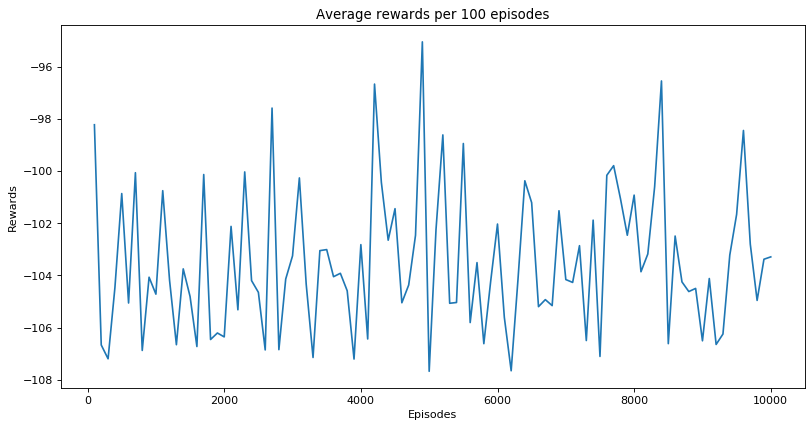

In [11]:
#Plot the average rewards per 100 episodes
plt.figure(figsize=(12,6), dpi=80)
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.title('Average rewards per 100 episodes')
plt.plot(df['Episodes'], df['Avg_Reward'])

# Calculate Average Rewards per 50 Episodes

In [12]:
sum_rewards = 0
avg_rewards_per_50 = []

for i in range (1, len(episodes_rewards_list)+1):
    sum_rewards += episodes_rewards_list[i-1] 
    if (i%50) == 0 :
        avg_rewards_per_50.append(sum_rewards/50)
        sum_rewards=0
    if (i==len(episodes_rewards_list)):
        if (i%50==0):
            break
        else:
            avg_rewards_per_50.append(sum_rewards/(i%50))

len(avg_rewards_per_50)

200

In [13]:
df_50 = pd.DataFrame()
df_50 = df_50.fillna(0)
df_50['Avg_Reward'] = avg_rewards_per_50
df_50['Episodes'] = (df_50.index+1)*50

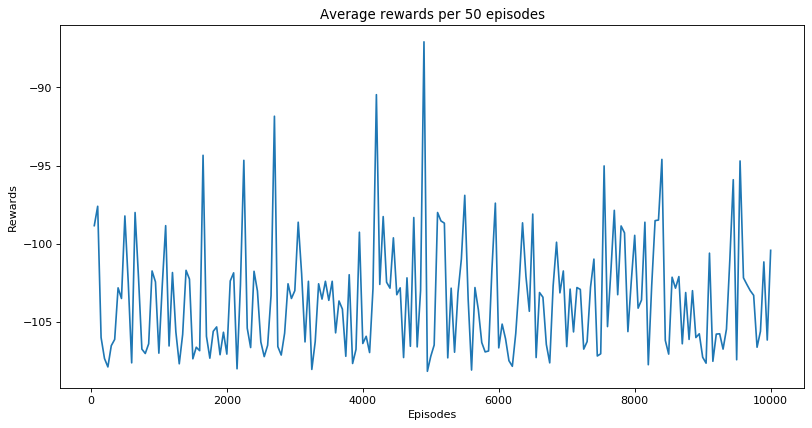

In [14]:
#Plot the average rewards per 50 episodes
plt.figure(figsize=(12,6), dpi=80)
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.title('Average rewards per 50 episodes')
plt.plot(df_50['Episodes'], df_50['Avg_Reward'])

# Calculate Average Rewards per 10 Episodes

In [15]:
sum_rewards = 0
avg_rewards_per_10 = []

for i in range (1, len(episodes_rewards_list)+1):
    sum_rewards += episodes_rewards_list[i-1] 
    if (i%10) == 0 :
        avg_rewards_per_10.append(sum_rewards/10)
        sum_rewards=0
    if (i==len(episodes_rewards_list)):
        if (i%10==0):
            break
        else:
            avg_rewards_per_10.append(sum_rewards/(i%10))
        
len(avg_rewards_per_10)

1000

In [16]:
df_10 = pd.DataFrame()
df_10 = df_10.fillna(0)
df_10['Avg_Reward'] = avg_rewards_per_10
df_10['Episodes'] = (df_10.index+1)*10

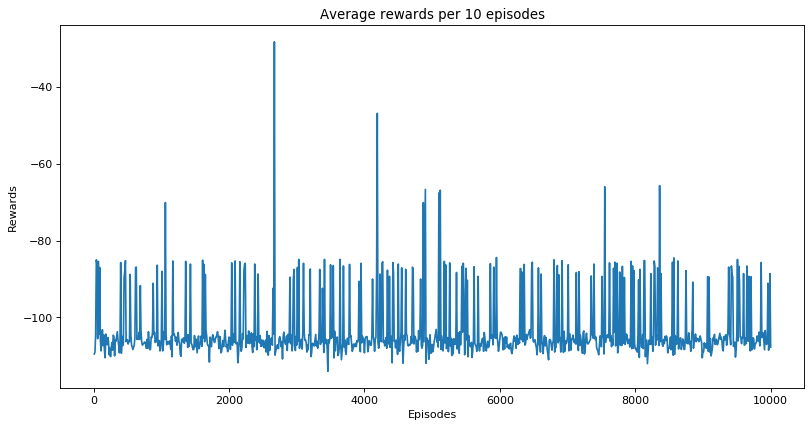

In [17]:
#Plot the average rewards per 10 episodes
plt.figure(figsize=(12,6), dpi=80)
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.title('Average rewards per 10 episodes')
plt.plot(df_10['Episodes'], df_10['Avg_Reward'])

# Calculate Reward per episode

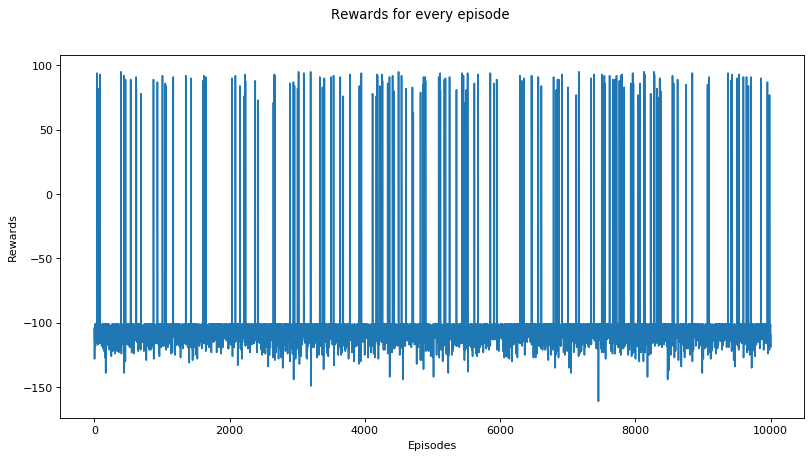

In [18]:
#%% Plot the reward for every episode
reward_per_episode = pd.DataFrame(np.asarray(episodes_rewards_list)) 
reward_per_episode['episodes'] = reward_per_episode.index
reward_per_episode.columns = ['total_reward', 'episodes']


plt.figure(figsize=(12, 6), dpi=80)
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.suptitle('Rewards for every episode')
plt.plot(reward_per_episode['episodes'], reward_per_episode['total_reward'])